# Run Image Pipeline and Create Source Catalog

In this run, we are starting from the rate files which have already been calibrated with the detector1 pipeline. This will save time as we do not need to edit any of the steps being performed as part of detector1. Therefore, the first calibration that should be done as part of a WFSS run is to run the rate files direct images through the Image2 and Image3 steps of the JWST pipeline. This includes creating a source catalog, which most likely will need to be adjusted from the pipeline default values. **Not having a good source catalog will result in non optimal extraction of sources in the dispersed, WFSS, images.**

**Use case**: The default parameters for the pipeline do not extract the expected sources, so custom parameters need to be set to obtain new combined image and source catalog.<br>
**Data**: JWST/NIRISS images and spectra from program 2079 observation 004. This should be stored in a single directory `data`, and can be downloaded from the previous notebook, 00_niriss_mast_query_data_setup.ipynb.<br>
**Tools**: astropy, crds, glob, jdaviz, json, jwst, matplotlib, numpy, os, pandas, urllib, warnings, zipfile<br>
**Cross-instrument**: NIRISS<br>

**Content**
- [Imports & Data Setup](#imports)
- [Default Imaging Pipeline Run](#default)
  - [Image2](#default_image2)
  - [Image3](#default_image3)
  - [Inspecting Default Results](#view_default)
- [Custom Imaging Pipeline Run](#custom)
  - [Image3](#custom_image3)
  - [Inspecting Custom Results](#view_custom)
- [Refining the Source Catalog Further](#source_cat)
  - [Matching Source IDs Across Catalogs](#match_sources) 
  - [Manually Editing the Source Catalog](#manual_cat)

**Author**: Rachel Plesha (rplesha@stsci.edu), Camilla Pacifici (cpacifici@stsci.edu), JWebbinar notebooks.<br>
**First Published**: May 2024 <br>
**Last tested**: This notebook was last tested with JWST pipeline version 1.12.5 and the CRDS context jwst_1225.pmap.

<a id='imports'></a>
## Imports & Data Setup

[CRDS Documentation](https://jwst-pipeline.readthedocs.io/en/latest/jwst/user_documentation/reference_files_crds.html#crds)

In [1]:
# Update the CRDS path to your local directory
%env CRDS_PATH=crds_cache
%env CRDS_SERVER_URL=https://jwst-crds.stsci.edu

env: CRDS_PATH=crds_cache
env: CRDS_SERVER_URL=https://jwst-crds.stsci.edu


In [2]:
import os
import glob
import json
import warnings
import urllib
import zipfile
import numpy as np
import pandas as pd

import astropy.units as u
from astropy.io import fits
from astropy.coordinates import SkyCoord
from astropy.table import Table

from jdaviz import Imviz
from matplotlib import pyplot as plt
%matplotlib widget
# %matplotlib inline

from jwst.pipeline import Image2Pipeline
from jwst.pipeline import Image3Pipeline

Check what version of the JWST pipeline you are using. To see what the latest version of the pipeline is available or install a previous version, check [GitHub](https://github.com/spacetelescope/jwst#software-vs-dms-build-version-map"). Also verify what [CRDS version](https://jwst-crds.stsci.edu/) you are using. [CRDS documentation](https://jwst-pipeline.readthedocs.io/en/latest/jwst/user_documentation/reference_files_crds.html) explains how to set a specific context to use in the JWST pipeline. If either of these values are different from the last tested note above there may be differences in this notebook.

In [3]:
import jwst
import crds
print('JWST Pipeliene Version:', jwst.__version__)
print('CRDS Context:', crds.get_context_name('jwst'))

JWST Pipeliene Version: 1.16.0


CRDS - INFO -  Calibration SW Found: jwst 1.16.0 (/opt/hostedtoolcache/Python/3.11.10/x64/lib/python3.11/site-packages/jwst-1.16.0.dist-info)


CRDS - INFO -  Server build context could not be identified. Using 'latest' instead.


CRDS Context: jwst_1293.pmap


The data directory, `data_dir` here should contain all of the association and rate files in a single, flat directory. `default_run_image3` and `custom_run_image3` are directories that we will use later for our calibrated data. They are separated so that we can compare the two outputs.

In [4]:
data_dir = 'data'
default_run_image3 = 'default_image3_calibrated' # where the results of the default image3 run will be saved (inside of data_dir)
custom_run_image3 = 'custom_image3_calibrated'# where the results of the custom image3 run will be saved (inside of data_dir)

The association files expect that 1) all of the data are in the same directory and 2) that you are performing the pipeline call also in that directory. Because of that, we need to change into the data directory to run the imaging pipelines.

In [5]:
# if you have not downloaded the data from notebook 00, run this cell. Otherwise, feel free to skip it.

# Download uncalibrated data from Box into the data directory:
boxlink = 'https://data.science.stsci.edu/redirect/JWST/jwst-data_analysis_tools/niriss_wfss_advanced/niriss_wfss_advanced_01_input.zip'
boxfile = os.path.basename(boxlink)
urllib.request.urlretrieve(boxlink, boxfile)

zf = zipfile.ZipFile(boxfile, 'r')
zf.extractall(path=data_dir)

# move the files downloaded from the box file into the top level data directory
box_download_dir = os.path.join(data_dir, boxfile.split('.zip')[0])
for filename in glob.glob(os.path.join(box_download_dir, '*')):
    if '.csv' in filename:
        # move to the current directory
        os.rename(filename, os.path.basename(filename))
    else:
        # move to the data directory 
        os.rename(filename, os.path.join(data_dir, os.path.basename(filename)))

# remove unnecessary files now
os.remove(boxfile)
os.rmdir(box_download_dir)

In [6]:
# From the csv file we created earlier, find a list of all of the grism observations we will want to calibrate with spec2
listrate_file = 'list_ngdeep_rate.csv'
rate_df = pd.read_csv(listrate_file)

In [7]:
cwd = os.getcwd() # get the current working directory 
if cwd != data_dir: # if you are not already in the location of the data, change into it
    try:
        os.chdir(data_dir)
    except FileNotFoundError:
        print(f"Not able to change into: {data_dir}.\nRemaining in: {cwd}")
        pass

In [8]:
for temp_dir in [default_run_image3, custom_run_image3]:
    if not os.path.exists(temp_dir):
        os.mkdir(temp_dir)

<a id='default'></a>
## Default Imaging Pipeline Run
To start, run the default image2 and image3 steps of the pipeline on all direct images observed with the WFSS data.

<a id='default_image2'></a>
### Run Default Image2

Image2 is run on the direct image rate files. While your program should have valid association files to download from MAST, if for any reason you need to make your own association file, see [Creating Custom ASN Files](#customasn).

#### Looking in a Level 2 Imaging Association File
First, take a look inside the association (ASN) files to better understand everything that is contained in them.

For image2 association files, there should be one asn file for each dither position in an observing sequence which is set by the [exposure strategy](https://jwst-docs.stsci.edu/jwst-near-infrared-imager-and-slitless-spectrograph/niriss-observing-strategies/niriss-wfss-recommended-strategies). In this case, that should match the number of direct images (`FILTER=CLEAR`) in `rate_df` because each direct image is at a unique dither position (XOFFSET, YOFFSET) within an observing sequence. For this program and observation, there is one direct image before a grism change with only one dither, another direct image with four dithers between the change in grisms, and a direct image at the end of a sequence with three dithers. This leads to a total of eight images per observing sequence, with five observing sequences in the observation using the blocking filters F115W -> F115W -> F150W -> F150W -> F200W.

In [9]:
image2_asns = glob.glob('*image2*asn*.json')
print(len(image2_asns), 'Image2 ASN files') # there should be 40 asn files for image2

# the number of association files should match the number of rate files
print(len(rate_df[rate_df['FILTER'] == 'CLEAR']), 'Direct Image rate files')

40 Image2 ASN files
40 Direct Image rate files


In [10]:
# look at one of the association files
asn_data = json.load(open(image2_asns[0]))
for key, data in asn_data.items():
    print(f"{key} : {data}")

asn_type : image2
asn_rule : candidate_Asn_Lv2Image
version_id : 20231119t124442
code_version : 1.11.4
degraded_status : No known degraded exposures in association.
program : 02079
constraints : DMSAttrConstraint({'name': 'program', 'sources': ['program'], 'value': '2079'})
DMSAttrConstraint({'name': 'is_tso', 'sources': ['tsovisit'], 'value': None})
DMSAttrConstraint({'name': 'instrument', 'sources': ['instrume'], 'value': 'niriss'})
DMSAttrConstraint({'name': 'detector', 'sources': ['detector'], 'value': 'nis'})
DMSAttrConstraint({'name': 'opt_elem', 'sources': ['filter'], 'value': 'clear'})
DMSAttrConstraint({'name': 'opt_elem2', 'sources': ['pupil'], 'value': 'f115w'})
DMSAttrConstraint({'name': 'opt_elem3', 'sources': ['fxd_slit'], 'value': None})
DMSAttrConstraint({'name': 'subarray', 'sources': ['subarray'], 'value': 'full'})
DMSAttrConstraint({'name': 'channel', 'sources': ['channel'], 'value': None})
DMSAttrConstraint({'name': 'slit', 'sources': ['fxd_slit'], 'value': None})
C

From this association, we can tell many things about the observation:
1. From `asn_type` and `asn_rule`, we can see that this is an image2 association
2. From `degraded_status` we can see that there are no exposures to not be included in the calibration.
3. From `constraints`, we can see this is not a time series observation (TSO), the observation is part of program 2079, observed with NIRISS with the CLEAR (i.e. imaging for WFSS) and F150W filters.
4. From `products` we can see there is only one exposure associated. This is typical for image2 where there is usually only one exposure per dither per observing sequence.

In [11]:
# in particular, take a closer look at the product filenames with the association file:
for product in asn_data['products']:
    for key, value in product.items():
        if key == 'members':
            print(f"{key}:")
            for member in value:
                print(f"    {member['expname']} {member['exptype']}")
        else:
            print(f"{key}: {value}")

name: jw02079004001_12101_00003_nis
members:
    jw02079004001_12101_00003_nis_rate.fits science


#### Run image2

The `rate.fits` products will be calibrated into `cal.fits` files. More information about the steps performed in the Image2 part of the pipeline can be found in the [Image2 pipeline documentation](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_image2.html).

In this case, we're saving the outputs to the same directory we are running the pipeline in so that we can then use the output `cal` files to run the Image3 pipeline

In [12]:
for img2_asn in image2_asns:
    # check if the calibrated file already exists
    asn_data = json.load(open(img2_asn))
    cal_file = f"{asn_data['products'][0]['name']}_cal.fits"
    if os.path.exists(cal_file):
        print(cal_file, 'cal file already exists.')
        continue
    # if not, calibrated with image2
    img2 = Image2Pipeline.call(img2_asn, save_results=True)

2024-10-09 14:51:20,443 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_system_datalvl_0002.rmap       694 bytes  (1 / 199 files) (0 / 716.1 K bytes)


2024-10-09 14:51:20,515 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_system_calver_0038.rmap      4.8 K bytes  (2 / 199 files) (694 / 716.1 K bytes)


2024-10-09 14:51:20,586 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_system_0037.imap               385 bytes  (3 / 199 files) (5.5 K / 716.1 K bytes)


2024-10-09 14:51:20,670 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_wavelengthrange_0024.rmap    1.4 K bytes  (4 / 199 files) (5.9 K / 716.1 K bytes)


2024-10-09 14:51:20,768 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_wavecorr_0005.rmap      884 bytes  (5 / 199 files) (7.3 K / 716.1 K bytes)


2024-10-09 14:51:20,830 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_superbias_0074.rmap   33.8 K bytes  (6 / 199 files) (8.2 K / 716.1 K bytes)


2024-10-09 14:51:20,929 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_sflat_0026.rmap     20.6 K bytes  (7 / 199 files) (41.9 K / 716.1 K bytes)


2024-10-09 14:51:21,002 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_saturation_0018.rmap    2.0 K bytes  (8 / 199 files) (62.5 K / 716.1 K bytes)


2024-10-09 14:51:21,103 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_refpix_0015.rmap     1.6 K bytes  (9 / 199 files) (64.5 K / 716.1 K bytes)


2024-10-09 14:51:21,164 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_readnoise_0025.rmap    2.6 K bytes  (10 / 199 files) (66.1 K / 716.1 K bytes)


2024-10-09 14:51:21,320 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_photom_0013.rmap       958 bytes  (11 / 199 files) (68.7 K / 716.1 K bytes)


2024-10-09 14:51:21,404 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pathloss_0007.rmap    1.1 K bytes  (12 / 199 files) (69.6 K / 716.1 K bytes)


2024-10-09 14:51:21,483 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-whitelightstep_0001.rmap      777 bytes  (13 / 199 files) (70.8 K / 716.1 K bytes)


2024-10-09 14:51:21,550 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-spec2pipeline_0013.rmap    2.1 K bytes  (14 / 199 files) (71.5 K / 716.1 K bytes)


2024-10-09 14:51:21,610 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-resamplespecstep_0002.rmap      709 bytes  (15 / 199 files) (73.6 K / 716.1 K bytes)


2024-10-09 14:51:21,680 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-outlierdetectionstep_0002.rmap      852 bytes  (16 / 199 files) (74.4 K / 716.1 K bytes)


2024-10-09 14:51:21,748 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-jumpstep_0005.rmap      810 bytes  (17 / 199 files) (75.2 K / 716.1 K bytes)


2024-10-09 14:51:21,810 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-image2pipeline_0008.rmap    1.0 K bytes  (18 / 199 files) (76.0 K / 716.1 K bytes)


2024-10-09 14:51:21,870 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-detector1pipeline_0003.rmap    1.1 K bytes  (19 / 199 files) (77.0 K / 716.1 K bytes)


2024-10-09 14:51:21,931 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-darkpipeline_0003.rmap      872 bytes  (20 / 199 files) (78.1 K / 716.1 K bytes)


2024-10-09 14:51:22,006 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_pars-darkcurrentstep_0001.rmap      622 bytes  (21 / 199 files) (78.9 K / 716.1 K bytes)


2024-10-09 14:51:22,092 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ote_0030.rmap        1.3 K bytes  (22 / 199 files) (79.6 K / 716.1 K bytes)


2024-10-09 14:51:22,154 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_msaoper_0014.rmap    1.4 K bytes  (23 / 199 files) (80.8 K / 716.1 K bytes)


2024-10-09 14:51:22,213 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_msa_0027.rmap        1.3 K bytes  (24 / 199 files) (82.3 K / 716.1 K bytes)


2024-10-09 14:51:22,274 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_mask_0039.rmap       2.7 K bytes  (25 / 199 files) (83.5 K / 716.1 K bytes)


2024-10-09 14:51:22,385 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_linearity_0017.rmap    1.6 K bytes  (26 / 199 files) (86.2 K / 716.1 K bytes)


2024-10-09 14:51:22,445 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ipc_0006.rmap          876 bytes  (27 / 199 files) (87.8 K / 716.1 K bytes)


2024-10-09 14:51:22,581 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ifuslicer_0017.rmap    1.5 K bytes  (28 / 199 files) (88.6 K / 716.1 K bytes)


2024-10-09 14:51:22,643 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ifupost_0019.rmap    1.5 K bytes  (29 / 199 files) (90.2 K / 716.1 K bytes)


2024-10-09 14:51:22,704 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_ifufore_0017.rmap    1.5 K bytes  (30 / 199 files) (91.7 K / 716.1 K bytes)


2024-10-09 14:51:22,802 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_gain_0023.rmap       1.8 K bytes  (31 / 199 files) (93.2 K / 716.1 K bytes)


2024-10-09 14:51:22,864 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_fpa_0028.rmap        1.3 K bytes  (32 / 199 files) (94.9 K / 716.1 K bytes)


2024-10-09 14:51:22,922 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_fore_0026.rmap       5.0 K bytes  (33 / 199 files) (96.2 K / 716.1 K bytes)


2024-10-09 14:51:23,000 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_flat_0015.rmap       3.8 K bytes  (34 / 199 files) (101.1 K / 716.1 K bytes)


2024-10-09 14:51:23,058 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_fflat_0024.rmap      7.2 K bytes  (35 / 199 files) (105.0 K / 716.1 K bytes)


2024-10-09 14:51:23,122 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_extract1d_0018.rmap    2.3 K bytes  (36 / 199 files) (112.2 K / 716.1 K bytes)


2024-10-09 14:51:23,211 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_disperser_0028.rmap    5.7 K bytes  (37 / 199 files) (114.5 K / 716.1 K bytes)


2024-10-09 14:51:23,269 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_dflat_0007.rmap      1.1 K bytes  (38 / 199 files) (120.2 K / 716.1 K bytes)


2024-10-09 14:51:23,335 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_dark_0069.rmap      32.6 K bytes  (39 / 199 files) (121.3 K / 716.1 K bytes)


2024-10-09 14:51:23,418 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_cubepar_0015.rmap      966 bytes  (40 / 199 files) (153.9 K / 716.1 K bytes)


2024-10-09 14:51:23,476 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_collimator_0026.rmap    1.3 K bytes  (41 / 199 files) (154.9 K / 716.1 K bytes)


2024-10-09 14:51:23,537 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_camera_0026.rmap     1.3 K bytes  (42 / 199 files) (156.2 K / 716.1 K bytes)


2024-10-09 14:51:23,596 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_barshadow_0007.rmap    1.8 K bytes  (43 / 199 files) (157.5 K / 716.1 K bytes)


2024-10-09 14:51:23,656 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_area_0018.rmap       6.3 K bytes  (44 / 199 files) (159.3 K / 716.1 K bytes)


2024-10-09 14:51:23,715 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_apcorr_0009.rmap     5.6 K bytes  (45 / 199 files) (165.5 K / 716.1 K bytes)


2024-10-09 14:51:23,777 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nirspec_0379.imap            5.6 K bytes  (46 / 199 files) (171.1 K / 716.1 K bytes)


2024-10-09 14:51:23,845 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_wfssbkg_0007.rmap     3.1 K bytes  (47 / 199 files) (176.7 K / 716.1 K bytes)


2024-10-09 14:51:23,931 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_wavemap_0008.rmap     2.2 K bytes  (48 / 199 files) (179.8 K / 716.1 K bytes)


2024-10-09 14:51:23,992 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_wavelengthrange_0006.rmap      862 bytes  (49 / 199 files) (182.0 K / 716.1 K bytes)


2024-10-09 14:51:24,055 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_trappars_0004.rmap      753 bytes  (50 / 199 files) (182.9 K / 716.1 K bytes)


2024-10-09 14:51:24,115 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_trapdensity_0005.rmap      705 bytes  (51 / 199 files) (183.7 K / 716.1 K bytes)


2024-10-09 14:51:24,174 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_throughput_0005.rmap    1.3 K bytes  (52 / 199 files) (184.4 K / 716.1 K bytes)


2024-10-09 14:51:24,241 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_superbias_0028.rmap    6.5 K bytes  (53 / 199 files) (185.6 K / 716.1 K bytes)


2024-10-09 14:51:24,303 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_specwcs_0014.rmap     3.1 K bytes  (54 / 199 files) (192.1 K / 716.1 K bytes)


2024-10-09 14:51:24,363 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_spectrace_0008.rmap    2.3 K bytes  (55 / 199 files) (195.2 K / 716.1 K bytes)


2024-10-09 14:51:24,422 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_specprofile_0008.rmap    2.4 K bytes  (56 / 199 files) (197.6 K / 716.1 K bytes)


2024-10-09 14:51:24,526 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_speckernel_0006.rmap    1.0 K bytes  (57 / 199 files) (199.9 K / 716.1 K bytes)


2024-10-09 14:51:24,583 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_saturation_0015.rmap      829 bytes  (58 / 199 files) (201.0 K / 716.1 K bytes)


2024-10-09 14:51:24,642 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_readnoise_0011.rmap      987 bytes  (59 / 199 files) (201.8 K / 716.1 K bytes)


2024-10-09 14:51:24,707 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_photom_0035.rmap      1.3 K bytes  (60 / 199 files) (202.8 K / 716.1 K bytes)


2024-10-09 14:51:24,765 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_persat_0007.rmap        674 bytes  (61 / 199 files) (204.0 K / 716.1 K bytes)


2024-10-09 14:51:24,827 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pathloss_0003.rmap      758 bytes  (62 / 199 files) (204.7 K / 716.1 K bytes)


2024-10-09 14:51:24,885 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-undersamplecorrectionstep_0001.rmap      904 bytes  (63 / 199 files) (205.5 K / 716.1 K bytes)


2024-10-09 14:51:24,947 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-tweakregstep_0012.rmap    3.1 K bytes  (64 / 199 files) (206.4 K / 716.1 K bytes)


2024-10-09 14:51:25,005 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-spec2pipeline_0008.rmap      984 bytes  (65 / 199 files) (209.5 K / 716.1 K bytes)


2024-10-09 14:51:25,063 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-sourcecatalogstep_0002.rmap    2.3 K bytes  (66 / 199 files) (210.5 K / 716.1 K bytes)


2024-10-09 14:51:25,122 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-resamplestep_0002.rmap      687 bytes  (67 / 199 files) (212.8 K / 716.1 K bytes)


2024-10-09 14:51:25,183 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-outlierdetectionstep_0004.rmap    2.7 K bytes  (68 / 199 files) (213.5 K / 716.1 K bytes)


2024-10-09 14:51:25,271 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-jumpstep_0007.rmap    6.4 K bytes  (69 / 199 files) (216.1 K / 716.1 K bytes)


2024-10-09 14:51:25,332 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-image2pipeline_0005.rmap    1.0 K bytes  (70 / 199 files) (222.5 K / 716.1 K bytes)


2024-10-09 14:51:25,395 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-detector1pipeline_0002.rmap    1.0 K bytes  (71 / 199 files) (223.5 K / 716.1 K bytes)


2024-10-09 14:51:25,453 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-darkpipeline_0002.rmap      868 bytes  (72 / 199 files) (224.6 K / 716.1 K bytes)


2024-10-09 14:51:25,512 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-darkcurrentstep_0001.rmap      591 bytes  (73 / 199 files) (225.4 K / 716.1 K bytes)


2024-10-09 14:51:25,572 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_pars-chargemigrationstep_0004.rmap    5.7 K bytes  (74 / 199 files) (226.0 K / 716.1 K bytes)


2024-10-09 14:51:25,638 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_nrm_0002.rmap           663 bytes  (75 / 199 files) (231.7 K / 716.1 K bytes)


2024-10-09 14:51:25,703 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_mask_0020.rmap          859 bytes  (76 / 199 files) (232.3 K / 716.1 K bytes)


2024-10-09 14:51:25,761 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_linearity_0022.rmap      961 bytes  (77 / 199 files) (233.2 K / 716.1 K bytes)


2024-10-09 14:51:25,819 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_ipc_0007.rmap           651 bytes  (78 / 199 files) (234.2 K / 716.1 K bytes)


2024-10-09 14:51:25,877 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_gain_0011.rmap          797 bytes  (79 / 199 files) (234.8 K / 716.1 K bytes)


2024-10-09 14:51:25,935 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_flat_0023.rmap        5.9 K bytes  (80 / 199 files) (235.6 K / 716.1 K bytes)


2024-10-09 14:51:25,992 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_filteroffset_0010.rmap      853 bytes  (81 / 199 files) (241.5 K / 716.1 K bytes)


2024-10-09 14:51:26,050 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_extract1d_0007.rmap      905 bytes  (82 / 199 files) (242.3 K / 716.1 K bytes)


2024-10-09 14:51:26,108 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_drizpars_0004.rmap      519 bytes  (83 / 199 files) (243.2 K / 716.1 K bytes)


2024-10-09 14:51:26,168 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_distortion_0025.rmap    3.4 K bytes  (84 / 199 files) (243.8 K / 716.1 K bytes)


2024-10-09 14:51:26,226 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_dark_0031.rmap        6.8 K bytes  (85 / 199 files) (247.2 K / 716.1 K bytes)


2024-10-09 14:51:26,317 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_area_0014.rmap        2.7 K bytes  (86 / 199 files) (254.0 K / 716.1 K bytes)


2024-10-09 14:51:26,377 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_apcorr_0010.rmap      4.3 K bytes  (87 / 199 files) (256.7 K / 716.1 K bytes)


2024-10-09 14:51:26,441 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_abvegaoffset_0004.rmap    1.4 K bytes  (88 / 199 files) (261.0 K / 716.1 K bytes)


2024-10-09 14:51:26,502 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_niriss_0256.imap             5.6 K bytes  (89 / 199 files) (262.3 K / 716.1 K bytes)


2024-10-09 14:51:26,565 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_wfssbkg_0004.rmap     7.2 K bytes  (90 / 199 files) (268.0 K / 716.1 K bytes)


2024-10-09 14:51:26,629 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_wavelengthrange_0010.rmap      996 bytes  (91 / 199 files) (275.2 K / 716.1 K bytes)


2024-10-09 14:51:26,687 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_tsophot_0003.rmap       896 bytes  (92 / 199 files) (276.2 K / 716.1 K bytes)


2024-10-09 14:51:26,748 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_trappars_0003.rmap    1.6 K bytes  (93 / 199 files) (277.0 K / 716.1 K bytes)


2024-10-09 14:51:26,807 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_trapdensity_0003.rmap    1.6 K bytes  (94 / 199 files) (278.6 K / 716.1 K bytes)


2024-10-09 14:51:26,868 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_superbias_0017.rmap   16.1 K bytes  (95 / 199 files) (280.3 K / 716.1 K bytes)


2024-10-09 14:51:26,938 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_specwcs_0022.rmap     7.1 K bytes  (96 / 199 files) (296.3 K / 716.1 K bytes)


2024-10-09 14:51:26,995 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_saturation_0010.rmap    2.2 K bytes  (97 / 199 files) (303.4 K / 716.1 K bytes)


2024-10-09 14:51:27,054 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_readnoise_0024.rmap   23.1 K bytes  (98 / 199 files) (305.6 K / 716.1 K bytes)


2024-10-09 14:51:27,123 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_psfmask_0008.rmap    28.4 K bytes  (99 / 199 files) (328.7 K / 716.1 K bytes)


2024-10-09 14:51:27,193 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_photom_0028.rmap      3.4 K bytes  (100 / 199 files) (357.0 K / 716.1 K bytes)


2024-10-09 14:51:27,252 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_persat_0005.rmap      1.6 K bytes  (101 / 199 files) (360.4 K / 716.1 K bytes)


2024-10-09 14:51:27,310 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-whitelightstep_0003.rmap    1.5 K bytes  (102 / 199 files) (361.9 K / 716.1 K bytes)


2024-10-09 14:51:27,368 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-tweakregstep_0003.rmap    4.5 K bytes  (103 / 199 files) (363.4 K / 716.1 K bytes)


2024-10-09 14:51:27,429 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-spec2pipeline_0008.rmap      984 bytes  (104 / 199 files) (367.9 K / 716.1 K bytes)


2024-10-09 14:51:27,524 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-sourcecatalogstep_0002.rmap    4.6 K bytes  (105 / 199 files) (368.9 K / 716.1 K bytes)


2024-10-09 14:51:27,584 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-resamplestep_0002.rmap      687 bytes  (106 / 199 files) (373.5 K / 716.1 K bytes)


2024-10-09 14:51:27,643 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-outlierdetectionstep_0003.rmap      940 bytes  (107 / 199 files) (374.2 K / 716.1 K bytes)


2024-10-09 14:51:27,702 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-jumpstep_0005.rmap      806 bytes  (108 / 199 files) (375.1 K / 716.1 K bytes)


2024-10-09 14:51:27,762 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-image2pipeline_0003.rmap    1.0 K bytes  (109 / 199 files) (375.9 K / 716.1 K bytes)


2024-10-09 14:51:27,821 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-detector1pipeline_0003.rmap    1.0 K bytes  (110 / 199 files) (377.0 K / 716.1 K bytes)


2024-10-09 14:51:27,881 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-darkpipeline_0002.rmap      868 bytes  (111 / 199 files) (378.0 K / 716.1 K bytes)


2024-10-09 14:51:27,938 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_pars-darkcurrentstep_0001.rmap      618 bytes  (112 / 199 files) (378.9 K / 716.1 K bytes)


2024-10-09 14:51:27,996 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_mask_0011.rmap        3.5 K bytes  (113 / 199 files) (379.5 K / 716.1 K bytes)


2024-10-09 14:51:28,055 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_linearity_0011.rmap    2.4 K bytes  (114 / 199 files) (383.0 K / 716.1 K bytes)


2024-10-09 14:51:28,116 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_ipc_0003.rmap         2.0 K bytes  (115 / 199 files) (385.4 K / 716.1 K bytes)


2024-10-09 14:51:28,176 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_gain_0016.rmap        2.1 K bytes  (116 / 199 files) (387.4 K / 716.1 K bytes)


2024-10-09 14:51:28,236 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_flat_0027.rmap       51.7 K bytes  (117 / 199 files) (389.5 K / 716.1 K bytes)


2024-10-09 14:51:28,316 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_filteroffset_0004.rmap    1.4 K bytes  (118 / 199 files) (441.2 K / 716.1 K bytes)


2024-10-09 14:51:28,377 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_extract1d_0004.rmap      842 bytes  (119 / 199 files) (442.6 K / 716.1 K bytes)


2024-10-09 14:51:28,439 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_drizpars_0001.rmap      519 bytes  (120 / 199 files) (443.4 K / 716.1 K bytes)


2024-10-09 14:51:28,503 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_distortion_0033.rmap   53.4 K bytes  (121 / 199 files) (444.0 K / 716.1 K bytes)


2024-10-09 14:51:28,587 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_dark_0044.rmap       26.3 K bytes  (122 / 199 files) (497.3 K / 716.1 K bytes)


2024-10-09 14:51:28,657 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_area_0012.rmap       33.5 K bytes  (123 / 199 files) (523.6 K / 716.1 K bytes)


2024-10-09 14:51:28,753 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_apcorr_0008.rmap      4.3 K bytes  (124 / 199 files) (557.2 K / 716.1 K bytes)


2024-10-09 14:51:28,816 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_abvegaoffset_0003.rmap    1.3 K bytes  (125 / 199 files) (561.4 K / 716.1 K bytes)


2024-10-09 14:51:28,874 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_nircam_0294.imap             5.4 K bytes  (126 / 199 files) (562.7 K / 716.1 K bytes)


2024-10-09 14:51:28,931 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_wavelengthrange_0027.rmap      929 bytes  (127 / 199 files) (568.1 K / 716.1 K bytes)


2024-10-09 14:51:28,995 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_tsophot_0004.rmap         882 bytes  (128 / 199 files) (569.1 K / 716.1 K bytes)


2024-10-09 14:51:29,056 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_straymask_0009.rmap       987 bytes  (129 / 199 files) (570.0 K / 716.1 K bytes)


2024-10-09 14:51:29,119 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_specwcs_0042.rmap       5.8 K bytes  (130 / 199 files) (570.9 K / 716.1 K bytes)


2024-10-09 14:51:29,183 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_saturation_0015.rmap    1.2 K bytes  (131 / 199 files) (576.7 K / 716.1 K bytes)


2024-10-09 14:51:29,246 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_rscd_0008.rmap          1.0 K bytes  (132 / 199 files) (577.9 K / 716.1 K bytes)


2024-10-09 14:51:29,310 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_resol_0006.rmap           790 bytes  (133 / 199 files) (578.9 K / 716.1 K bytes)


2024-10-09 14:51:29,371 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_reset_0026.rmap         3.9 K bytes  (134 / 199 files) (579.7 K / 716.1 K bytes)


2024-10-09 14:51:29,430 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_regions_0033.rmap       5.2 K bytes  (135 / 199 files) (583.6 K / 716.1 K bytes)


2024-10-09 14:51:29,489 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_readnoise_0023.rmap     1.6 K bytes  (136 / 199 files) (588.8 K / 716.1 K bytes)


2024-10-09 14:51:29,567 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_psfmask_0009.rmap       2.1 K bytes  (137 / 199 files) (590.4 K / 716.1 K bytes)


2024-10-09 14:51:29,634 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_photom_0056.rmap        3.7 K bytes  (138 / 199 files) (592.6 K / 716.1 K bytes)


2024-10-09 14:51:29,694 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pathloss_0005.rmap        866 bytes  (139 / 199 files) (596.3 K / 716.1 K bytes)


2024-10-09 14:51:29,757 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-whitelightstep_0003.rmap      912 bytes  (140 / 199 files) (597.2 K / 716.1 K bytes)


2024-10-09 14:51:29,819 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-tweakregstep_0003.rmap    1.8 K bytes  (141 / 199 files) (598.1 K / 716.1 K bytes)


2024-10-09 14:51:29,883 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-spec3pipeline_0008.rmap      816 bytes  (142 / 199 files) (599.9 K / 716.1 K bytes)


2024-10-09 14:51:29,941 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-spec2pipeline_0012.rmap    1.3 K bytes  (143 / 199 files) (600.7 K / 716.1 K bytes)


2024-10-09 14:51:29,999 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-sourcecatalogstep_0003.rmap    1.9 K bytes  (144 / 199 files) (602.1 K / 716.1 K bytes)


2024-10-09 14:51:30,058 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-resamplestep_0002.rmap      677 bytes  (145 / 199 files) (604.0 K / 716.1 K bytes)


2024-10-09 14:51:30,126 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-resamplespecstep_0002.rmap      706 bytes  (146 / 199 files) (604.6 K / 716.1 K bytes)


2024-10-09 14:51:30,194 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-outlierdetectionstep_0017.rmap    3.4 K bytes  (147 / 199 files) (605.3 K / 716.1 K bytes)


2024-10-09 14:51:30,253 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-jumpstep_0009.rmap    1.4 K bytes  (148 / 199 files) (608.7 K / 716.1 K bytes)


2024-10-09 14:51:30,320 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-image2pipeline_0007.rmap      983 bytes  (149 / 199 files) (610.2 K / 716.1 K bytes)


2024-10-09 14:51:30,385 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-extract1dstep_0002.rmap      728 bytes  (150 / 199 files) (611.1 K / 716.1 K bytes)


2024-10-09 14:51:30,448 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-emicorrstep_0002.rmap      796 bytes  (151 / 199 files) (611.9 K / 716.1 K bytes)


2024-10-09 14:51:30,528 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-detector1pipeline_0009.rmap    1.4 K bytes  (152 / 199 files) (612.7 K / 716.1 K bytes)


2024-10-09 14:51:30,594 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-darkpipeline_0002.rmap      860 bytes  (153 / 199 files) (614.1 K / 716.1 K bytes)


2024-10-09 14:51:30,658 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_pars-darkcurrentstep_0002.rmap      683 bytes  (154 / 199 files) (614.9 K / 716.1 K bytes)


2024-10-09 14:51:30,718 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_mrsxartcorr_0002.rmap    2.2 K bytes  (155 / 199 files) (615.6 K / 716.1 K bytes)


2024-10-09 14:51:30,778 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_mrsptcorr_0005.rmap     2.0 K bytes  (156 / 199 files) (617.8 K / 716.1 K bytes)


2024-10-09 14:51:30,838 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_mask_0023.rmap          3.5 K bytes  (157 / 199 files) (619.7 K / 716.1 K bytes)


2024-10-09 14:51:30,895 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_linearity_0018.rmap     2.8 K bytes  (158 / 199 files) (623.2 K / 716.1 K bytes)


2024-10-09 14:51:30,959 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_ipc_0008.rmap             700 bytes  (159 / 199 files) (626.1 K / 716.1 K bytes)


2024-10-09 14:51:31,019 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_gain_0013.rmap          3.9 K bytes  (160 / 199 files) (626.8 K / 716.1 K bytes)


2024-10-09 14:51:31,078 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_fringefreq_0003.rmap    1.4 K bytes  (161 / 199 files) (630.7 K / 716.1 K bytes)


2024-10-09 14:51:31,139 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_fringe_0019.rmap        3.9 K bytes  (162 / 199 files) (632.1 K / 716.1 K bytes)


2024-10-09 14:51:31,198 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_flat_0065.rmap         15.5 K bytes  (163 / 199 files) (636.0 K / 716.1 K bytes)


2024-10-09 14:51:31,269 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_filteroffset_0025.rmap    2.5 K bytes  (164 / 199 files) (651.5 K / 716.1 K bytes)


2024-10-09 14:51:31,330 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_extract1d_0020.rmap     1.4 K bytes  (165 / 199 files) (654.0 K / 716.1 K bytes)


2024-10-09 14:51:31,393 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_emicorr_0003.rmap         663 bytes  (166 / 199 files) (655.4 K / 716.1 K bytes)


2024-10-09 14:51:31,462 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_drizpars_0002.rmap        511 bytes  (167 / 199 files) (656.0 K / 716.1 K bytes)


2024-10-09 14:51:31,522 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_distortion_0040.rmap    4.9 K bytes  (168 / 199 files) (656.5 K / 716.1 K bytes)


2024-10-09 14:51:31,579 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_dark_0036.rmap          4.4 K bytes  (169 / 199 files) (661.5 K / 716.1 K bytes)


2024-10-09 14:51:31,638 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_cubepar_0017.rmap         800 bytes  (170 / 199 files) (665.8 K / 716.1 K bytes)


2024-10-09 14:51:31,700 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_area_0015.rmap            866 bytes  (171 / 199 files) (666.6 K / 716.1 K bytes)


2024-10-09 14:51:31,764 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_apcorr_0019.rmap        5.0 K bytes  (172 / 199 files) (667.5 K / 716.1 K bytes)


2024-10-09 14:51:31,821 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_abvegaoffset_0002.rmap    1.3 K bytes  (173 / 199 files) (672.4 K / 716.1 K bytes)


2024-10-09 14:51:31,882 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_miri_0415.imap               5.7 K bytes  (174 / 199 files) (673.7 K / 716.1 K bytes)


2024-10-09 14:51:31,942 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_trappars_0004.rmap         903 bytes  (175 / 199 files) (679.4 K / 716.1 K bytes)


2024-10-09 14:51:31,999 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_trapdensity_0006.rmap      930 bytes  (176 / 199 files) (680.3 K / 716.1 K bytes)


2024-10-09 14:51:32,058 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_superbias_0017.rmap      3.8 K bytes  (177 / 199 files) (681.2 K / 716.1 K bytes)


2024-10-09 14:51:32,119 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_saturation_0009.rmap       779 bytes  (178 / 199 files) (685.0 K / 716.1 K bytes)


2024-10-09 14:51:32,177 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_readnoise_0011.rmap      1.3 K bytes  (179 / 199 files) (685.8 K / 716.1 K bytes)


2024-10-09 14:51:32,239 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_photom_0014.rmap         1.1 K bytes  (180 / 199 files) (687.0 K / 716.1 K bytes)


2024-10-09 14:51:32,298 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_persat_0006.rmap           884 bytes  (181 / 199 files) (688.2 K / 716.1 K bytes)


2024-10-09 14:51:32,358 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-tweakregstep_0002.rmap      850 bytes  (182 / 199 files) (689.1 K / 716.1 K bytes)


2024-10-09 14:51:32,416 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-sourcecatalogstep_0001.rmap      636 bytes  (183 / 199 files) (689.9 K / 716.1 K bytes)


2024-10-09 14:51:32,475 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-outlierdetectionstep_0001.rmap      654 bytes  (184 / 199 files) (690.5 K / 716.1 K bytes)


2024-10-09 14:51:32,536 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-image2pipeline_0005.rmap      974 bytes  (185 / 199 files) (691.2 K / 716.1 K bytes)


2024-10-09 14:51:32,600 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-detector1pipeline_0002.rmap    1.0 K bytes  (186 / 199 files) (692.2 K / 716.1 K bytes)


2024-10-09 14:51:32,663 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_pars-darkpipeline_0002.rmap      856 bytes  (187 / 199 files) (693.2 K / 716.1 K bytes)


2024-10-09 14:51:32,721 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_mask_0023.rmap           1.1 K bytes  (188 / 199 files) (694.1 K / 716.1 K bytes)


2024-10-09 14:51:32,782 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_linearity_0015.rmap        925 bytes  (189 / 199 files) (695.1 K / 716.1 K bytes)


2024-10-09 14:51:32,850 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_ipc_0003.rmap              614 bytes  (190 / 199 files) (696.0 K / 716.1 K bytes)


2024-10-09 14:51:32,908 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_gain_0010.rmap             890 bytes  (191 / 199 files) (696.6 K / 716.1 K bytes)


2024-10-09 14:51:32,968 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_flat_0009.rmap           1.1 K bytes  (192 / 199 files) (697.5 K / 716.1 K bytes)


2024-10-09 14:51:33,024 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_distortion_0011.rmap     1.2 K bytes  (193 / 199 files) (698.7 K / 716.1 K bytes)


2024-10-09 14:51:33,085 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_dark_0017.rmap           4.3 K bytes  (194 / 199 files) (699.9 K / 716.1 K bytes)


2024-10-09 14:51:33,148 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_area_0010.rmap           1.2 K bytes  (195 / 199 files) (704.2 K / 716.1 K bytes)


2024-10-09 14:51:33,222 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_apcorr_0004.rmap         4.0 K bytes  (196 / 199 files) (705.3 K / 716.1 K bytes)


2024-10-09 14:51:33,282 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_abvegaoffset_0002.rmap    1.3 K bytes  (197 / 199 files) (709.3 K / 716.1 K bytes)


2024-10-09 14:51:33,344 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_fgs_0116.imap                5.0 K bytes  (198 / 199 files) (710.6 K / 716.1 K bytes)


2024-10-09 14:51:33,403 - CRDS - INFO -  Fetching  crds_cache/mappings/jwst/jwst_1293.pmap                      580 bytes  (199 / 199 files) (715.5 K / 716.1 K bytes)


2024-10-09 14:51:33,582 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf    1.2 K bytes  (1 / 1 files) (0 / 1.2 K bytes)


2024-10-09 14:51:33,643 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:51:33,654 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-10-09 14:51:33,725 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:51:33,739 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:51:33,740 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:51:33,741 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:51:33,742 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:51:33,743 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:51:33,744 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:51:33,899 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00475_asn.json',).


2024-10-09 14:51:33,908 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:51:33,977 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_12101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:51:33,981 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits   16.8 M bytes  (1 / 5 files) (0 / 83.9 M bytes)


2024-10-09 14:51:34,384 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf    9.9 K bytes  (2 / 5 files) (16.8 M / 83.9 M bytes)


2024-10-09 14:51:34,444 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf    5.4 K bytes  (3 / 5 files) (16.8 M / 83.9 M bytes)


2024-10-09 14:51:34,527 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits   67.1 M bytes  (4 / 5 files) (16.8 M / 83.9 M bytes)


2024-10-09 14:51:35,215 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits   11.5 K bytes  (5 / 5 files) (83.9 M / 83.9 M bytes)


2024-10-09 14:51:35,277 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:51:35,277 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:51:35,278 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:51:35,278 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:51:35,279 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:51:35,279 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:51:35,280 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:51:35,280 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:51:35,280 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:51:35,281 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:51:35,281 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:51:35,282 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:51:35,282 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:51:35,282 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:51:35,283 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:51:35,283 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:51:35,283 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:51:35,284 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:51:35,284 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:51:35,285 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:51:35,285 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:51:35,287 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:51:35,295 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_12101_00003_nis


2024-10-09 14:51:35,295 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_12101_00003_nis_rate.fits ...


2024-10-09 14:51:35,512 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:51:35,698 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:51:35,768 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148258348 -27.807029069 53.188133252 -27.794573941 53.173960548 -27.759618853 53.134121666 -27.772052827


2024-10-09 14:51:35,768 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148258348 -27.807029069 53.188133252 -27.794573941 53.173960548 -27.759618853 53.134121666 -27.772052827


2024-10-09 14:51:35,769 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:51:35,826 - CRDS - INFO -  Calibration SW Found: jwst 1.16.0 (/opt/hostedtoolcache/Python/3.11.10/x64/lib/python3.11/site-packages/jwst-1.16.0.dist-info)


2024-10-09 14:51:35,887 - CRDS - INFO -  Server build context could not be identified. Using 'latest' instead.


2024-10-09 14:51:35,888 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:51:36,043 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:51:36,139 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:51:36,140 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:51:36,140 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:51:36,141 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:51:36,517 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:51:36,681 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:51:36,706 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:51:36,707 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:51:36,751 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:51:36,752 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:51:36,752 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:51:36,752 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:51:36,753 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:51:36,784 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:51:36,784 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:51:36,786 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:51:36,835 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:51:37,007 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:51:37,008 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:51:37,009 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_12101_00003_nis


2024-10-09 14:51:37,010 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:51:37,011 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:51:37,282 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_12101_00003_nis_cal.fits


2024-10-09 14:51:37,283 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:51:37,283 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:51:37,349 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:51:37,358 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:51:37,370 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:51:37,371 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:51:37,373 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:51:37,374 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:51:37,375 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:51:37,376 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:51:37,538 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00032_asn.json',).


2024-10-09 14:51:37,547 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:51:37,614 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_06101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:51:37,617 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits   16.8 M bytes  (1 / 3 files) (0 / 83.9 M bytes)


2024-10-09 14:51:38,425 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf    9.9 K bytes  (2 / 3 files) (16.8 M / 83.9 M bytes)


2024-10-09 14:51:38,484 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits   67.1 M bytes  (3 / 3 files) (16.8 M / 83.9 M bytes)


2024-10-09 14:51:40,696 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-10-09 14:51:40,697 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:51:40,698 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:51:40,698 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:51:40,699 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:51:40,699 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-10-09 14:51:40,700 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:51:40,701 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:51:40,701 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-10-09 14:51:40,702 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:51:40,702 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:51:40,703 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:51:40,704 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:51:40,704 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:51:40,705 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:51:40,705 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:51:40,706 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:51:40,706 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:51:40,706 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:51:40,707 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:51:40,707 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:51:40,709 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:51:40,715 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_06101_00002_nis


2024-10-09 14:51:40,716 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_06101_00002_nis_rate.fits ...


2024-10-09 14:51:40,934 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:51:41,109 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-10-09 14:51:41,167 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.149462228 -27.809464399 53.189337240 -27.797007769 53.175164834 -27.762053605 53.135325224 -27.774488143


2024-10-09 14:51:41,168 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.149462228 -27.809464399 53.189337240 -27.797007769 53.175164834 -27.762053605 53.135325224 -27.774488143


2024-10-09 14:51:41,168 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:51:41,223 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:51:41,386 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:51:41,476 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-10-09 14:51:41,477 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:51:41,478 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:51:41,478 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:51:41,654 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:51:41,820 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:51:41,843 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:51:41,844 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-10-09 14:51:41,886 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:51:41,887 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:51:41,887 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:51:41,888 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:51:41,889 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-10-09 14:51:41,915 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:51:41,916 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:51:41,917 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-10-09 14:51:41,965 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:51:42,129 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:51:42,130 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:51:42,131 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_06101_00002_nis


2024-10-09 14:51:42,132 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:51:42,133 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:51:42,401 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_06101_00002_nis_cal.fits


2024-10-09 14:51:42,401 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:51:42,402 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:51:42,467 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:51:42,476 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:51:42,488 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:51:42,489 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:51:42,490 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:51:42,491 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:51:42,492 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:51:42,494 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:51:42,651 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00104_asn.json',).


2024-10-09 14:51:42,659 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:51:42,728 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_04101_00004_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:51:42,731 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-10-09 14:51:42,732 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:51:42,732 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:51:42,733 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:51:42,733 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:51:42,733 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-10-09 14:51:42,734 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:51:42,735 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:51:42,735 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-10-09 14:51:42,736 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:51:42,736 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:51:42,736 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:51:42,737 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:51:42,737 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:51:42,738 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:51:42,739 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:51:42,739 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:51:42,740 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:51:42,741 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:51:42,741 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:51:42,742 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:51:42,743 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:51:42,749 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_04101_00004_nis


2024-10-09 14:51:42,749 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_04101_00004_nis_rate.fits ...


2024-10-09 14:51:42,965 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:51:43,140 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-10-09 14:51:43,197 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.149040483 -27.809541727 53.188915548 -27.797085158 53.174743200 -27.762130973 53.134903537 -27.774565450


2024-10-09 14:51:43,198 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.149040483 -27.809541727 53.188915548 -27.797085158 53.174743200 -27.762130973 53.134903537 -27.774565450


2024-10-09 14:51:43,199 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:51:43,249 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:51:43,409 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:51:43,496 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-10-09 14:51:43,496 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:51:43,497 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:51:43,497 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:51:43,661 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:51:43,815 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:51:43,839 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:51:43,840 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-10-09 14:51:43,883 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:51:43,884 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:51:43,884 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:51:43,885 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:51:43,886 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-10-09 14:51:43,912 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:51:43,912 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:51:43,914 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-10-09 14:51:43,963 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:51:44,133 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:51:44,134 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:51:44,136 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_04101_00004_nis


2024-10-09 14:51:44,136 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:51:44,137 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:51:44,403 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_04101_00004_nis_cal.fits


2024-10-09 14:51:44,404 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:51:44,404 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:51:44,472 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:51:44,481 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:51:44,493 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:51:44,494 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:51:44,495 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:51:44,496 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:51:44,497 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:51:44,498 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:51:44,658 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00329_asn.json',).


2024-10-09 14:51:44,667 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:51:44,734 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_06101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:51:44,737 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:51:44,738 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:51:44,738 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:51:44,739 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:51:44,739 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:51:44,739 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:51:44,740 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:51:44,740 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:51:44,741 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:51:44,741 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:51:44,741 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:51:44,742 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:51:44,742 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:51:44,743 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:51:44,743 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:51:44,743 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:51:44,744 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:51:44,744 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:51:44,745 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:51:44,745 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:51:44,745 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:51:44,746 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:51:44,754 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_06101_00001_nis


2024-10-09 14:51:44,755 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_06101_00001_nis_rate.fits ...


2024-10-09 14:51:44,965 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:45,141 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:51:45,199 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148278310 -27.806888754 53.188153126 -27.794433534 53.173980338 -27.759478479 53.134141543 -27.771912545


2024-10-09 14:51:45,199 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148278310 -27.806888754 53.188153126 -27.794433534 53.173980338 -27.759478479 53.134141543 -27.771912545


2024-10-09 14:51:45,200 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:51:45,254 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:51:45,424 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:45,512 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:51:45,513 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:51:45,513 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:51:45,514 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:51:45,684 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:51:45,843 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:45,868 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:51:45,868 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:51:45,912 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:51:45,913 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:51:45,913 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:51:45,914 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:51:45,914 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:51:45,940 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:51:45,940 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:51:45,942 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:51:45,989 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:51:46,157 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:46,158 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:51:46,159 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_06101_00001_nis


2024-10-09 14:51:46,160 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:51:46,160 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:51:46,431 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_06101_00001_nis_cal.fits


2024-10-09 14:51:46,431 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:51:46,432 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:51:46,501 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:51:46,511 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:51:46,523 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:51:46,524 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:51:46,525 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:51:46,526 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:51:46,527 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:51:46,528 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:51:46,689 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00253_asn.json',).


2024-10-09 14:51:46,698 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:51:46,765 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_10101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:51:46,768 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits   16.8 M bytes  (1 / 3 files) (0 / 83.9 M bytes)


2024-10-09 14:51:47,417 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf    9.9 K bytes  (2 / 3 files) (16.8 M / 83.9 M bytes)


2024-10-09 14:51:47,481 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits   67.1 M bytes  (3 / 3 files) (16.8 M / 83.9 M bytes)


2024-10-09 14:51:49,727 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-10-09 14:51:49,728 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:51:49,728 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:51:49,729 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:51:49,729 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:51:49,729 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-10-09 14:51:49,730 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:51:49,731 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:51:49,731 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-10-09 14:51:49,732 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:51:49,732 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:51:49,732 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:51:49,733 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:51:49,733 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:51:49,733 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:51:49,734 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:51:49,734 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:51:49,736 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:51:49,736 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:51:49,737 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:51:49,737 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:51:49,739 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:51:49,745 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_10101_00003_nis


2024-10-09 14:51:49,746 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_10101_00003_nis_rate.fits ...


2024-10-09 14:51:50,002 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:51:50,181 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-10-09 14:51:50,239 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.147101701 -27.807237296 53.186977497 -27.794781927 53.172805237 -27.759826207 53.132965179 -27.772260029


2024-10-09 14:51:50,240 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.147101701 -27.807237296 53.186977497 -27.794781927 53.172805237 -27.759826207 53.132965179 -27.772260029


2024-10-09 14:51:50,240 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:51:50,290 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:51:50,462 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:51:50,551 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-10-09 14:51:50,552 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:51:50,553 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:51:50,553 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:51:50,712 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:51:50,900 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:51:50,925 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:51:50,926 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-10-09 14:51:50,970 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:51:50,971 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:51:50,971 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:51:50,972 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:51:50,972 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-10-09 14:51:51,000 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:51:51,001 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:51:51,002 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-10-09 14:51:51,051 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:51:51,226 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:51:51,227 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:51:51,229 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_10101_00003_nis


2024-10-09 14:51:51,230 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:51:51,230 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:51:51,525 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_10101_00003_nis_cal.fits


2024-10-09 14:51:51,526 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:51:51,526 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:51:51,599 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:51:51,608 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:51:51,621 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:51:51,622 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:51:51,623 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:51:51,624 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:51:51,626 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:51:51,627 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:51:51,806 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00592_asn.json',).


2024-10-09 14:51:51,813 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:51:51,882 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_08101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:51:51,885 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:51:51,886 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:51:51,886 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:51:51,887 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:51:51,887 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:51:51,888 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:51:51,888 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:51:51,889 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:51:51,890 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:51:51,891 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:51:51,891 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:51:51,892 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:51:51,892 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:51:51,893 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:51:51,893 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:51:51,894 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:51:51,895 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:51:51,895 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:51:51,896 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:51:51,896 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:51:51,896 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:51:51,897 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:51:51,904 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_08101_00001_nis


2024-10-09 14:51:51,904 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_08101_00001_nis_rate.fits ...


2024-10-09 14:51:52,133 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_08101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:52,313 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:51:52,372 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148027396 -27.806979651 53.187902307 -27.794524587 53.173729681 -27.759569476 53.133890791 -27.772003387


2024-10-09 14:51:52,373 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148027396 -27.806979651 53.187902307 -27.794524587 53.173729681 -27.759569476 53.133890791 -27.772003387


2024-10-09 14:51:52,374 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:51:52,426 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:51:52,598 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_08101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:52,683 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:51:52,683 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:51:52,684 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:51:52,684 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:51:52,860 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:51:53,028 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_08101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:53,053 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:51:53,053 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:51:53,097 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:51:53,097 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:51:53,098 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:51:53,099 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:51:53,099 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:51:53,125 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:51:53,126 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:51:53,127 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:51:53,177 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:51:53,347 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_08101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:53,347 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:51:53,349 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_08101_00001_nis


2024-10-09 14:51:53,350 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:51:53,351 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:51:53,619 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_08101_00001_nis_cal.fits


2024-10-09 14:51:53,620 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:51:53,620 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:51:53,688 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:51:53,698 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:51:53,710 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:51:53,711 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:51:53,712 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:51:53,713 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:51:53,714 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:51:53,715 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:51:53,889 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00551_asn.json',).


2024-10-09 14:51:53,898 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:51:53,967 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_10101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:51:53,970 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:51:53,971 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:51:53,971 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:51:53,972 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:51:53,972 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:51:53,972 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:51:53,973 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:51:53,973 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:51:53,974 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:51:53,975 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:51:53,975 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:51:53,975 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:51:53,976 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:51:53,976 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:51:53,977 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:51:53,978 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:51:53,978 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:51:53,979 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:51:53,979 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:51:53,979 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:51:53,981 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:51:53,981 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:51:53,988 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_10101_00001_nis


2024-10-09 14:51:53,988 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_10101_00001_nis_rate.fits ...


2024-10-09 14:51:54,211 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:54,387 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:51:54,446 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148311092 -27.806724283 53.188185880 -27.794269146 53.174013206 -27.759314061 53.134174439 -27.771748045


2024-10-09 14:51:54,446 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148311092 -27.806724283 53.188185880 -27.794269146 53.174013206 -27.759314061 53.134174439 -27.771748045


2024-10-09 14:51:54,447 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:51:54,501 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:51:54,679 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:54,764 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:51:54,765 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:51:54,765 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:51:54,766 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:51:54,931 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:51:55,114 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:55,139 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:51:55,140 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:51:55,184 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:51:55,184 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:51:55,185 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:51:55,186 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:51:55,187 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:51:55,213 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:51:55,213 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:51:55,215 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:51:55,262 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:51:55,450 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:55,451 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:51:55,452 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_10101_00001_nis


2024-10-09 14:51:55,453 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:51:55,454 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:51:55,729 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_10101_00001_nis_cal.fits


2024-10-09 14:51:55,730 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:51:55,730 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:51:55,800 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:51:55,809 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:51:55,822 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:51:55,823 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:51:55,824 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:51:55,825 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:51:55,826 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:51:55,828 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:51:56,007 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00444_asn.json',).


2024-10-09 14:51:56,016 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:51:56,083 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_02101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:51:56,086 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:51:56,087 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:51:56,088 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:51:56,088 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:51:56,088 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:51:56,089 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:51:56,089 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:51:56,089 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:51:56,090 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:51:56,091 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:51:56,092 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:51:56,092 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:51:56,093 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:51:56,093 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:51:56,093 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:51:56,094 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:51:56,094 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:51:56,095 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:51:56,095 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:51:56,095 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:51:56,096 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:51:56,097 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:51:56,104 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_02101_00001_nis


2024-10-09 14:51:56,104 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_02101_00001_nis_rate.fits ...


2024-10-09 14:51:56,336 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_02101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:56,513 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:51:56,572 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148026974 -27.806980309 53.187901809 -27.794525053 53.173728968 -27.759570011 53.133890155 -27.772004113


2024-10-09 14:51:56,573 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148026974 -27.806980309 53.187901809 -27.794525053 53.173728968 -27.759570011 53.133890155 -27.772004113


2024-10-09 14:51:56,574 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:51:56,629 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:51:56,805 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_02101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:56,894 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:51:56,895 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:51:56,895 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:51:56,896 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:51:57,081 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:51:57,254 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_02101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:57,278 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:51:57,278 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:51:57,321 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:51:57,321 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:51:57,322 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:51:57,322 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:51:57,323 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:51:57,349 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:51:57,349 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:51:57,351 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:51:57,398 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:51:57,581 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_02101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:51:57,582 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:51:57,583 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_02101_00001_nis


2024-10-09 14:51:57,584 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:51:57,585 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:51:57,856 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_02101_00001_nis_cal.fits


2024-10-09 14:51:57,857 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:51:57,858 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:51:57,926 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:51:57,937 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:51:57,949 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:51:57,950 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:51:57,951 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:51:57,952 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:51:57,953 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:51:57,955 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:51:58,133 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00696_asn.json',).


2024-10-09 14:51:58,141 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:51:58,211 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_04101_00004_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:51:58,214 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:51:58,215 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:51:58,215 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:51:58,216 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:51:58,216 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:51:58,216 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:51:58,217 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:51:58,217 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:51:58,218 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:51:58,219 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:51:58,219 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:51:58,220 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:51:58,220 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:51:58,221 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:51:58,221 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:51:58,221 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:51:58,222 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:51:58,222 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:51:58,224 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:51:58,224 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:51:58,225 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:51:58,226 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:51:58,232 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_04101_00004_nis


2024-10-09 14:51:58,232 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_04101_00004_nis_rate.fits ...


2024-10-09 14:51:58,461 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:51:58,636 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:51:58,694 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.147994716 -27.807143868 53.187869682 -27.794688790 53.173697019 -27.759733685 53.133858075 -27.772167609


2024-10-09 14:51:58,695 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.147994716 -27.807143868 53.187869682 -27.794688790 53.173697019 -27.759733685 53.133858075 -27.772167609


2024-10-09 14:51:58,696 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:51:58,746 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:51:58,927 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:51:59,015 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:51:59,015 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:51:59,016 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:51:59,017 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:51:59,176 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:51:59,365 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:51:59,389 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:51:59,390 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:51:59,429 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:51:59,430 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:51:59,430 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:51:59,431 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:51:59,431 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:51:59,458 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:51:59,459 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:51:59,460 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:51:59,506 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:51:59,682 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:51:59,683 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:51:59,685 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_04101_00004_nis


2024-10-09 14:51:59,685 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:51:59,686 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:51:59,960 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_04101_00004_nis_cal.fits


2024-10-09 14:51:59,960 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:51:59,961 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:00,031 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:00,040 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:00,052 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:00,053 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:00,055 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:00,056 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:00,058 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:00,059 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:00,245 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00477_asn.json',).


2024-10-09 14:52:00,253 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:00,320 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_12101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:00,324 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:00,325 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:00,325 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:00,326 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:00,326 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:00,326 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:00,327 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:00,327 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:00,328 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:00,328 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:00,329 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:00,329 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:00,331 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:00,331 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:00,332 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:00,333 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:00,333 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:00,334 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:00,334 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:00,335 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:00,335 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:00,337 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:00,343 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_12101_00001_nis


2024-10-09 14:52:00,343 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_12101_00001_nis_rate.fits ...


2024-10-09 14:52:00,568 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:00,742 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:00,800 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148278246 -27.806888762 53.188153048 -27.794433509 53.173980222 -27.759478465 53.134141441 -27.771912564


2024-10-09 14:52:00,801 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148278246 -27.806888762 53.188153048 -27.794433509 53.173980222 -27.759478465 53.134141441 -27.771912564


2024-10-09 14:52:00,802 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:00,859 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:01,037 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:01,123 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:01,123 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:01,124 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:01,124 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:01,300 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:01,472 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:01,496 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:01,497 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:01,540 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:01,540 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:01,541 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:01,541 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:01,542 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:01,569 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:01,569 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:01,570 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:01,617 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:01,793 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:01,794 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:01,795 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_12101_00001_nis


2024-10-09 14:52:01,796 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:01,796 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:02,069 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_12101_00001_nis_cal.fits


2024-10-09 14:52:02,069 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:02,070 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:02,149 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:02,159 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:02,171 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:02,172 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:02,173 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:02,174 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:02,175 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:02,176 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:02,360 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00698_asn.json',).


2024-10-09 14:52:02,369 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:02,437 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_04101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:02,441 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:02,441 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:02,442 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:02,442 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:02,443 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:02,443 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:02,444 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:02,445 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:02,446 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:02,446 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:02,446 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:02,447 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:02,447 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:02,448 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:02,448 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:02,448 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:02,449 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:02,449 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:02,450 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:02,450 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:02,450 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:02,452 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:02,459 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_04101_00002_nis


2024-10-09 14:52:02,459 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_04101_00002_nis_rate.fits ...


2024-10-09 14:52:02,694 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:02,874 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:02,933 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148448588 -27.806902414 53.188323401 -27.794447174 53.174150589 -27.759492126 53.134311797 -27.771926212


2024-10-09 14:52:02,934 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148448588 -27.806902414 53.188323401 -27.794447174 53.174150589 -27.759492126 53.134311797 -27.771926212


2024-10-09 14:52:02,935 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:02,990 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:03,183 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:03,273 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:03,273 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:03,274 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:03,274 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:03,435 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:03,608 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:03,632 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:03,633 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:03,676 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:03,677 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:03,677 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:03,678 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:03,678 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:03,705 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:03,705 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:03,706 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:03,756 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:03,943 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:03,944 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:03,945 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_04101_00002_nis


2024-10-09 14:52:03,946 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:03,947 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:04,224 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_04101_00002_nis_cal.fits


2024-10-09 14:52:04,225 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:04,225 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:04,300 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:04,310 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:04,322 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:04,323 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:04,325 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:04,326 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:04,327 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:04,328 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:04,513 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00402_asn.json',).


2024-10-09 14:52:04,521 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:04,589 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_04101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:04,593 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:04,593 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:04,594 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:04,594 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:04,594 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:04,595 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:04,595 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:04,596 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:04,596 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:04,596 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:04,597 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:04,597 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:04,598 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:04,598 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:04,600 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:04,600 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:04,601 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:04,602 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:04,602 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:04,603 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:04,603 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:04,604 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:04,610 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_04101_00002_nis


2024-10-09 14:52:04,611 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_04101_00002_nis_rate.fits ...


2024-10-09 14:52:04,840 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:05,017 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:05,076 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148448704 -27.806902361 53.188323531 -27.794447157 53.174150758 -27.759492096 53.134311953 -27.771926146


2024-10-09 14:52:05,077 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148448704 -27.806902361 53.188323531 -27.794447157 53.174150758 -27.759492096 53.134311953 -27.771926146


2024-10-09 14:52:05,078 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:05,129 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:05,308 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:05,391 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:05,392 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:05,392 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:05,393 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:05,566 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:05,740 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:05,764 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:05,765 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:05,806 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:05,806 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:05,807 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:05,807 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:05,808 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:05,834 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:05,835 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:05,836 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:05,884 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:06,073 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:06,074 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:06,076 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_04101_00002_nis


2024-10-09 14:52:06,077 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:06,077 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:06,357 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_04101_00002_nis_cal.fits


2024-10-09 14:52:06,358 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:06,358 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:06,427 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:06,436 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:06,449 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:06,450 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:06,451 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:06,452 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:06,454 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:06,455 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:06,622 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00624_asn.json',).


2024-10-09 14:52:06,630 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:06,696 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_06101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:06,700 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:06,701 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:06,701 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:06,701 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:06,702 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:06,702 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:06,703 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:06,704 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:06,704 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:06,705 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:06,705 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:06,705 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:06,706 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:06,706 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:06,707 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:06,707 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:06,707 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:06,708 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:06,708 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:06,709 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:06,709 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:06,710 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:06,717 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_06101_00002_nis


2024-10-09 14:52:06,718 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_06101_00002_nis_rate.fits ...


2024-10-09 14:52:06,945 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:07,121 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:07,185 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148416261 -27.807066558 53.188291156 -27.794611373 53.174118384 -27.759656305 53.134279510 -27.772090336


2024-10-09 14:52:07,186 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148416261 -27.807066558 53.188291156 -27.794611373 53.174118384 -27.759656305 53.134279510 -27.772090336


2024-10-09 14:52:07,186 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:07,239 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:07,421 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:07,507 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:07,508 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:07,508 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:07,508 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:07,672 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:07,851 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:07,875 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:07,876 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:07,922 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:07,922 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:07,923 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:07,924 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:07,924 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:07,951 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:07,952 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:07,953 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:08,002 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:08,186 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:08,186 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:08,188 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_06101_00002_nis


2024-10-09 14:52:08,189 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:08,190 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:08,467 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_06101_00002_nis_cal.fits


2024-10-09 14:52:08,467 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:08,468 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:08,537 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:08,547 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:08,559 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:08,560 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:08,561 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:08,563 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:08,564 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:08,565 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:08,748 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00625_asn.json',).


2024-10-09 14:52:08,756 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:08,828 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_06101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:08,831 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:08,832 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:08,832 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:08,832 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:08,833 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:08,833 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:08,834 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:08,834 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:08,835 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:08,835 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:08,835 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:08,836 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:08,836 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:08,837 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:08,837 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:08,837 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:08,838 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:08,838 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:08,838 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:08,839 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:08,839 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:08,840 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:08,848 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_06101_00001_nis


2024-10-09 14:52:08,848 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_06101_00001_nis_rate.fits ...


2024-10-09 14:52:09,068 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:09,243 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:09,303 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148278266 -27.806888771 53.188153077 -27.794433538 53.173980274 -27.759478487 53.134141485 -27.771912566


2024-10-09 14:52:09,304 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148278266 -27.806888771 53.188153077 -27.794433538 53.173980274 -27.759478487 53.134141485 -27.771912566


2024-10-09 14:52:09,304 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:09,358 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:09,530 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:09,612 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:09,613 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:09,613 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:09,614 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:09,784 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:09,945 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:09,969 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:09,970 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:10,014 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:10,015 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:10,015 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:10,016 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:10,016 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:10,043 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:10,043 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:10,045 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:10,097 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:10,272 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:10,273 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:10,275 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_06101_00001_nis


2024-10-09 14:52:10,276 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:10,276 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:10,550 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_06101_00001_nis_cal.fits


2024-10-09 14:52:10,550 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:10,551 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:10,619 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:10,628 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:10,640 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:10,641 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:10,643 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:10,644 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:10,645 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:10,647 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:10,820 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00031_asn.json',).


2024-10-09 14:52:10,829 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:10,899 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_06101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:10,902 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-10-09 14:52:10,903 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:10,904 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:10,904 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:10,904 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:10,905 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-10-09 14:52:10,906 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:10,906 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:10,907 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-10-09 14:52:10,907 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:10,908 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:10,908 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:10,908 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:10,909 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:10,909 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:10,909 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:10,910 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:10,911 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:10,912 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:10,912 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:10,913 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:10,914 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:10,920 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_06101_00003_nis


2024-10-09 14:52:10,921 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_06101_00003_nis_rate.fits ...


2024-10-09 14:52:11,147 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:11,322 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-10-09 14:52:11,380 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.149304276 -27.809426948 53.189179298 -27.796970378 53.175006964 -27.762016193 53.135167344 -27.774450672


2024-10-09 14:52:11,381 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.149304276 -27.809426948 53.189179298 -27.796970378 53.175006964 -27.762016193 53.135167344 -27.774450672


2024-10-09 14:52:11,381 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:11,432 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:11,611 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:11,694 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-10-09 14:52:11,695 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:11,695 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:11,696 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:11,855 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:12,025 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:12,050 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:12,050 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-10-09 14:52:12,095 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:12,095 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:12,096 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:12,096 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:12,096 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-10-09 14:52:12,123 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:12,124 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:12,125 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-10-09 14:52:12,172 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:12,351 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:12,352 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:12,353 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_06101_00003_nis


2024-10-09 14:52:12,354 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:12,354 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:12,625 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_06101_00003_nis_cal.fits


2024-10-09 14:52:12,626 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:12,626 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:12,695 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:12,705 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:12,717 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:12,718 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:12,719 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:12,720 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:12,721 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:12,722 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:12,894 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00328_asn.json',).


2024-10-09 14:52:12,901 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:12,973 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_06101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:12,977 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:12,977 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:12,978 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:12,978 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:12,979 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:12,979 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:12,979 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:12,980 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:12,981 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:12,982 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:12,982 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:12,982 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:12,983 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:12,983 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:12,983 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:12,984 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:12,984 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:12,985 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:12,986 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:12,986 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:12,987 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:12,988 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:12,994 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_06101_00002_nis


2024-10-09 14:52:12,994 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_06101_00002_nis_rate.fits ...


2024-10-09 14:52:13,221 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:13,397 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:13,454 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148416101 -27.807066613 53.188290977 -27.794611381 53.174118152 -27.759656330 53.134279297 -27.772090408


2024-10-09 14:52:13,455 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148416101 -27.807066613 53.188290977 -27.794611381 53.174118152 -27.759656330 53.134279297 -27.772090408


2024-10-09 14:52:13,455 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:13,506 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:13,682 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:13,772 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:13,773 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:13,773 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:13,774 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:13,943 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:14,113 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:14,137 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:14,137 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:14,178 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:14,179 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:14,179 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:14,180 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:14,181 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:14,207 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:14,208 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:14,209 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:14,257 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:14,427 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:14,428 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:14,429 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_06101_00002_nis


2024-10-09 14:52:14,430 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:14,431 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:14,712 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_06101_00002_nis_cal.fits


2024-10-09 14:52:14,713 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:14,713 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:14,780 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:14,790 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:14,801 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:14,802 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:14,803 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:14,804 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:14,805 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:14,807 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:14,968 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00699_asn.json',).


2024-10-09 14:52:14,976 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:15,045 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_04101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:15,049 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:15,049 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:15,050 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:15,050 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:15,051 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:15,051 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:15,052 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:15,052 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:15,053 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:15,054 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:15,054 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:15,055 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:15,055 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:15,056 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:15,057 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:15,057 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:15,058 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:15,058 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:15,059 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:15,059 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:15,059 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:15,061 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:15,067 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_04101_00001_nis


2024-10-09 14:52:15,067 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_04101_00001_nis_rate.fits ...


2024-10-09 14:52:15,315 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:15,493 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:15,550 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148310985 -27.806724388 53.188185764 -27.794269227 53.174013063 -27.759314151 53.134174305 -27.771748158


2024-10-09 14:52:15,551 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148310985 -27.806724388 53.188185764 -27.794269227 53.174013063 -27.759314151 53.134174305 -27.771748158


2024-10-09 14:52:15,551 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:15,606 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:15,779 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:15,864 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:15,865 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:15,865 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:15,866 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:16,027 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:16,208 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:16,233 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:16,234 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:16,278 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:16,279 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:16,280 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:16,280 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:16,280 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:16,308 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:16,308 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:16,309 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:16,362 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:16,552 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:16,552 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:16,554 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_04101_00001_nis


2024-10-09 14:52:16,554 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:16,555 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:16,831 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_04101_00001_nis_cal.fits


2024-10-09 14:52:16,831 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:16,832 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:16,901 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:16,911 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:16,923 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:16,924 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:16,925 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:16,926 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:16,927 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:16,928 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:17,115 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00401_asn.json',).


2024-10-09 14:52:17,124 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:17,192 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_04101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:17,196 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:17,197 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:17,197 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:17,198 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:17,198 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:17,199 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:17,199 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:17,200 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:17,201 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:17,201 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:17,202 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:17,202 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:17,203 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:17,203 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:17,203 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:17,204 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:17,204 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:17,205 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:17,205 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:17,206 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:17,206 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:17,207 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:17,215 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_04101_00003_nis


2024-10-09 14:52:17,215 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_04101_00003_nis_rate.fits ...


2024-10-09 14:52:17,443 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:17,620 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:17,678 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148290610 -27.806865021 53.188165427 -27.794409827 53.173992671 -27.759454763 53.134153875 -27.771888803


2024-10-09 14:52:17,679 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148290610 -27.806865021 53.188165427 -27.794409827 53.173992671 -27.759454763 53.134153875 -27.771888803


2024-10-09 14:52:17,679 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:17,731 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:17,897 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:17,982 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:17,983 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:17,983 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:17,984 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:18,156 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:18,327 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:18,352 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:18,353 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:18,396 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:18,396 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:18,397 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:18,397 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:18,397 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:18,424 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:18,425 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:18,426 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:18,473 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:18,650 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:18,651 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:18,652 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_04101_00003_nis


2024-10-09 14:52:18,653 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:18,654 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:18,926 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_04101_00003_nis_cal.fits


2024-10-09 14:52:18,926 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:18,927 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:18,995 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:19,004 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:19,016 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:19,017 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:19,018 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:19,019 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:19,020 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:19,022 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:19,206 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00697_asn.json',).


2024-10-09 14:52:19,214 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:19,282 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_04101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:19,286 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:19,286 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:19,287 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:19,287 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:19,288 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:19,288 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:19,289 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:19,289 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:19,290 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:19,290 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:19,291 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:19,292 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:19,292 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:19,293 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:19,293 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:19,294 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:19,294 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:19,295 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:19,296 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:19,296 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:19,297 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:19,298 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:19,304 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_04101_00003_nis


2024-10-09 14:52:19,305 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_04101_00003_nis_rate.fits ...


2024-10-09 14:52:19,548 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:19,724 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:19,783 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148290701 -27.806864986 53.188165529 -27.794409818 53.173992802 -27.759454744 53.134153995 -27.771888758


2024-10-09 14:52:19,784 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148290701 -27.806864986 53.188165529 -27.794409818 53.173992802 -27.759454744 53.134153995 -27.771888758


2024-10-09 14:52:19,784 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:19,836 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:20,019 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:20,105 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:20,106 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:20,106 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:20,106 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:20,269 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:20,454 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:20,478 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:20,478 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:20,518 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:20,519 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:20,519 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:20,519 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:20,520 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:20,547 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:20,547 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:20,549 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:20,600 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:20,803 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_04101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:20,804 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:20,805 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_04101_00003_nis


2024-10-09 14:52:20,807 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:20,807 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:21,077 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_04101_00003_nis_cal.fits


2024-10-09 14:52:21,078 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:21,078 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:21,145 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:21,155 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:21,167 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:21,167 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:21,169 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:21,170 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:21,171 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:21,172 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:21,340 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00549_asn.json',).


2024-10-09 14:52:21,349 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:21,418 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_10101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:21,422 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:21,422 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:21,423 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:21,423 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:21,424 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:21,424 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:21,425 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:21,426 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:21,427 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:21,427 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:21,428 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:21,428 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:21,428 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:21,429 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:21,429 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:21,430 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:21,430 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:21,431 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:21,431 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:21,431 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:21,432 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:21,433 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:21,440 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_10101_00003_nis


2024-10-09 14:52:21,440 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_10101_00003_nis_rate.fits ...


2024-10-09 14:52:21,656 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:21,831 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:21,888 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148290721 -27.806864917 53.188165547 -27.794409745 53.173992815 -27.759454672 53.134154011 -27.771888691


2024-10-09 14:52:21,889 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148290721 -27.806864917 53.188165547 -27.794409745 53.173992815 -27.759454672 53.134154011 -27.771888691


2024-10-09 14:52:21,889 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:21,940 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:22,114 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:22,200 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:22,200 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:22,201 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:22,201 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:22,368 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:22,535 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:22,559 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:22,559 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:22,600 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:22,600 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:22,601 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:22,601 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:22,602 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:22,628 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:22,628 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:22,629 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:22,678 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:22,853 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:22,854 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:22,856 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_10101_00003_nis


2024-10-09 14:52:22,857 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:22,857 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:23,128 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_10101_00003_nis_cal.fits


2024-10-09 14:52:23,129 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:23,129 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:23,200 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:23,210 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:23,222 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:23,223 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:23,224 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:23,225 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:23,226 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:23,227 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:23,401 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00181_asn.json',).


2024-10-09 14:52:23,409 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:23,479 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_12101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:23,482 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-10-09 14:52:23,483 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:23,483 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:23,484 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:23,484 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:23,484 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-10-09 14:52:23,485 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:23,485 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:23,486 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-10-09 14:52:23,486 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:23,487 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:23,487 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:23,487 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:23,488 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:23,488 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:23,489 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:23,489 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:23,490 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:23,490 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:23,491 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:23,491 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:23,492 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:23,499 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_12101_00001_nis


2024-10-09 14:52:23,499 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_12101_00001_nis_rate.fits ...


2024-10-09 14:52:23,712 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:23,890 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-10-09 14:52:23,947 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148738306 -27.807776837 53.188614164 -27.795321124 53.174441448 -27.760365526 53.134601328 -27.772799693


2024-10-09 14:52:23,948 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148738306 -27.807776837 53.188614164 -27.795321124 53.174441448 -27.760365526 53.134601328 -27.772799693


2024-10-09 14:52:23,948 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:23,999 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:24,160 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:24,248 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-10-09 14:52:24,249 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:24,249 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:24,250 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:24,414 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:24,578 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:24,602 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:24,602 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-10-09 14:52:24,646 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:24,646 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:24,647 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:24,647 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:24,647 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-10-09 14:52:24,674 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:24,674 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:24,676 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-10-09 14:52:24,721 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:24,881 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:24,882 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:24,884 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_12101_00001_nis


2024-10-09 14:52:24,885 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:24,886 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:25,163 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_12101_00001_nis_cal.fits


2024-10-09 14:52:25,163 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:25,164 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:25,234 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:25,244 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:25,256 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:25,257 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:25,259 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:25,259 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:25,261 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:25,262 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:25,430 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00148_asn.json',).


2024-10-09 14:52:25,438 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:25,506 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_02101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:25,510 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-10-09 14:52:25,510 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:25,511 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:25,511 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:25,511 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:25,512 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-10-09 14:52:25,513 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:25,513 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:25,514 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-10-09 14:52:25,514 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:25,515 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:25,515 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:25,515 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:25,516 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:25,516 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:25,517 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:25,517 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:25,518 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:25,520 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:25,520 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:25,520 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:25,521 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:25,528 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_02101_00001_nis


2024-10-09 14:52:25,528 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_02101_00001_nis_rate.fits ...


2024-10-09 14:52:25,760 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_02101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:25,938 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-10-09 14:52:25,996 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.145045589 -27.807870408 53.184920537 -27.795415084 53.170749800 -27.760460456 53.130910254 -27.772893691


2024-10-09 14:52:25,997 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.145045589 -27.807870408 53.184920537 -27.795415084 53.170749800 -27.760460456 53.130910254 -27.772893691


2024-10-09 14:52:25,997 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:26,048 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:26,230 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_02101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:26,314 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-10-09 14:52:26,315 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:26,315 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:26,316 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:26,494 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:26,664 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_02101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:26,688 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:26,688 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-10-09 14:52:26,732 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:26,732 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:26,733 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:26,733 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:26,734 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-10-09 14:52:26,760 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:26,760 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:26,762 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-10-09 14:52:26,813 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:26,985 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_02101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:26,986 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:26,987 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_02101_00001_nis


2024-10-09 14:52:26,988 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:26,989 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:27,263 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_02101_00001_nis_cal.fits


2024-10-09 14:52:27,263 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:27,264 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:27,335 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:27,345 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:27,358 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:27,359 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:27,360 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:27,361 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:27,362 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:27,364 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:27,549 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00179_asn.json',).


2024-10-09 14:52:27,557 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:27,627 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_12101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:27,631 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-10-09 14:52:27,632 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:27,632 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:27,632 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:27,633 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:27,633 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-10-09 14:52:27,633 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:27,634 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:27,635 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-10-09 14:52:27,636 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:27,636 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:27,637 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:27,637 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:27,638 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:27,638 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:27,638 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:27,639 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:27,639 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:27,640 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:27,640 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:27,640 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:27,641 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:27,648 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_12101_00003_nis


2024-10-09 14:52:27,649 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_12101_00003_nis_rate.fits ...


2024-10-09 14:52:27,870 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:28,048 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-10-09 14:52:28,106 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148717747 -27.807917565 53.188593620 -27.795461762 53.174420785 -27.760506196 53.134580649 -27.772940453


2024-10-09 14:52:28,107 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148717747 -27.807917565 53.188593620 -27.795461762 53.174420785 -27.760506196 53.134580649 -27.772940453


2024-10-09 14:52:28,108 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:28,158 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:28,346 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:28,436 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-10-09 14:52:28,437 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:28,437 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:28,438 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:28,607 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:28,799 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:28,824 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:28,825 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-10-09 14:52:28,867 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:28,868 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:28,868 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:28,869 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:28,870 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-10-09 14:52:28,896 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:28,897 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:28,898 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-10-09 14:52:28,946 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:29,124 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:29,125 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:29,127 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_12101_00003_nis


2024-10-09 14:52:29,127 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:29,128 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:29,406 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_12101_00003_nis_cal.fits


2024-10-09 14:52:29,407 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:29,407 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:29,477 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:29,487 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:29,499 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:29,500 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:29,501 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:29,502 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:29,503 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:29,504 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:29,677 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00255_asn.json',).


2024-10-09 14:52:29,686 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:29,755 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_10101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:29,758 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-10-09 14:52:29,759 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:29,759 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:29,760 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:29,760 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:29,761 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-10-09 14:52:29,761 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:29,761 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:29,762 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-10-09 14:52:29,762 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:29,763 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:29,764 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:29,765 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:29,765 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:29,766 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:29,767 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:29,767 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:29,768 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:29,768 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:29,769 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:29,769 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:29,770 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:29,776 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_10101_00001_nis


2024-10-09 14:52:29,777 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_10101_00001_nis_rate.fits ...


2024-10-09 14:52:30,008 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:30,184 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-10-09 14:52:30,241 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.147121739 -27.807096896 53.186997451 -27.794641444 53.172825116 -27.759685753 53.132985142 -27.772119659


2024-10-09 14:52:30,242 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.147121739 -27.807096896 53.186997451 -27.794641444 53.172825116 -27.759685753 53.132985142 -27.772119659


2024-10-09 14:52:30,243 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:30,294 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:30,473 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:30,561 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-10-09 14:52:30,562 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:30,562 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:30,562 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:30,731 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:30,917 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:30,942 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:30,942 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-10-09 14:52:30,986 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:30,986 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:30,987 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:30,987 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:30,988 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-10-09 14:52:31,014 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:31,015 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:31,016 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-10-09 14:52:31,065 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:31,246 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:31,247 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:31,249 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_10101_00001_nis


2024-10-09 14:52:31,250 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:31,250 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:31,525 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_10101_00001_nis_cal.fits


2024-10-09 14:52:31,525 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:31,526 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:31,595 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:31,605 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:31,617 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:31,618 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:31,619 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:31,621 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:31,622 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:31,623 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:31,803 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00550_asn.json',).


2024-10-09 14:52:31,811 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:31,878 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_10101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:31,882 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:31,882 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:31,883 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:31,883 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:31,884 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:31,884 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:31,884 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:31,885 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:31,885 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:31,886 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:31,886 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:31,887 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:31,887 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:31,888 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:31,888 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:31,888 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:31,889 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:31,889 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:31,890 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:31,890 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:31,890 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:31,891 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:31,899 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_10101_00002_nis


2024-10-09 14:52:31,899 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_10101_00002_nis_rate.fits ...


2024-10-09 14:52:32,115 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:32,291 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:32,350 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148448654 -27.806902332 53.188323472 -27.794447104 53.174150672 -27.759492052 53.134311876 -27.771926126


2024-10-09 14:52:32,351 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148448654 -27.806902332 53.188323472 -27.794447104 53.174150672 -27.759492052 53.134311876 -27.771926126


2024-10-09 14:52:32,352 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:32,402 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:32,569 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:32,653 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:32,654 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:32,654 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:32,655 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:32,824 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:33,003 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:33,028 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:33,028 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:33,071 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:33,072 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:33,072 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:33,072 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:33,073 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:33,100 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:33,100 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:33,102 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:33,150 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:33,330 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:33,331 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:33,332 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_10101_00002_nis


2024-10-09 14:52:33,333 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:33,333 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:33,613 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_10101_00002_nis_cal.fits


2024-10-09 14:52:33,613 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:33,614 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:33,684 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:33,693 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:33,705 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:33,706 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:33,708 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:33,709 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:33,710 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:33,711 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:33,891 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00327_asn.json',).


2024-10-09 14:52:33,899 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:33,967 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_06101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:33,971 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:33,971 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:33,972 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:33,973 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:33,973 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:33,973 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:33,974 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:33,974 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:33,976 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:33,976 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:33,976 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:33,977 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:33,977 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:33,978 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:33,978 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:33,978 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:33,979 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:33,979 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:33,980 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:33,980 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:33,980 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:33,981 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:33,989 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_06101_00003_nis


2024-10-09 14:52:33,989 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_06101_00003_nis_rate.fits ...


2024-10-09 14:52:34,208 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:34,384 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:34,441 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148258265 -27.807029140 53.188133164 -27.794574001 53.173960447 -27.759618917 53.134121570 -27.772052903


2024-10-09 14:52:34,441 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148258265 -27.807029140 53.188133164 -27.794574001 53.173960447 -27.759618917 53.134121570 -27.772052903


2024-10-09 14:52:34,442 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:34,492 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:34,660 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:34,743 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:34,744 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:34,744 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:34,745 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:34,916 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:35,098 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:35,123 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:35,123 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:35,167 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:35,167 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:35,168 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:35,168 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:35,169 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:35,197 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:35,197 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:35,199 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:35,249 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:35,447 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_06101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:35,448 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:35,449 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_06101_00003_nis


2024-10-09 14:52:35,450 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:35,450 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:35,730 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_06101_00003_nis_cal.fits


2024-10-09 14:52:35,731 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:35,732 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:35,805 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:35,814 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:35,828 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:35,829 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:35,831 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:35,832 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:35,833 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:35,834 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:36,020 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00548_asn.json',).


2024-10-09 14:52:36,028 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:36,106 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_10101_00004_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:36,110 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:36,110 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:36,111 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:36,111 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:36,112 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:36,112 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:36,113 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:36,113 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:36,114 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:36,114 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:36,115 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:36,115 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:36,116 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:36,116 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:36,117 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:36,117 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:36,117 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:36,118 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:36,118 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:36,119 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:36,119 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:36,120 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:36,127 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_10101_00004_nis


2024-10-09 14:52:36,127 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_10101_00004_nis_rate.fits ...


2024-10-09 14:52:36,373 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:52:36,556 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:36,620 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.147994781 -27.807143725 53.187869754 -27.794688666 53.173697112 -27.759733554 53.133858160 -27.772167459


2024-10-09 14:52:36,620 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.147994781 -27.807143725 53.187869754 -27.794688666 53.173697112 -27.759733554 53.133858160 -27.772167459


2024-10-09 14:52:36,621 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:36,675 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:36,867 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:52:36,959 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:36,960 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:36,960 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:36,960 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:37,128 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:37,323 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:52:37,349 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:37,349 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:37,396 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:37,397 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:37,398 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:37,398 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:37,399 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:37,426 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:37,427 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:37,428 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:37,476 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:37,667 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_10101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:52:37,668 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:37,670 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_10101_00004_nis


2024-10-09 14:52:37,671 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:37,671 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:37,948 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_10101_00004_nis_cal.fits


2024-10-09 14:52:37,949 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:37,949 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:38,022 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:38,033 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:38,046 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:38,047 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:38,048 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:38,050 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:38,051 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:38,052 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:38,250 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00105_asn.json',).


2024-10-09 14:52:38,258 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:38,327 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_04101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:38,330 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-10-09 14:52:38,331 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:38,331 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:38,332 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:38,332 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:38,332 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-10-09 14:52:38,333 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:38,334 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:38,334 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-10-09 14:52:38,335 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:38,335 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:38,336 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:38,337 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:38,337 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:38,338 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:38,338 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:38,339 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:38,340 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:38,340 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:38,341 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:38,341 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:38,343 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:38,349 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_04101_00003_nis


2024-10-09 14:52:38,349 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_04101_00003_nis_rate.fits ...


2024-10-09 14:52:38,579 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:38,756 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-10-09 14:52:38,816 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.145308924 -27.807755459 53.185183791 -27.795300035 53.171012959 -27.760345443 53.131173494 -27.772778776


2024-10-09 14:52:38,817 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.145308924 -27.807755459 53.185183791 -27.795300035 53.171012959 -27.760345443 53.131173494 -27.772778776


2024-10-09 14:52:38,817 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:38,869 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:39,052 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:39,138 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-10-09 14:52:39,139 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:39,140 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:39,140 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:39,310 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:39,499 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:39,524 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:39,525 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-10-09 14:52:39,565 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:39,566 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:39,566 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:39,567 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:39,567 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-10-09 14:52:39,594 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:39,594 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:39,595 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-10-09 14:52:39,643 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:39,832 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:39,833 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:39,835 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_04101_00003_nis


2024-10-09 14:52:39,836 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:39,836 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:40,110 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_04101_00003_nis_cal.fits


2024-10-09 14:52:40,110 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:40,111 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:40,179 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:40,189 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:40,201 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:40,202 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:40,203 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:40,204 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:40,205 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:40,206 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:40,390 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00740_asn.json',).


2024-10-09 14:52:40,398 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:40,467 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_02101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:40,470 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:40,471 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:40,471 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:40,472 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:40,472 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:40,472 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:40,473 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:40,473 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:40,474 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:40,474 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:40,474 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:40,475 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:40,475 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:40,476 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:40,476 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:40,476 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:40,477 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:40,478 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:40,478 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:40,478 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:40,479 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:40,480 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:40,488 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_02101_00001_nis


2024-10-09 14:52:40,488 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_02101_00001_nis_rate.fits ...


2024-10-09 14:52:40,708 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_02101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:40,885 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:40,943 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148027457 -27.806979979 53.187902357 -27.794524885 53.173729698 -27.759569785 53.133890819 -27.772003725


2024-10-09 14:52:40,944 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148027457 -27.806979979 53.187902357 -27.794524885 53.173729698 -27.759569785 53.133890819 -27.772003725


2024-10-09 14:52:40,944 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:40,994 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:41,179 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_02101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:41,265 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:41,265 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:41,266 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:41,266 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:41,426 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:41,600 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_02101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:41,624 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:41,625 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:41,668 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:41,668 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:41,669 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:41,669 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:41,670 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:41,696 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:41,697 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:41,698 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:41,745 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:41,923 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_02101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:41,924 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:41,926 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_02101_00001_nis


2024-10-09 14:52:41,927 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:41,927 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:42,197 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_02101_00001_nis_cal.fits


2024-10-09 14:52:42,197 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:42,198 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:42,265 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:42,275 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:42,287 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:42,288 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:42,289 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:42,290 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:42,291 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:42,292 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:42,472 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00400_asn.json',).


2024-10-09 14:52:42,480 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:42,549 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_04101_00004_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:42,553 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:42,553 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:42,554 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:42,554 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:42,555 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:42,556 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:42,556 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:42,557 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:42,557 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:42,558 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:42,558 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:42,559 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:42,559 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:42,559 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:42,560 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:42,560 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:42,560 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:42,562 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:42,562 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:42,562 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:42,563 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:42,564 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:42,570 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_04101_00004_nis


2024-10-09 14:52:42,570 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_04101_00004_nis_rate.fits ...


2024-10-09 14:52:42,792 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:52:42,967 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:43,029 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.147994655 -27.807143836 53.187869617 -27.794688749 53.173696945 -27.759733647 53.133858004 -27.772167580


2024-10-09 14:52:43,030 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.147994655 -27.807143836 53.187869617 -27.794688749 53.173696945 -27.759733647 53.133858004 -27.772167580


2024-10-09 14:52:43,030 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:43,081 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:43,253 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:52:43,352 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:43,353 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:43,353 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:43,354 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:43,528 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:43,691 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:52:43,715 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:43,715 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:43,758 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:43,759 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:43,759 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:43,760 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:43,761 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:43,787 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:43,787 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:43,788 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:43,836 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:44,001 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:52:44,002 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:44,003 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_04101_00004_nis


2024-10-09 14:52:44,004 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:44,005 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:44,276 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_04101_00004_nis_cal.fits


2024-10-09 14:52:44,277 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:44,277 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:44,344 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:44,354 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:44,366 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:44,367 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:44,368 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:44,369 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:44,370 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:44,371 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:44,546 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00107_asn.json',).


2024-10-09 14:52:44,554 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:44,623 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_04101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:44,626 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-10-09 14:52:44,627 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:44,627 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:44,628 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:44,628 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:44,629 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-10-09 14:52:44,630 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:44,630 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:44,631 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-10-09 14:52:44,632 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:44,632 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:44,632 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:44,633 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:44,633 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:44,634 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:44,634 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:44,634 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:44,636 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:44,636 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:44,636 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:44,637 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:44,638 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:44,644 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_04101_00001_nis


2024-10-09 14:52:44,645 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_04101_00001_nis_rate.fits ...


2024-10-09 14:52:44,866 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:45,042 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-10-09 14:52:45,100 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.145328761 -27.807615119 53.185203546 -27.795159619 53.171032646 -27.760205054 53.131193263 -27.772638463


2024-10-09 14:52:45,101 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.145328761 -27.807615119 53.185203546 -27.795159619 53.171032646 -27.760205054 53.131193263 -27.772638463


2024-10-09 14:52:45,102 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:45,152 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:45,322 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:45,407 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-10-09 14:52:45,407 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:45,408 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:45,409 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:45,568 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:45,741 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:45,765 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:45,766 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-10-09 14:52:45,810 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:45,811 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:45,811 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:45,811 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:45,812 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-10-09 14:52:45,838 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:45,839 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:45,840 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-10-09 14:52:45,888 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:46,073 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:46,074 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:46,075 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_04101_00001_nis


2024-10-09 14:52:46,076 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:46,077 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:46,349 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_04101_00001_nis_cal.fits


2024-10-09 14:52:46,350 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:46,350 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:46,420 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:46,429 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:46,441 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:46,442 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:46,443 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:46,445 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:46,446 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:46,447 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:46,625 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00252_asn.json',).


2024-10-09 14:52:46,633 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:46,700 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_10101_00004_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:46,703 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-10-09 14:52:46,704 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:46,704 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:46,704 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:46,705 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:46,705 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-10-09 14:52:46,706 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:46,706 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:46,706 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-10-09 14:52:46,707 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:46,707 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:46,707 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:46,708 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:46,708 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:46,709 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:46,709 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:46,709 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:46,710 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:46,710 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:46,710 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:46,711 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:46,713 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:46,719 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_10101_00004_nis


2024-10-09 14:52:46,720 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_10101_00004_nis_rate.fits ...


2024-10-09 14:52:46,943 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:52:47,121 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-10-09 14:52:47,180 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148454131 -27.808032261 53.188330066 -27.795576507 53.174157271 -27.760620923 53.134317074 -27.773055131


2024-10-09 14:52:47,181 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148454131 -27.808032261 53.188330066 -27.795576507 53.174157271 -27.760620923 53.134317074 -27.773055131


2024-10-09 14:52:47,182 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:47,234 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:47,425 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:52:47,509 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-10-09 14:52:47,510 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:47,510 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:47,511 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:47,700 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:47,873 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:52:47,897 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:47,897 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-10-09 14:52:47,941 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:47,942 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:47,942 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:47,943 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:47,944 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-10-09 14:52:47,970 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:47,971 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:47,972 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-10-09 14:52:48,019 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:48,186 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00004_nis_image2pipeline.fits>,).


2024-10-09 14:52:48,186 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:48,188 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_10101_00004_nis


2024-10-09 14:52:48,189 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:48,189 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:48,463 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_10101_00004_nis_cal.fits


2024-10-09 14:52:48,464 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:48,464 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:48,533 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:48,543 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:48,555 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:48,556 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:48,557 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:48,558 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:48,559 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:48,560 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:48,730 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00403_asn.json',).


2024-10-09 14:52:48,738 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:48,807 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_04101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:48,811 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:48,811 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:48,812 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:48,812 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:48,812 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:48,813 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:48,813 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:48,814 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:48,814 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:48,815 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:48,816 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:48,816 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:48,817 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:48,817 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:48,818 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:48,818 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:48,819 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:48,820 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:48,821 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:48,821 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:48,821 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:48,822 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:48,829 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_04101_00001_nis


2024-10-09 14:52:48,829 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_04101_00001_nis_rate.fits ...


2024-10-09 14:52:49,045 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:49,220 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:49,277 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148310914 -27.806724439 53.188185683 -27.794269255 53.174012957 -27.759314187 53.134174209 -27.771748217


2024-10-09 14:52:49,278 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148310914 -27.806724439 53.188185683 -27.794269255 53.174012957 -27.759314187 53.134174209 -27.771748217


2024-10-09 14:52:49,279 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:49,329 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:49,498 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:49,584 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:49,585 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:49,585 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:49,586 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:49,747 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:49,920 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:49,943 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:49,944 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:52:49,986 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:49,987 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:49,987 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:49,988 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:49,988 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:52:50,014 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:50,015 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:50,016 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:52:50,062 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:50,236 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_04101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:50,237 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:50,238 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_04101_00001_nis


2024-10-09 14:52:50,239 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:50,240 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:50,516 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_04101_00001_nis_cal.fits


2024-10-09 14:52:50,517 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:50,517 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:50,589 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:50,598 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:50,610 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:50,611 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:50,613 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:50,614 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:50,615 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:50,616 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:50,804 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00033_asn.json',).


2024-10-09 14:52:50,812 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:50,881 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_06101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:50,884 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-10-09 14:52:50,885 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:50,885 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:50,886 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:50,886 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:50,887 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-10-09 14:52:50,888 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:50,888 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:50,889 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-10-09 14:52:50,889 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:50,889 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:50,890 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:50,890 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:50,891 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:50,891 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:50,891 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:50,892 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:50,893 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:50,894 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:50,894 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:50,894 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:50,895 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:50,902 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_06101_00001_nis


2024-10-09 14:52:50,902 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_06101_00001_nis_rate.fits ...


2024-10-09 14:52:51,128 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:51,304 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-10-09 14:52:51,362 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.149324196 -27.809286598 53.189199147 -27.796829977 53.175026775 -27.761875811 53.135187226 -27.774310339


2024-10-09 14:52:51,363 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.149324196 -27.809286598 53.189199147 -27.796829977 53.175026775 -27.761875811 53.135187226 -27.774310339


2024-10-09 14:52:51,363 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:51,413 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:51,577 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:51,665 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-10-09 14:52:51,666 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:51,666 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:51,667 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:51,842 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:52,013 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:52,036 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:52,037 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-10-09 14:52:52,081 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:52,081 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:52,081 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:52,082 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:52,083 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-10-09 14:52:52,109 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:52,109 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:52,110 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-10-09 14:52:52,158 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:52,328 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_06101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:52,329 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:52,330 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_06101_00001_nis


2024-10-09 14:52:52,331 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:52,332 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:52,604 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_06101_00001_nis_cal.fits


2024-10-09 14:52:52,604 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:52,605 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:52,671 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:52,681 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:52,693 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:52,694 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:52,696 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:52,696 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:52,698 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:52,699 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:52,868 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00296_asn.json',).


2024-10-09 14:52:52,876 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:52,945 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_08101_00001_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:52,948 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-10-09 14:52:52,949 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:52,949 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:52,950 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:52,951 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:52,951 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-10-09 14:52:52,952 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:52,952 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:52,953 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-10-09 14:52:52,953 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:52,954 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:52,954 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:52,954 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:52,955 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:52,955 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:52,956 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:52,956 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:52,957 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:52,957 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:52,957 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:52,958 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:52,960 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:52,966 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_08101_00001_nis


2024-10-09 14:52:52,967 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_08101_00001_nis_rate.fits ...


2024-10-09 14:52:53,179 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_08101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:53,354 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-10-09 14:52:53,412 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.146838586 -27.807351923 53.186714491 -27.794896720 53.172542402 -27.759940941 53.132702235 -27.772374598


2024-10-09 14:52:53,413 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.146838586 -27.807351923 53.186714491 -27.794896720 53.172542402 -27.759940941 53.132702235 -27.772374598


2024-10-09 14:52:53,413 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:53,463 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:53,631 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_08101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:53,714 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-10-09 14:52:53,715 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:53,715 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:53,716 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:53,884 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:54,048 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_08101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:54,072 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:54,073 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-10-09 14:52:54,118 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:54,118 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:54,118 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:54,119 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:54,120 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-10-09 14:52:54,146 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:54,147 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:54,148 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-10-09 14:52:54,196 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:54,357 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_08101_00001_nis_image2pipeline.fits>,).


2024-10-09 14:52:54,358 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:54,359 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_08101_00001_nis


2024-10-09 14:52:54,360 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:54,361 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:54,635 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_08101_00001_nis_cal.fits


2024-10-09 14:52:54,636 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:54,637 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:54,706 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:54,716 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:54,728 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:54,729 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:54,731 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:54,732 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:54,733 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:54,734 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:54,897 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00106_asn.json',).


2024-10-09 14:52:54,905 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:54,974 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_04101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:54,977 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits'.


2024-10-09 14:52:54,978 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:54,978 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:54,979 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:54,979 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:54,980 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0037.asdf'.


2024-10-09 14:52:54,981 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:54,981 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:54,982 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits'.


2024-10-09 14:52:54,982 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:54,983 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:54,983 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:54,983 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:54,984 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:54,984 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:54,985 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:54,985 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:54,987 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:54,987 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:54,988 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:54,988 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:54,989 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:54,995 - stpipe.Image2Pipeline - INFO - Processing product jw02079004003_04101_00002_nis


2024-10-09 14:52:54,996 - stpipe.Image2Pipeline - INFO - Working on input jw02079004003_04101_00002_nis_rate.fits ...


2024-10-09 14:52:55,209 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:55,384 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 2.119, -1.0476


2024-10-09 14:52:55,442 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.145466802 -27.807792870 53.185341655 -27.795337379 53.171170742 -27.760382811 53.131331291 -27.772816212


2024-10-09 14:52:55,442 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.145466802 -27.807792870 53.185341655 -27.795337379 53.171170742 -27.760382811 53.131331291 -27.772816212


2024-10-09 14:52:55,443 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:55,493 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:55,662 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:55,748 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0268.fits


2024-10-09 14:52:55,749 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:55,749 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:55,750 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:55,916 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:56,082 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:56,107 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:56,107 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0017.fits


2024-10-09 14:52:56,151 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:56,151 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:56,152 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:56,152 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:56,153 - stpipe.Image2Pipeline.photom - INFO -  pupil: F200W


2024-10-09 14:52:56,179 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:56,180 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:56,181 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.259995


2024-10-09 14:52:56,229 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:56,413 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004003_04101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:56,414 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:56,415 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004003_04101_00002_nis


2024-10-09 14:52:56,416 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:56,416 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:56,695 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004003_04101_00002_nis_cal.fits


2024-10-09 14:52:56,696 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:56,696 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:56,773 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:56,783 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:56,796 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:56,797 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:56,798 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:56,799 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:56,801 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:56,802 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:56,980 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00180_asn.json',).


2024-10-09 14:52:56,989 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:57,057 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_12101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:57,061 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-10-09 14:52:57,061 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:57,062 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:57,062 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:57,062 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:57,063 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-10-09 14:52:57,063 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:57,064 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:57,065 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-10-09 14:52:57,065 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:57,066 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:57,066 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:57,067 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:57,067 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:57,067 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:57,068 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:57,068 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:57,069 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:57,069 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:57,070 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:57,070 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:57,071 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:57,078 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_12101_00002_nis


2024-10-09 14:52:57,079 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_12101_00002_nis_rate.fits ...


2024-10-09 14:52:57,300 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:57,477 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-10-09 14:52:57,537 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148875786 -27.807954940 53.188751661 -27.795499106 53.174578787 -27.760543551 53.134738650 -27.772977838


2024-10-09 14:52:57,538 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148875786 -27.807954940 53.188751661 -27.795499106 53.174578787 -27.760543551 53.134738650 -27.772977838


2024-10-09 14:52:57,539 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:57,598 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:57,781 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:57,870 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-10-09 14:52:57,871 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:57,871 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:57,872 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:52:58,033 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:52:58,204 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:58,229 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:52:58,229 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-10-09 14:52:58,273 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:52:58,274 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:52:58,274 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:52:58,275 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:52:58,275 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-10-09 14:52:58,302 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:52:58,302 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:52:58,303 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-10-09 14:52:58,353 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:52:58,530 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_12101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:52:58,531 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:52:58,532 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_12101_00002_nis


2024-10-09 14:52:58,533 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:52:58,534 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:52:58,808 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_12101_00002_nis_cal.fits


2024-10-09 14:52:58,809 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:52:58,809 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:52:58,877 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:52:58,886 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:52:58,898 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:52:58,899 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:52:58,900 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:52:58,901 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:52:58,902 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:52:58,904 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:52:59,071 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00623_asn.json',).


2024-10-09 14:52:59,080 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:52:59,148 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_06101_00003_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:52:59,151 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:52:59,152 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:52:59,153 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:52:59,153 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:52:59,153 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:52:59,154 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:52:59,155 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:52:59,155 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:52:59,156 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:52:59,156 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:52:59,157 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:52:59,157 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:52:59,157 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:52:59,158 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:52:59,158 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:52:59,159 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:52:59,159 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:52:59,161 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:52:59,161 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:52:59,162 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:52:59,162 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:52:59,164 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:52:59,169 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_06101_00003_nis


2024-10-09 14:52:59,170 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_06101_00003_nis_rate.fits ...


2024-10-09 14:52:59,395 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:59,570 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:52:59,627 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148258245 -27.807029181 53.188133140 -27.794574030 53.173960411 -27.759618951 53.134121537 -27.772052947


2024-10-09 14:52:59,628 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148258245 -27.807029181 53.188133140 -27.794574030 53.173960411 -27.759618951 53.134121537 -27.772052947


2024-10-09 14:52:59,629 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:52:59,687 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:52:59,860 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:52:59,945 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:52:59,946 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:52:59,946 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:52:59,946 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:53:00,109 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:53:00,281 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:53:00,306 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:53:00,306 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:53:00,350 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:53:00,350 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:53:00,351 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:53:00,351 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:53:00,352 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:53:00,378 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:53:00,378 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:53:00,380 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:53:00,427 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:53:00,598 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_06101_00003_nis_image2pipeline.fits>,).


2024-10-09 14:53:00,599 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:53:00,601 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_06101_00003_nis


2024-10-09 14:53:00,602 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:53:00,602 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:53:00,879 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_06101_00003_nis_cal.fits


2024-10-09 14:53:00,880 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:53:00,880 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:53:00,950 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:53:00,960 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:53:00,974 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:53:00,975 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:53:00,977 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:53:00,979 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:53:00,980 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:53:00,981 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:53:01,177 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00476_asn.json',).


2024-10-09 14:53:01,186 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:53:01,262 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_12101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:53:01,266 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits'.


2024-10-09 14:53:01,267 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:53:01,267 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:53:01,268 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:53:01,268 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:53:01,268 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0036.asdf'.


2024-10-09 14:53:01,269 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:53:01,270 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:53:01,270 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits'.


2024-10-09 14:53:01,271 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:53:01,271 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:53:01,272 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:53:01,272 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:53:01,272 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:53:01,273 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:53:01,273 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:53:01,274 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:53:01,274 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:53:01,275 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:53:01,276 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:53:01,276 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:53:01,278 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:53:01,284 - stpipe.Image2Pipeline - INFO - Processing product jw02079004001_12101_00002_nis


2024-10-09 14:53:01,285 - stpipe.Image2Pipeline - INFO - Working on input jw02079004001_12101_00002_nis_rate.fits ...


2024-10-09 14:53:01,523 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:53:01,706 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0397, -0.0651


2024-10-09 14:53:01,767 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.148416230 -27.807066539 53.188291115 -27.794611330 53.174118316 -27.759656271 53.134279452 -27.772090326


2024-10-09 14:53:01,768 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.148416230 -27.807066539 53.188291115 -27.794611330 53.174118316 -27.759656271 53.134279452 -27.772090326


2024-10-09 14:53:01,768 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:53:01,820 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:53:01,997 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:53:02,086 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0261.fits


2024-10-09 14:53:02,086 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:53:02,087 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:53:02,088 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:53:02,261 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:53:02,450 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:53:02,475 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:53:02,475 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0012.fits


2024-10-09 14:53:02,520 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:53:02,521 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:53:02,521 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:53:02,522 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:53:02,522 - stpipe.Image2Pipeline.photom - INFO -  pupil: F115W


2024-10-09 14:53:02,549 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:53:02,550 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:53:02,551 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.230834


2024-10-09 14:53:02,598 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:53:02,789 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004001_12101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:53:02,790 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:53:02,791 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004001_12101_00002_nis


2024-10-09 14:53:02,792 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:53:02,792 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:53:03,079 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004001_12101_00002_nis_cal.fits


2024-10-09 14:53:03,080 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:53:03,080 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:53:03,152 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:53:03,161 - stpipe - INFO - PARS-IMAGE2PIPELINE parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-image2pipeline_0002.asdf


2024-10-09 14:53:03,173 - stpipe.Image2Pipeline - INFO - Image2Pipeline instance created.


2024-10-09 14:53:03,175 - stpipe.Image2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.


2024-10-09 14:53:03,176 - stpipe.Image2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.


2024-10-09 14:53:03,178 - stpipe.Image2Pipeline.flat_field - INFO - FlatFieldStep instance created.


2024-10-09 14:53:03,179 - stpipe.Image2Pipeline.photom - INFO - PhotomStep instance created.


2024-10-09 14:53:03,180 - stpipe.Image2Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:53:03,376 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline running with args ('jw02079-o004_20231119t124442_image2_00254_asn.json',).


2024-10-09 14:53:03,384 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: None
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  save_bsub: False
  steps:
    bkg_subtract:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_combined_background: False
      sigma: 3.0
      maxiters: None
      wfss_mmag_extract: None
    assign_wcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: False
      output_use_index: True
      save_results: False
      skip: False
    

2024-10-09 14:53:03,453 - stpipe.Image2Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_10101_00002_nis_rate.fits' reftypes = ['area', 'camera', 'collimator', 'dflat', 'disperser', 'distortion', 'fflat', 'filteroffset', 'flat', 'fore', 'fpa', 'ifufore', 'ifupost', 'ifuslicer', 'msa', 'ote', 'photom', 'regions', 'sflat', 'specwcs', 'wavelengthrange']


2024-10-09 14:53:03,457 - stpipe.Image2Pipeline - INFO - Prefetch for AREA reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits'.


2024-10-09 14:53:03,457 - stpipe.Image2Pipeline - INFO - Prefetch for CAMERA reference file is 'N/A'.


2024-10-09 14:53:03,458 - stpipe.Image2Pipeline - INFO - Prefetch for COLLIMATOR reference file is 'N/A'.


2024-10-09 14:53:03,458 - stpipe.Image2Pipeline - INFO - Prefetch for DFLAT reference file is 'N/A'.


2024-10-09 14:53:03,459 - stpipe.Image2Pipeline - INFO - Prefetch for DISPERSER reference file is 'N/A'.


2024-10-09 14:53:03,459 - stpipe.Image2Pipeline - INFO - Prefetch for DISTORTION reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_distortion_0047.asdf'.


2024-10-09 14:53:03,460 - stpipe.Image2Pipeline - INFO - Prefetch for FFLAT reference file is 'N/A'.


2024-10-09 14:53:03,460 - stpipe.Image2Pipeline - INFO - Prefetch for FILTEROFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_filteroffset_0006.asdf'.


2024-10-09 14:53:03,461 - stpipe.Image2Pipeline - INFO - Prefetch for FLAT reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits'.


2024-10-09 14:53:03,462 - stpipe.Image2Pipeline - INFO - Prefetch for FORE reference file is 'N/A'.


2024-10-09 14:53:03,462 - stpipe.Image2Pipeline - INFO - Prefetch for FPA reference file is 'N/A'.


2024-10-09 14:53:03,462 - stpipe.Image2Pipeline - INFO - Prefetch for IFUFORE reference file is 'N/A'.


2024-10-09 14:53:03,463 - stpipe.Image2Pipeline - INFO - Prefetch for IFUPOST reference file is 'N/A'.


2024-10-09 14:53:03,463 - stpipe.Image2Pipeline - INFO - Prefetch for IFUSLICER reference file is 'N/A'.


2024-10-09 14:53:03,463 - stpipe.Image2Pipeline - INFO - Prefetch for MSA reference file is 'N/A'.


2024-10-09 14:53:03,464 - stpipe.Image2Pipeline - INFO - Prefetch for OTE reference file is 'N/A'.


2024-10-09 14:53:03,464 - stpipe.Image2Pipeline - INFO - Prefetch for PHOTOM reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits'.


2024-10-09 14:53:03,465 - stpipe.Image2Pipeline - INFO - Prefetch for REGIONS reference file is 'N/A'.


2024-10-09 14:53:03,465 - stpipe.Image2Pipeline - INFO - Prefetch for SFLAT reference file is 'N/A'.


2024-10-09 14:53:03,466 - stpipe.Image2Pipeline - INFO - Prefetch for SPECWCS reference file is 'N/A'.


2024-10-09 14:53:03,466 - stpipe.Image2Pipeline - INFO - Prefetch for WAVELENGTHRANGE reference file is 'N/A'.


2024-10-09 14:53:03,467 - stpipe.Image2Pipeline - INFO - Starting calwebb_image2 ...


2024-10-09 14:53:03,474 - stpipe.Image2Pipeline - INFO - Processing product jw02079004002_10101_00002_nis


2024-10-09 14:53:03,474 - stpipe.Image2Pipeline - INFO - Working on input jw02079004002_10101_00002_nis_rate.fits ...


2024-10-09 14:53:03,711 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:53:03,886 - stpipe.Image2Pipeline.assign_wcs - INFO - Offsets from filteroffset file are 0.0, 0.0


2024-10-09 14:53:03,947 - stpipe.Image2Pipeline.assign_wcs - INFO - Update S_REGION to POLYGON ICRS  53.147259857 -27.807274540 53.187135673 -27.794819187 53.172963426 -27.759863461 53.133123347 -27.772297268


2024-10-09 14:53:03,948 - stpipe.Image2Pipeline.assign_wcs - INFO - assign_wcs updated S_REGION to POLYGON ICRS  53.147259857 -27.807274540 53.187135673 -27.794819187 53.172963426 -27.759863461 53.133123347 -27.772297268


2024-10-09 14:53:03,949 - stpipe.Image2Pipeline.assign_wcs - INFO - COMPLETED assign_wcs


2024-10-09 14:53:04,003 - stpipe.Image2Pipeline.assign_wcs - INFO - Step assign_wcs done


2024-10-09 14:53:04,185 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:53:04,275 - stpipe.Image2Pipeline.flat_field - INFO - Using FLAT reference file: crds_cache/references/jwst/niriss/jwst_niriss_flat_0282.fits


2024-10-09 14:53:04,276 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type FFLAT


2024-10-09 14:53:04,276 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type SFLAT


2024-10-09 14:53:04,277 - stpipe.Image2Pipeline.flat_field - INFO - No reference found for type DFLAT


2024-10-09 14:53:04,445 - stpipe.Image2Pipeline.flat_field - INFO - Step flat_field done


2024-10-09 14:53:04,632 - stpipe.Image2Pipeline.photom - INFO - Step photom running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:53:04,657 - stpipe.Image2Pipeline.photom - INFO - Using photom reference file: crds_cache/references/jwst/niriss/jwst_niriss_photom_0043.fits


2024-10-09 14:53:04,657 - stpipe.Image2Pipeline.photom - INFO - Using area reference file: crds_cache/references/jwst/niriss/jwst_niriss_area_0021.fits


2024-10-09 14:53:04,700 - stpipe.Image2Pipeline.photom - INFO - Using instrument: NIRISS


2024-10-09 14:53:04,700 - stpipe.Image2Pipeline.photom - INFO -  detector: NIS


2024-10-09 14:53:04,701 - stpipe.Image2Pipeline.photom - INFO -  exp_type: NIS_IMAGE


2024-10-09 14:53:04,701 - stpipe.Image2Pipeline.photom - INFO -  filter: CLEAR


2024-10-09 14:53:04,701 - stpipe.Image2Pipeline.photom - INFO -  pupil: F150W


2024-10-09 14:53:04,728 - stpipe.Image2Pipeline.photom - INFO - Pixel area map copied to output.


2024-10-09 14:53:04,728 - stpipe.Image2Pipeline.photom - INFO - Values for PIXAR_SR and PIXAR_A2 obtained from AREA reference file.


2024-10-09 14:53:04,730 - stpipe.Image2Pipeline.photom - INFO - PHOTMJSR value: 0.256732


2024-10-09 14:53:04,779 - stpipe.Image2Pipeline.photom - INFO - Step photom done


2024-10-09 14:53:04,956 - stpipe.Image2Pipeline.resample - INFO - Step resample running with args (<ImageModel(2048, 2048) from jw02079004002_10101_00002_nis_image2pipeline.fits>,).


2024-10-09 14:53:04,957 - stpipe.Image2Pipeline.resample - INFO - Step skipped.


2024-10-09 14:53:04,958 - stpipe.Image2Pipeline - INFO - Finished processing product jw02079004002_10101_00002_nis


2024-10-09 14:53:04,959 - stpipe.Image2Pipeline - INFO - ... ending calwebb_image2


2024-10-09 14:53:04,960 - stpipe.Image2Pipeline - INFO - Results used CRDS context: jwst_1293.pmap


2024-10-09 14:53:05,235 - stpipe.Image2Pipeline - INFO - Saved model in jw02079004002_10101_00002_nis_cal.fits


2024-10-09 14:53:05,236 - stpipe.Image2Pipeline - INFO - Step Image2Pipeline done


2024-10-09 14:53:05,237 - stpipe - INFO - Results used jwst version: 1.16.0


<a id='default_image3'></a>
### Run Default Image3 

#### Looking in a Level 3 Association File
The contents are quite similar to image2, but notice now that there are many more members that are associated together, and they use the individual pointing cal files from image2. Image3 resamples and combines images of the same blocking filter (PUPIL for NIRISS WFSS) from all dither and observing sequences to form a single image, which leads to fewer image3 association files.

In [13]:
image3_asns = glob.glob('*image3*asn*.json')
print(len(image3_asns), 'Image3 ASN files') # there should be 3 image3 association files

# the number of image3 association files should match the number of unique blocking filters used
uniq_filters = np.unique(rate_df[rate_df['FILTER'] == 'CLEAR']['PUPIL'])
print(f"{len(uniq_filters)} unique filters used: {uniq_filters}")

3 Image3 ASN files
3 unique filters used: ['F115W' 'F150W' 'F200W']


In [14]:
# look at one of the association files
image3_asn_data = json.load(open(image3_asns[0]))
for key, data in image3_asn_data.items():
    print(f"{key} : {data}")

asn_type : image3
asn_rule : candidate_Asn_Lv3Image
version_id : 20231119t124442
code_version : 1.11.4
degraded_status : No known degraded exposures in association.
program : 02079
constraints : DMSAttrConstraint({'name': 'program', 'sources': ['program'], 'value': '2079'})
DMSAttrConstraint({'name': 'instrument', 'sources': ['instrume'], 'value': 'niriss'})
DMSAttrConstraint({'name': 'opt_elem', 'sources': ['filter'], 'value': 'clear'})
DMSAttrConstraint({'name': 'opt_elem2', 'sources': ['pupil'], 'value': 'f150w'})
DMSAttrConstraint({'name': 'opt_elem3', 'sources': ['fxd_slit'], 'value': None})
DMSAttrConstraint({'name': 'subarray', 'sources': ['subarray'], 'value': 'full'})
Constraint_Target({'name': 'target', 'sources': ['targetid'], 'value': '1'})
Constraint_Image({'name': 'exp_type', 'sources': ['exp_type'], 'value': 'nis_image'})
DMSAttrConstraint({'name': 'wfsvisit', 'sources': ['visitype'], 'value': 'prime_targeted_fixed'})
DMSAttrConstraint({'name': 'bkgdtarg', 'sources': ['b

In [15]:
# in particular, take a closer look at the product filenames with the association file:
for product in image3_asn_data['products']:
    for key, value in product.items():
        if key == 'members':
            print(f"{key}:")
            for member in value:
                print(f"    {member['expname']} {member['exptype']}")
        else:
            print(f"{key}: {value}")

name: jw02079-o004_t001_niriss_clear-f150w
members:
    jw02079004002_08101_00001_nis_cal.fits science
    jw02079004002_10101_00001_nis_cal.fits science
    jw02079004002_10101_00002_nis_cal.fits science
    jw02079004002_10101_00003_nis_cal.fits science
    jw02079004002_10101_00004_nis_cal.fits science
    jw02079004002_12101_00001_nis_cal.fits science
    jw02079004002_12101_00002_nis_cal.fits science
    jw02079004002_12101_00003_nis_cal.fits science


#### Run image3

In Image3, the `cal.fits` individual pointing files will be calibrated into a single combined `i2d.fits` image. The Image3 step is also where the final source catalog is created, so we can change some input paramters to obtain a more refined output source catalog. This is done below in the [Custom Imaging Pipeline Run](#custom) section. However, we will first calibrate the data with the default parameters. More information about the steps performed in the Image3 part of the pipeline can be found in the [Image3 pipeline documentation](https://jwst-pipeline.readthedocs.io/en/latest/jwst/pipeline/calwebb_image3.html).

**Note: Image3 can take a while to run**

In [16]:
for img3_asn in image3_asns:
    # check if the calibrated file already exists
    asn_data = json.load(open(img3_asn))
    cal_file = os.path.join(default_run_image3, f"{asn_data['products'][0]['name']}_i2d.fits")
    if os.path.exists(cal_file):
        print(cal_file, 'cal file already exists.')
        continue
    # if not, calibrated with image3
    img3 = Image3Pipeline.call(img3_asn, save_results=True, output_dir=default_run_image3)

2024-10-09 14:53:05,419 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0079.asdf    1.7 K bytes  (1 / 1 files) (0 / 1.7 K bytes)


2024-10-09 14:53:05,489 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0079.asdf


2024-10-09 14:53:05,501 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0010.asdf    5.3 K bytes  (1 / 1 files) (0 / 5.3 K bytes)


2024-10-09 14:53:05,565 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0010.asdf


2024-10-09 14:53:05,580 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:53:05,590 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0011.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-10-09 14:53:05,653 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0011.asdf


2024-10-09 14:53:05,669 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-10-09 14:53:05,670 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-10-09 14:53:05,673 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-10-09 14:53:05,674 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-10-09 14:53:05,675 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-10-09 14:53:05,677 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:53:05,678 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-10-09 14:53:05,863 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw02079-o004_20231119t124442_image3_00005_asn.json',).


2024-10-09 14:53:05,877 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: default_image3_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_cata

2024-10-09 14:53:06,033 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_08101_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr']


2024-10-09 14:53:06,036 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf    2.1 K bytes  (1 / 2 files) (0 / 16.5 K bytes)


2024-10-09 14:53:06,107 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits   14.4 K bytes  (2 / 2 files) (2.1 K / 16.5 K bytes)


2024-10-09 14:53:06,180 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-10-09 14:53:06,180 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-10-09 14:53:06,182 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-10-09 14:53:06,609 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9450357ad0>,).


2024-10-09 14:53:08,252 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_08101_00001_nis_cal.fits.


2024-10-09 14:53:09,809 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_10101_00001_nis_cal.fits.


2024-10-09 14:53:11,371 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_10101_00002_nis_cal.fits.


2024-10-09 14:53:12,950 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_10101_00003_nis_cal.fits.


2024-10-09 14:53:14,523 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_10101_00004_nis_cal.fits.


2024-10-09 14:53:16,105 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_12101_00001_nis_cal.fits.


2024-10-09 14:53:17,677 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_12101_00002_nis_cal.fits.


2024-10-09 14:53:19,316 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_12101_00003_nis_cal.fits.


2024-10-09 14:53:19,340 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:53:19,340 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 8.


2024-10-09 14:53:19,341 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 14:53:19,342 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-10-09 14:53:19.341341


2024-10-09 14:53:19,343 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.9


2024-10-09 14:53:19,344 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 14:53:24,539 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw02079004002_12101_1' as reference image


2024-10-09 14:53:24,544 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_12101_3' to the reference catalog.


2024-10-09 14:53:24,592 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_12101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_12101_00001_nis_cal' catalog.


2024-10-09 14:53:24,592 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:53:24,594 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04903, 0.04903 (arcsec) with significance of 21.87 and 38 matches.


2024-10-09 14:53:24,595 - stpipe.Image3Pipeline.tweakreg - INFO - Found 53 matches for 'GROUP ID: jw02079004002_12101_3'...


2024-10-09 14:53:24,596 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:53:24,598 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_12101_3:


2024-10-09 14:53:24,598 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.021482  YSH: 0.17101    ROT: -0.0115509    SCALE: 1


2024-10-09 14:53:24,598 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:53:24,599 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.238601   FIT MAE: 0.224365


2024-10-09 14:53:24,599 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 53 objects.


2024-10-09 14:53:24,643 - stpipe.Image3Pipeline.tweakreg - INFO - Added 47 unmatched sources from 'GROUP ID: jw02079004002_12101_3' to the reference catalog.


2024-10-09 14:53:25,856 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_12101_2' to the reference catalog.


2024-10-09 14:53:25,908 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_12101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_12101_00003_nis_cal' catalog.


2024-10-09 14:53:25,909 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:53:25,910 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04575, 0.03755 (arcsec) with significance of 20.69 and 40 matches.


2024-10-09 14:53:25,912 - stpipe.Image3Pipeline.tweakreg - INFO - Found 68 matches for 'GROUP ID: jw02079004002_12101_2'...


2024-10-09 14:53:25,912 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:53:25,914 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_12101_2:


2024-10-09 14:53:25,915 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.150889  YSH: 0.229008    ROT: -0.0201357    SCALE: 1


2024-10-09 14:53:25,915 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:53:25,915 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.366904   FIT MAE: 0.339899


2024-10-09 14:53:25,917 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 68 objects.


2024-10-09 14:53:26,174 - stpipe.Image3Pipeline.tweakreg - INFO - Added 32 unmatched sources from 'GROUP ID: jw02079004002_12101_2' to the reference catalog.


2024-10-09 14:53:26,965 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_3' to the reference catalog.


2024-10-09 14:53:27,014 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_12101_00002_nis_cal' catalog.


2024-10-09 14:53:27,014 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:53:27,016 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04903, 0.04057 (arcsec) with significance of 22.34 and 31 matches.


2024-10-09 14:53:27,017 - stpipe.Image3Pipeline.tweakreg - INFO - Found 43 matches for 'GROUP ID: jw02079004002_10101_3'...


2024-10-09 14:53:27,018 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:53:27,020 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_10101_3:


2024-10-09 14:53:27,020 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0103359  YSH: 0.0407261    ROT: -0.0242175    SCALE: 1


2024-10-09 14:53:27,021 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:53:27,021 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.103883   FIT MAE: 0.0836809


2024-10-09 14:53:27,022 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 41 objects.


2024-10-09 14:53:27,072 - stpipe.Image3Pipeline.tweakreg - INFO - Added 57 unmatched sources from 'GROUP ID: jw02079004002_10101_3' to the reference catalog.


2024-10-09 14:53:27,900 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_1' to the reference catalog.


2024-10-09 14:53:27,948 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00003_nis_cal' catalog.


2024-10-09 14:53:27,949 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:53:27,950 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04747, 0.03185 (arcsec) with significance of 22.78 and 42 matches.


2024-10-09 14:53:27,951 - stpipe.Image3Pipeline.tweakreg - INFO - Found 66 matches for 'GROUP ID: jw02079004002_10101_1'...


2024-10-09 14:53:27,952 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:53:27,954 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_10101_1:


2024-10-09 14:53:27,955 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0185009  YSH: -0.0799427    ROT: -0.00981045    SCALE: 1


2024-10-09 14:53:27,955 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:53:27,955 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.265498   FIT MAE: 0.214234


2024-10-09 14:53:27,956 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 66 objects.


2024-10-09 14:53:28,000 - stpipe.Image3Pipeline.tweakreg - INFO - Added 34 unmatched sources from 'GROUP ID: jw02079004002_10101_1' to the reference catalog.


2024-10-09 14:53:28,624 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_08101_1' to the reference catalog.


2024-10-09 14:53:28,676 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_08101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00001_nis_cal' catalog.


2024-10-09 14:53:28,676 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:53:28,678 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05321, 0.04345 (arcsec) with significance of 24.56 and 47 matches.


2024-10-09 14:53:28,679 - stpipe.Image3Pipeline.tweakreg - INFO - Found 58 matches for 'GROUP ID: jw02079004002_08101_1'...


2024-10-09 14:53:28,680 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:53:28,682 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_08101_1:


2024-10-09 14:53:28,682 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.093982  YSH: 0.0817247    ROT: 0.0945485    SCALE: 1


2024-10-09 14:53:28,683 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:53:28,683 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.30852   FIT MAE: 0.233519


2024-10-09 14:53:28,683 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 58 objects.


2024-10-09 14:53:28,728 - stpipe.Image3Pipeline.tweakreg - INFO - Added 42 unmatched sources from 'GROUP ID: jw02079004002_08101_1' to the reference catalog.


2024-10-09 14:53:29,146 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_4' to the reference catalog.


2024-10-09 14:53:29,195 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00004_nis_cal' catalog with sources from the reference 'jw02079004002_08101_00001_nis_cal' catalog.


2024-10-09 14:53:29,196 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:53:29,197 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.03921, 0.02249 (arcsec) with significance of 16.05 and 39 matches.


2024-10-09 14:53:29,199 - stpipe.Image3Pipeline.tweakreg - INFO - Found 42 matches for 'GROUP ID: jw02079004002_10101_4'...


2024-10-09 14:53:29,200 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:53:29,201 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_10101_4:


2024-10-09 14:53:29,202 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.000316778  YSH: 0.0503223    ROT: -0.0216842    SCALE: 1


2024-10-09 14:53:29,202 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:53:29,203 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.116337   FIT MAE: 0.0938016


2024-10-09 14:53:29,203 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 41 objects.


2024-10-09 14:53:29,248 - stpipe.Image3Pipeline.tweakreg - INFO - Added 58 unmatched sources from 'GROUP ID: jw02079004002_10101_4' to the reference catalog.


2024-10-09 14:53:29,431 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_2' to the reference catalog.


2024-10-09 14:53:29,482 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00004_nis_cal' catalog.


2024-10-09 14:53:29,483 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:53:29,484 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.02687, 0.01985 (arcsec) with significance of 23.89 and 56 matches.


2024-10-09 14:53:29,486 - stpipe.Image3Pipeline.tweakreg - INFO - Found 65 matches for 'GROUP ID: jw02079004002_10101_2'...


2024-10-09 14:53:29,486 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:53:29,488 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_10101_2:


2024-10-09 14:53:29,489 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.103901  YSH: 0.0786656    ROT: -0.0326664    SCALE: 1


2024-10-09 14:53:29,489 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:53:29,489 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.268875   FIT MAE: 0.218544


2024-10-09 14:53:29,490 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 65 objects.


2024-10-09 14:53:29,533 - stpipe.Image3Pipeline.tweakreg - INFO - Added 35 unmatched sources from 'GROUP ID: jw02079004002_10101_2' to the reference catalog.


2024-10-09 14:53:29,534 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 14:53:29,534 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-10-09 14:53:29.534240


2024-10-09 14:53:29,535 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:00:10.192899


2024-10-09 14:53:29,535 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 14:53:29,906 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough sources (7) in the reference catalog for the single-group alignment step to perform a fit. Skipping alignment to the input reference catalog!


2024-10-09 14:53:29,914 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-10-09 14:53:30,154 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9450357ad0>,).


2024-10-09 14:53:30,316 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 14:53:30,317 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-10-09 14:53:30.316640


2024-10-09 14:53:30,317 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 14:53:30,318 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-10-09 14:53:30,318 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-10-09 14:53:30,319 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-10-09 14:53:30,319 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 14:53:30,320 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-10-09 14:53:59,827 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_08101_00001_nis_cal.fits. Sky background: 0.00700732


2024-10-09 14:53:59,828 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00001_nis_cal.fits. Sky background: 0


2024-10-09 14:53:59,829 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00002_nis_cal.fits. Sky background: 0.00714935


2024-10-09 14:53:59,829 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00003_nis_cal.fits. Sky background: 0.00900399


2024-10-09 14:53:59,830 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00004_nis_cal.fits. Sky background: 0.0122178


2024-10-09 14:53:59,830 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_12101_00001_nis_cal.fits. Sky background: 0.0119847


2024-10-09 14:53:59,831 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_12101_00002_nis_cal.fits. Sky background: 0.00980498


2024-10-09 14:53:59,831 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_12101_00003_nis_cal.fits. Sky background: 0.0091688


2024-10-09 14:53:59,831 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 14:53:59,832 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-10-09 14:53:59.831986


2024-10-09 14:53:59,832 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:00:29.515346


2024-10-09 14:53:59,833 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 14:53:59,854 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-10-09 14:54:00,055 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9450357ad0>,).


2024-10-09 14:54:00,056 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection mode: imaging


2024-10-09 14:54:00,057 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection asn_id: o004


2024-10-09 14:54:00,058 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-10-09 14:54:00,059 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-10-09 14:54:00,059 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-10-09 14:54:00,060 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-10-09 14:54:00,060 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-10-09 14:54:00,134 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.0655645109798961 arcsec.


2024-10-09 14:54:00,184 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 14:54:02,864 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:54:03,832 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_08101_00001_nis_o004_outlier_i2d.fits


2024-10-09 14:54:03,839 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 14:54:05,928 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:54:06,900 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00001_nis_o004_outlier_i2d.fits


2024-10-09 14:54:06,908 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 14:54:09,018 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:54:09,986 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00002_nis_o004_outlier_i2d.fits


2024-10-09 14:54:09,994 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 14:54:12,202 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:54:13,176 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00003_nis_o004_outlier_i2d.fits


2024-10-09 14:54:13,184 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 14:54:15,269 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:54:16,235 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00004_nis_o004_outlier_i2d.fits


2024-10-09 14:54:16,242 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 14:54:18,339 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:54:19,313 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_12101_00001_nis_o004_outlier_i2d.fits


2024-10-09 14:54:19,320 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 14:54:21,530 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:54:22,499 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_12101_00002_nis_o004_outlier_i2d.fits


2024-10-09 14:54:22,506 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 14:54:24,609 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:54:25,578 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_12101_00003_nis_o004_outlier_i2d.fits


2024-10-09 14:54:25,583 - stpipe.Image3Pipeline.outlier_detection - WARNING - /opt/hostedtoolcache/Python/3.11.10/x64/lib/python3.11/site-packages/jwst/associations/association.py:215: UserWarning: Input association file contains path information; note that this can complicate usage and/or sharing of such files.
  warnings.warn(err_str, UserWarning)



2024-10-09 14:54:33,163 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_08101_00001_nis_o004_outlier_i2d.fits


2024-10-09 14:54:33,176 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_10101_00001_nis_o004_outlier_i2d.fits


2024-10-09 14:54:33,189 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_10101_00002_nis_o004_outlier_i2d.fits


2024-10-09 14:54:33,202 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_10101_00003_nis_o004_outlier_i2d.fits


2024-10-09 14:54:33,214 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_10101_00004_nis_o004_outlier_i2d.fits


2024-10-09 14:54:33,227 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_12101_00001_nis_o004_outlier_i2d.fits


2024-10-09 14:54:33,240 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_12101_00002_nis_o004_outlier_i2d.fits


2024-10-09 14:54:33,252 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_12101_00003_nis_o004_outlier_i2d.fits


2024-10-09 14:54:35,373 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 14:54:35,669 - stpipe.Image3Pipeline.outlier_detection - INFO - 6141 pixels marked as outliers


2024-10-09 14:54:37,810 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 14:54:38,088 - stpipe.Image3Pipeline.outlier_detection - INFO - 6339 pixels marked as outliers


2024-10-09 14:54:40,213 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 14:54:40,491 - stpipe.Image3Pipeline.outlier_detection - INFO - 6469 pixels marked as outliers


2024-10-09 14:54:42,609 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 14:54:42,887 - stpipe.Image3Pipeline.outlier_detection - INFO - 6143 pixels marked as outliers


2024-10-09 14:54:44,999 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 14:54:45,303 - stpipe.Image3Pipeline.outlier_detection - INFO - 6451 pixels marked as outliers


2024-10-09 14:54:47,437 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 14:54:47,720 - stpipe.Image3Pipeline.outlier_detection - INFO - 6392 pixels marked as outliers


2024-10-09 14:54:49,846 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 14:54:50,134 - stpipe.Image3Pipeline.outlier_detection - INFO - 6206 pixels marked as outliers


2024-10-09 14:54:52,243 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 14:54:52,515 - stpipe.Image3Pipeline.outlier_detection - INFO - 6278 pixels marked as outliers


2024-10-09 14:54:52,822 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_08101_00001_nis_o004_crf.fits


2024-10-09 14:54:53,092 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00001_nis_o004_crf.fits


2024-10-09 14:54:53,357 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00002_nis_o004_crf.fits


2024-10-09 14:54:53,624 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00003_nis_o004_crf.fits


2024-10-09 14:54:53,893 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_10101_00004_nis_o004_crf.fits


2024-10-09 14:54:54,162 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_12101_00001_nis_o004_crf.fits


2024-10-09 14:54:54,427 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_12101_00002_nis_o004_crf.fits


2024-10-09 14:54:54,696 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_12101_00003_nis_o004_crf.fits


2024-10-09 14:54:54,697 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-10-09 14:54:54,905 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9450357ad0>,).


2024-10-09 14:54:55,180 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-10-09 14:54:55,181 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-10-09 14:54:55,181 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2024-10-09 14:54:55,181 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-10-09 14:54:55,182 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-10-09 14:54:55,258 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.0655645109798961 arcsec.


2024-10-09 14:54:55,318 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-10-09 14:54:58,019 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:00,982 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:03,927 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:06,918 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:09,847 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:12,772 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:15,724 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:18,662 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:19,937 - stpipe.Image3Pipeline.resample - INFO - Resampling variance components


2024-10-09 14:55:22,083 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:25,120 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:28,153 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:31,115 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:34,076 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:37,034 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:39,988 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:42,968 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:45,912 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:48,887 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:51,879 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:54,844 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:55:57,821 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:56:00,813 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:56:03,780 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:56:06,705 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:56:09,669 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:56:12,614 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:56:15,564 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:56:18,567 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:56:21,525 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:56:24,476 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:56:27,427 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:56:30,380 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 14:56:31,326 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  53.147101661 -27.808518168 53.188747124 -27.795515512 53.174272521 -27.759245567 53.132639218 -27.772243886


2024-10-09 14:56:31,882 - stpipe.Image3Pipeline.resample - INFO - Saved model in default_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_i2d.fits


2024-10-09 14:56:31,883 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-10-09 14:56:32,093 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2145, 2112) from jw02079-o004_t001_niriss_clear-f150w_i2d.fits>,).


2024-10-09 14:56:32,108 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-10-09 14:56:32,117 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-10-09 14:56:32,117 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-10-09 14:56:32,118 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-10-09 14:56:32,118 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-10-09 14:56:32,119 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F150W


2024-10-09 14:56:32,119 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-10-09 14:56:32,162 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 1.19753


2024-10-09 14:56:35,287 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 1371 sources


2024-10-09 14:56:36,132 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_cat.ecsv


2024-10-09 14:56:36,280 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in default_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-10-09 14:56:36,281 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-10-09 14:56:36,283 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-10-09 14:56:36,293 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-10-09 14:56:36,293 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 14:56:36,435 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0078.asdf    1.7 K bytes  (1 / 1 files) (0 / 1.7 K bytes)


2024-10-09 14:56:36,528 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0078.asdf


2024-10-09 14:56:36,540 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0006.asdf    5.3 K bytes  (1 / 1 files) (0 / 5.3 K bytes)


2024-10-09 14:56:36,605 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0006.asdf


2024-10-09 14:56:36,619 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 14:56:36,628 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0010.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-10-09 14:56:36,711 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0010.asdf


2024-10-09 14:56:36,727 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-10-09 14:56:36,728 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-10-09 14:56:36,730 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-10-09 14:56:36,731 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-10-09 14:56:36,732 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-10-09 14:56:36,734 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 14:56:36,735 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-10-09 14:56:36,927 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw02079-o004_20231119t124442_image3_00009_asn.json',).


2024-10-09 14:56:36,942 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: default_image3_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_cata

2024-10-09 14:56:37,095 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_02101_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr']


2024-10-09 14:56:37,098 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-10-09 14:56:37,098 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-10-09 14:56:37,100 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-10-09 14:56:37,768 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9423daca50>,).


2024-10-09 14:56:39,137 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_02101_00001_nis_cal.fits.


2024-10-09 14:56:40,673 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_04101_00001_nis_cal.fits.


2024-10-09 14:56:42,222 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_04101_00002_nis_cal.fits.


2024-10-09 14:56:43,750 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_04101_00003_nis_cal.fits.


2024-10-09 14:56:45,282 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_04101_00004_nis_cal.fits.


2024-10-09 14:56:46,829 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_06101_00001_nis_cal.fits.


2024-10-09 14:56:48,382 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_06101_00002_nis_cal.fits.


2024-10-09 14:56:49,956 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_06101_00003_nis_cal.fits.


2024-10-09 14:56:51,540 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_08101_00001_nis_cal.fits.


2024-10-09 14:56:53,365 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_10101_00001_nis_cal.fits.


2024-10-09 14:56:54,957 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_10101_00002_nis_cal.fits.


2024-10-09 14:56:56,544 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_10101_00003_nis_cal.fits.


2024-10-09 14:56:58,128 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_10101_00004_nis_cal.fits.


2024-10-09 14:56:59,753 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_12101_00001_nis_cal.fits.


2024-10-09 14:57:01,387 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_12101_00002_nis_cal.fits.


2024-10-09 14:57:03,055 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_12101_00003_nis_cal.fits.


2024-10-09 14:57:04,738 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_02101_00001_nis_cal.fits.


2024-10-09 14:57:06,396 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_04101_00001_nis_cal.fits.


2024-10-09 14:57:08,035 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_04101_00002_nis_cal.fits.


2024-10-09 14:57:09,933 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_04101_00003_nis_cal.fits.


2024-10-09 14:57:11,615 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_04101_00004_nis_cal.fits.


2024-10-09 14:57:13,323 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_06101_00001_nis_cal.fits.


2024-10-09 14:57:14,991 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_06101_00002_nis_cal.fits.


2024-10-09 14:57:16,654 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_06101_00003_nis_cal.fits.


2024-10-09 14:57:16,677 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:57:16,678 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 24.


2024-10-09 14:57:16,678 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 14:57:16,679 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-10-09 14:57:16.678915


2024-10-09 14:57:16,680 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.9


2024-10-09 14:57:16,680 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 14:58:03,885 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw02079004001_12101_3' as reference image


2024-10-09 14:58:03,890 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_06101_2' to the reference catalog.


2024-10-09 14:58:03,936 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_06101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_12101_00003_nis_cal' catalog.


2024-10-09 14:58:03,937 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:03,939 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05386, 0.04415 (arcsec) with significance of 13.36 and 27 matches.


2024-10-09 14:58:03,940 - stpipe.Image3Pipeline.tweakreg - INFO - Found 51 matches for 'GROUP ID: jw02079004001_06101_2'...


2024-10-09 14:58:03,941 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:03,943 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_06101_2:


2024-10-09 14:58:03,943 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.190911  YSH: 0.0631206    ROT: -0.0158318    SCALE: 1


2024-10-09 14:58:03,944 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:03,945 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.3246   FIT MAE: 0.288289


2024-10-09 14:58:03,945 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 51 objects.


2024-10-09 14:58:03,988 - stpipe.Image3Pipeline.tweakreg - INFO - Added 49 unmatched sources from 'GROUP ID: jw02079004001_06101_2' to the reference catalog.


2024-10-09 14:58:07,717 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_08101_1' to the reference catalog.


2024-10-09 14:58:07,769 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_08101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_06101_00002_nis_cal' catalog.


2024-10-09 14:58:07,769 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:07,771 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.6722, 0.2457 (arcsec) with significance of 12.79 and 25 matches.


2024-10-09 14:58:07,772 - stpipe.Image3Pipeline.tweakreg - INFO - Found 67 matches for 'GROUP ID: jw02079004001_08101_1'...


2024-10-09 14:58:07,773 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:07,775 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_08101_1:


2024-10-09 14:58:07,775 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.369325  YSH: -0.0743556    ROT: 0.0229241    SCALE: 1


2024-10-09 14:58:07,776 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:07,776 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.452425   FIT MAE: 0.436775


2024-10-09 14:58:07,777 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 67 objects.


2024-10-09 14:58:07,821 - stpipe.Image3Pipeline.tweakreg - INFO - Added 33 unmatched sources from 'GROUP ID: jw02079004001_08101_1' to the reference catalog.


2024-10-09 14:58:11,331 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_06101_1' to the reference catalog.


2024-10-09 14:58:11,379 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_06101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_08101_00001_nis_cal' catalog.


2024-10-09 14:58:11,379 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:11,381 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.1146, 0.5735 (arcsec) with significance of 15.59 and 27 matches.


2024-10-09 14:58:11,382 - stpipe.Image3Pipeline.tweakreg - INFO - Found 77 matches for 'GROUP ID: jw02079004001_06101_1'...


2024-10-09 14:58:11,383 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:11,385 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_06101_1:


2024-10-09 14:58:11,385 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00729572  YSH: -0.259242    ROT: -0.00168369    SCALE: 1


2024-10-09 14:58:11,386 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:11,387 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.322764   FIT MAE: 0.310808


2024-10-09 14:58:11,387 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 77 objects.


2024-10-09 14:58:11,432 - stpipe.Image3Pipeline.tweakreg - INFO - Added 23 unmatched sources from 'GROUP ID: jw02079004001_06101_1' to the reference catalog.


2024-10-09 14:58:15,200 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_3' to the reference catalog.


2024-10-09 14:58:15,252 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_06101_00001_nis_cal' catalog.


2024-10-09 14:58:15,252 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:15,254 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.1801, 0.6391 (arcsec) with significance of 18.57 and 29 matches.


2024-10-09 14:58:15,255 - stpipe.Image3Pipeline.tweakreg - INFO - Found 72 matches for 'GROUP ID: jw02079004001_10101_3'...


2024-10-09 14:58:15,256 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:15,258 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_10101_3:


2024-10-09 14:58:15,258 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0672842  YSH: -0.291031    ROT: 0.0174335    SCALE: 1


2024-10-09 14:58:15,259 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:15,259 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.342975   FIT MAE: 0.335218


2024-10-09 14:58:15,260 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 72 objects.


2024-10-09 14:58:15,305 - stpipe.Image3Pipeline.tweakreg - INFO - Added 28 unmatched sources from 'GROUP ID: jw02079004001_10101_3' to the reference catalog.


2024-10-09 14:58:18,924 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_3' to the reference catalog.


2024-10-09 14:58:18,977 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00003_nis_cal' catalog.


2024-10-09 14:58:18,978 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:18,979 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.06212, 0.03808 (arcsec) with significance of 18.23 and 30 matches.


2024-10-09 14:58:18,981 - stpipe.Image3Pipeline.tweakreg - INFO - Found 74 matches for 'GROUP ID: jw02079004002_04101_3'...


2024-10-09 14:58:18,981 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:18,984 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_04101_3:


2024-10-09 14:58:18,984 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0446709  YSH: -0.323613    ROT: 0.00370146    SCALE: 1


2024-10-09 14:58:18,984 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:18,985 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.34966   FIT MAE: 0.336753


2024-10-09 14:58:18,985 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 74 objects.


2024-10-09 14:58:19,039 - stpipe.Image3Pipeline.tweakreg - INFO - Added 26 unmatched sources from 'GROUP ID: jw02079004002_04101_3' to the reference catalog.


2024-10-09 14:58:22,493 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_06101_2' to the reference catalog.


2024-10-09 14:58:22,540 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_06101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00003_nis_cal' catalog.


2024-10-09 14:58:22,541 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:22,543 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05775, 0.04463 (arcsec) with significance of 16.68 and 30 matches.


2024-10-09 14:58:22,544 - stpipe.Image3Pipeline.tweakreg - INFO - Found 74 matches for 'GROUP ID: jw02079004002_06101_2'...


2024-10-09 14:58:22,545 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:22,548 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_06101_2:


2024-10-09 14:58:22,548 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.237584  YSH: 0.0779857    ROT: 0.0115733    SCALE: 1


2024-10-09 14:58:22,548 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:22,549 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.263888   FIT MAE: 0.238862


2024-10-09 14:58:22,549 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 73 objects.


2024-10-09 14:58:22,594 - stpipe.Image3Pipeline.tweakreg - INFO - Added 26 unmatched sources from 'GROUP ID: jw02079004002_06101_2' to the reference catalog.


2024-10-09 14:58:26,308 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_12101_2' to the reference catalog.


2024-10-09 14:58:26,355 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_12101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_06101_00002_nis_cal' catalog.


2024-10-09 14:58:26,356 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:26,358 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.06722, 0.0399 (arcsec) with significance of 16.33 and 36 matches.


2024-10-09 14:58:26,359 - stpipe.Image3Pipeline.tweakreg - INFO - Found 79 matches for 'GROUP ID: jw02079004001_12101_2'...


2024-10-09 14:58:26,360 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:26,362 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_12101_2:


2024-10-09 14:58:26,362 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.252781  YSH: 0.0767823    ROT: -0.0176956    SCALE: 1


2024-10-09 14:58:26,363 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:26,363 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.268853   FIT MAE: 0.241569


2024-10-09 14:58:26,363 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 78 objects.


2024-10-09 14:58:26,409 - stpipe.Image3Pipeline.tweakreg - INFO - Added 21 unmatched sources from 'GROUP ID: jw02079004001_12101_2' to the reference catalog.


2024-10-09 14:58:29,794 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_1' to the reference catalog.


2024-10-09 14:58:29,842 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_12101_00002_nis_cal' catalog.


2024-10-09 14:58:29,843 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:29,845 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05657, 0.049 (arcsec) with significance of 17.93 and 26 matches.


2024-10-09 14:58:29,846 - stpipe.Image3Pipeline.tweakreg - INFO - Found 43 matches for 'GROUP ID: jw02079004002_04101_1'...


2024-10-09 14:58:29,847 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:29,849 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_04101_1:


2024-10-09 14:58:29,849 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0202018  YSH: -0.0474419    ROT: 0.0011824    SCALE: 1


2024-10-09 14:58:29,850 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:29,851 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.250831   FIT MAE: 0.182688


2024-10-09 14:58:29,851 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 42 objects.


2024-10-09 14:58:29,896 - stpipe.Image3Pipeline.tweakreg - INFO - Added 57 unmatched sources from 'GROUP ID: jw02079004002_04101_1' to the reference catalog.


2024-10-09 14:58:32,768 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_2' to the reference catalog.


2024-10-09 14:58:33,156 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00001_nis_cal' catalog.


2024-10-09 14:58:33,156 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:33,158 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05958, 0.04266 (arcsec) with significance of 15.21 and 31 matches.


2024-10-09 14:58:33,159 - stpipe.Image3Pipeline.tweakreg - INFO - Found 75 matches for 'GROUP ID: jw02079004001_04101_2'...


2024-10-09 14:58:33,160 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:33,162 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_04101_2:


2024-10-09 14:58:33,162 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.222564  YSH: -0.176459    ROT: 0.00287226    SCALE: 1


2024-10-09 14:58:33,163 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:33,163 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.435761   FIT MAE: 0.408284


2024-10-09 14:58:33,164 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 75 objects.


2024-10-09 14:58:33,210 - stpipe.Image3Pipeline.tweakreg - INFO - Added 25 unmatched sources from 'GROUP ID: jw02079004001_04101_2' to the reference catalog.


2024-10-09 14:58:35,527 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_12101_1' to the reference catalog.


2024-10-09 14:58:35,575 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_12101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_04101_00002_nis_cal' catalog.


2024-10-09 14:58:35,576 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:35,577 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.08212, -0.4755 (arcsec) with significance of 15.01 and 24 matches.


2024-10-09 14:58:35,578 - stpipe.Image3Pipeline.tweakreg - INFO - Found 64 matches for 'GROUP ID: jw02079004001_12101_1'...


2024-10-09 14:58:35,579 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:35,581 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_12101_1:


2024-10-09 14:58:35,581 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0280932  YSH: -0.18053    ROT: 0.00638917    SCALE: 1


2024-10-09 14:58:35,582 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:35,583 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.319073   FIT MAE: 0.286582


2024-10-09 14:58:35,583 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 64 objects.


2024-10-09 14:58:35,628 - stpipe.Image3Pipeline.tweakreg - INFO - Added 36 unmatched sources from 'GROUP ID: jw02079004001_12101_1' to the reference catalog.


2024-10-09 14:58:37,830 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_3' to the reference catalog.


2024-10-09 14:58:37,880 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_12101_00001_nis_cal' catalog.


2024-10-09 14:58:37,880 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:37,882 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.06961, 0.03964 (arcsec) with significance of 15.67 and 35 matches.


2024-10-09 14:58:37,884 - stpipe.Image3Pipeline.tweakreg - INFO - Found 79 matches for 'GROUP ID: jw02079004001_04101_3'...


2024-10-09 14:58:37,884 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:37,886 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_04101_3:


2024-10-09 14:58:37,886 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0397974  YSH: -0.284126    ROT: 0.000935512    SCALE: 1


2024-10-09 14:58:37,887 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:37,887 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.364452   FIT MAE: 0.339698


2024-10-09 14:58:37,888 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 79 objects.


2024-10-09 14:58:37,935 - stpipe.Image3Pipeline.tweakreg - INFO - Added 22 unmatched sources from 'GROUP ID: jw02079004001_04101_3' to the reference catalog.


2024-10-09 14:58:40,125 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_06101_3' to the reference catalog.


2024-10-09 14:58:40,177 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_06101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_04101_00003_nis_cal' catalog.


2024-10-09 14:58:40,178 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:40,180 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04993, 0.04716 (arcsec) with significance of 54.96 and 71 matches.


2024-10-09 14:58:40,181 - stpipe.Image3Pipeline.tweakreg - INFO - Found 81 matches for 'GROUP ID: jw02079004001_06101_3'...


2024-10-09 14:58:40,182 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:40,185 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_06101_3:


2024-10-09 14:58:40,185 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0199548  YSH: -0.000659987    ROT: 0.00907341    SCALE: 1


2024-10-09 14:58:40,186 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:40,186 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.169843   FIT MAE: 0.0874492


2024-10-09 14:58:40,186 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 78 objects.


2024-10-09 14:58:40,232 - stpipe.Image3Pipeline.tweakreg - INFO - Added 20 unmatched sources from 'GROUP ID: jw02079004001_06101_3' to the reference catalog.


2024-10-09 14:58:42,262 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_1' to the reference catalog.


2024-10-09 14:58:42,311 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_06101_00003_nis_cal' catalog.


2024-10-09 14:58:42,311 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:42,313 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05245, 0.08696 (arcsec) with significance of 19.49 and 57 matches.


2024-10-09 14:58:42,315 - stpipe.Image3Pipeline.tweakreg - INFO - Found 52 matches for 'GROUP ID: jw02079004001_10101_1'...


2024-10-09 14:58:42,315 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:42,317 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_10101_1:


2024-10-09 14:58:42,318 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0457088  YSH: -0.0792591    ROT: -0.00904794    SCALE: 1


2024-10-09 14:58:42,318 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:42,319 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.355299   FIT MAE: 0.263086


2024-10-09 14:58:42,319 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 52 objects.


2024-10-09 14:58:42,375 - stpipe.Image3Pipeline.tweakreg - INFO - Added 48 unmatched sources from 'GROUP ID: jw02079004001_10101_1' to the reference catalog.


2024-10-09 14:58:44,198 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_2' to the reference catalog.


2024-10-09 14:58:44,247 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-10-09 14:58:44,247 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:44,249 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.06357, 0.04718 (arcsec) with significance of 15.08 and 36 matches.


2024-10-09 14:58:44,250 - stpipe.Image3Pipeline.tweakreg - INFO - Found 82 matches for 'GROUP ID: jw02079004001_10101_2'...


2024-10-09 14:58:44,251 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:44,253 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_10101_2:


2024-10-09 14:58:44,254 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.254599  YSH: -0.185668    ROT: -0.000910944    SCALE: 1


2024-10-09 14:58:44,254 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:44,255 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.433851   FIT MAE: 0.407642


2024-10-09 14:58:44,255 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 82 objects.


2024-10-09 14:58:44,302 - stpipe.Image3Pipeline.tweakreg - INFO - Added 18 unmatched sources from 'GROUP ID: jw02079004001_10101_2' to the reference catalog.


2024-10-09 14:58:45,946 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_06101_1' to the reference catalog.


2024-10-09 14:58:45,994 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_06101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00002_nis_cal' catalog.


2024-10-09 14:58:45,995 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:45,997 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.1146, 0.5735 (arcsec) with significance of 15.54 and 26 matches.


2024-10-09 14:58:45,998 - stpipe.Image3Pipeline.tweakreg - INFO - Found 74 matches for 'GROUP ID: jw02079004002_06101_1'...


2024-10-09 14:58:45,998 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:46,000 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_06101_1:


2024-10-09 14:58:46,001 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0596348  YSH: -0.255377    ROT: 0.0152066    SCALE: 1


2024-10-09 14:58:46,001 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:46,002 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.325977   FIT MAE: 0.295941


2024-10-09 14:58:46,002 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 74 objects.


2024-10-09 14:58:46,047 - stpipe.Image3Pipeline.tweakreg - INFO - Added 26 unmatched sources from 'GROUP ID: jw02079004002_06101_1' to the reference catalog.


2024-10-09 14:58:47,524 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_2' to the reference catalog.


2024-10-09 14:58:47,571 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_06101_00001_nis_cal' catalog.


2024-10-09 14:58:47,572 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:47,574 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.06996, 0.08491 (arcsec) with significance of 14.75 and 34 matches.


2024-10-09 14:58:47,575 - stpipe.Image3Pipeline.tweakreg - INFO - Found 73 matches for 'GROUP ID: jw02079004002_04101_2'...


2024-10-09 14:58:47,576 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:47,577 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_04101_2:


2024-10-09 14:58:47,578 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.22691  YSH: -0.171584    ROT: 0.0427723    SCALE: 1


2024-10-09 14:58:47,578 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:47,579 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.449233   FIT MAE: 0.406066


2024-10-09 14:58:47,580 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 73 objects.


2024-10-09 14:58:47,626 - stpipe.Image3Pipeline.tweakreg - INFO - Added 27 unmatched sources from 'GROUP ID: jw02079004002_04101_2' to the reference catalog.


2024-10-09 14:58:49,011 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_02101_1' to the reference catalog.


2024-10-09 14:58:49,064 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_02101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00002_nis_cal' catalog.


2024-10-09 14:58:49,065 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:49,067 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.06064, 0.05646 (arcsec) with significance of 14.48 and 34 matches.


2024-10-09 14:58:49,068 - stpipe.Image3Pipeline.tweakreg - INFO - Found 71 matches for 'GROUP ID: jw02079004002_02101_1'...


2024-10-09 14:58:49,069 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:49,071 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_02101_1:


2024-10-09 14:58:49,071 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.276375  YSH: -0.0871385    ROT: -0.016724    SCALE: 1


2024-10-09 14:58:49,072 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:49,072 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.397901   FIT MAE: 0.364144


2024-10-09 14:58:49,072 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 71 objects.


2024-10-09 14:58:49,119 - stpipe.Image3Pipeline.tweakreg - INFO - Added 29 unmatched sources from 'GROUP ID: jw02079004002_02101_1' to the reference catalog.


2024-10-09 14:58:50,377 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_06101_3' to the reference catalog.


2024-10-09 14:58:50,429 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_06101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_02101_00001_nis_cal' catalog.


2024-10-09 14:58:50,429 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:50,431 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.0508, 0.04541 (arcsec) with significance of 47.5 and 73 matches.


2024-10-09 14:58:50,433 - stpipe.Image3Pipeline.tweakreg - INFO - Found 81 matches for 'GROUP ID: jw02079004002_06101_3'...


2024-10-09 14:58:50,434 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:50,436 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_06101_3:


2024-10-09 14:58:50,437 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.013285  YSH: 0.00031345    ROT: 0.0149823    SCALE: 1


2024-10-09 14:58:50,437 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:50,437 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.189826   FIT MAE: 0.105941


2024-10-09 14:58:50,438 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 78 objects.


2024-10-09 14:58:50,484 - stpipe.Image3Pipeline.tweakreg - INFO - Added 20 unmatched sources from 'GROUP ID: jw02079004002_06101_3' to the reference catalog.


2024-10-09 14:58:51,570 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_02101_1' to the reference catalog.


2024-10-09 14:58:51,620 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_02101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_06101_00003_nis_cal' catalog.


2024-10-09 14:58:51,621 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:51,623 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05698, 0.05924 (arcsec) with significance of 14.22 and 33 matches.


2024-10-09 14:58:51,624 - stpipe.Image3Pipeline.tweakreg - INFO - Found 67 matches for 'GROUP ID: jw02079004001_02101_1'...


2024-10-09 14:58:51,625 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:51,627 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_02101_1:


2024-10-09 14:58:51,627 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.260706  YSH: -0.0789058    ROT: 0.0293102    SCALE: 1


2024-10-09 14:58:51,628 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:51,628 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.429673   FIT MAE: 0.382249


2024-10-09 14:58:51,629 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 67 objects.


2024-10-09 14:58:51,674 - stpipe.Image3Pipeline.tweakreg - INFO - Added 33 unmatched sources from 'GROUP ID: jw02079004001_02101_1' to the reference catalog.


2024-10-09 14:58:52,613 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_4' to the reference catalog.


2024-10-09 14:58:52,662 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00004_nis_cal' catalog with sources from the reference 'jw02079004001_02101_00001_nis_cal' catalog.


2024-10-09 14:58:52,663 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:52,665 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.049, 0.06175 (arcsec) with significance of 17.26 and 36 matches.


2024-10-09 14:58:52,666 - stpipe.Image3Pipeline.tweakreg - INFO - Found 47 matches for 'GROUP ID: jw02079004001_04101_4'...


2024-10-09 14:58:52,667 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:52,669 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_04101_4:


2024-10-09 14:58:52,669 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0370422  YSH: -0.0275051    ROT: 0.0168735    SCALE: 1


2024-10-09 14:58:52,670 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:52,670 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.285151   FIT MAE: 0.215545


2024-10-09 14:58:52,671 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 47 objects.


2024-10-09 14:58:52,719 - stpipe.Image3Pipeline.tweakreg - INFO - Added 53 unmatched sources from 'GROUP ID: jw02079004001_04101_4' to the reference catalog.


2024-10-09 14:58:53,381 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_4' to the reference catalog.


2024-10-09 14:58:53,434 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00004_nis_cal' catalog with sources from the reference 'jw02079004001_04101_00004_nis_cal' catalog.


2024-10-09 14:58:53,435 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:53,437 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.06217, 0.07052 (arcsec) with significance of 21.52 and 62 matches.


2024-10-09 14:58:53,438 - stpipe.Image3Pipeline.tweakreg - INFO - Found 69 matches for 'GROUP ID: jw02079004002_04101_4'...


2024-10-09 14:58:53,439 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:53,441 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004002_04101_4:


2024-10-09 14:58:53,442 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0305529  YSH: -0.015147    ROT: 0.000996866    SCALE: 1


2024-10-09 14:58:53,442 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:53,442 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.268094   FIT MAE: 0.174013


2024-10-09 14:58:53,443 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 68 objects.


2024-10-09 14:58:53,493 - stpipe.Image3Pipeline.tweakreg - INFO - Added 31 unmatched sources from 'GROUP ID: jw02079004002_04101_4' to the reference catalog.


2024-10-09 14:58:53,894 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_4' to the reference catalog.


2024-10-09 14:58:53,943 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00004_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00004_nis_cal' catalog.


2024-10-09 14:58:53,944 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:53,946 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.0564, 0.06019 (arcsec) with significance of 24.15 and 68 matches.


2024-10-09 14:58:53,947 - stpipe.Image3Pipeline.tweakreg - INFO - Found 71 matches for 'GROUP ID: jw02079004001_10101_4'...


2024-10-09 14:58:53,948 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:53,951 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_10101_4:


2024-10-09 14:58:53,951 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0150342  YSH: -0.028597    ROT: 0.0119612    SCALE: 1


2024-10-09 14:58:53,952 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:53,952 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.289597   FIT MAE: 0.184567


2024-10-09 14:58:53,953 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 70 objects.


2024-10-09 14:58:54,000 - stpipe.Image3Pipeline.tweakreg - INFO - Added 29 unmatched sources from 'GROUP ID: jw02079004001_10101_4' to the reference catalog.


2024-10-09 14:58:54,198 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_1' to the reference catalog.


2024-10-09 14:58:54,250 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00004_nis_cal' catalog.


2024-10-09 14:58:54,250 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 14:58:54,252 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.06196, 0.09703 (arcsec) with significance of 18.56 and 86 matches.


2024-10-09 14:58:54,254 - stpipe.Image3Pipeline.tweakreg - INFO - Found 66 matches for 'GROUP ID: jw02079004001_04101_1'...


2024-10-09 14:58:54,254 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 14:58:54,257 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004001_04101_1:


2024-10-09 14:58:54,258 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00845586  YSH: -0.0880304    ROT: -0.0215971    SCALE: 1


2024-10-09 14:58:54,258 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 14:58:54,259 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.250283   FIT MAE: 0.182155


2024-10-09 14:58:54,259 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 64 objects.


2024-10-09 14:58:54,308 - stpipe.Image3Pipeline.tweakreg - INFO - Added 34 unmatched sources from 'GROUP ID: jw02079004001_04101_1' to the reference catalog.


2024-10-09 14:58:54,309 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 14:58:54,310 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-10-09 14:58:54.309218


2024-10-09 14:58:54,310 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:01:37.630303


2024-10-09 14:58:54,311 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 14:58:55,349 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough sources (7) in the reference catalog for the single-group alignment step to perform a fit. Skipping alignment to the input reference catalog!


2024-10-09 14:58:55,368 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-10-09 14:58:55,712 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9423daca50>,).


2024-10-09 14:58:56,226 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 14:58:56,226 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-10-09 14:58:56.226088


2024-10-09 14:58:56,227 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 14:58:56,227 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-10-09 14:58:56,228 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-10-09 14:58:56,228 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-10-09 14:58:56,229 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 14:58:56,230 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-10-09 15:03:51,765 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_02101_00001_nis_cal.fits. Sky background: 0.00351201


2024-10-09 15:03:51,766 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00001_nis_cal.fits. Sky background: 0.00164159


2024-10-09 15:03:51,767 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00002_nis_cal.fits. Sky background: 0.00275517


2024-10-09 15:03:51,767 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00003_nis_cal.fits. Sky background: 0.00245086


2024-10-09 15:03:51,768 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00004_nis_cal.fits. Sky background: 0


2024-10-09 15:03:51,768 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_06101_00001_nis_cal.fits. Sky background: 0.00215923


2024-10-09 15:03:51,769 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_06101_00002_nis_cal.fits. Sky background: 0.0046494


2024-10-09 15:03:51,769 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_06101_00003_nis_cal.fits. Sky background: 0.000655999


2024-10-09 15:03:51,769 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_08101_00001_nis_cal.fits. Sky background: 0.00714736


2024-10-09 15:03:51,770 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00001_nis_cal.fits. Sky background: 0.00503738


2024-10-09 15:03:51,770 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00002_nis_cal.fits. Sky background: 0.0041705


2024-10-09 15:03:51,771 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00003_nis_cal.fits. Sky background: 0.00519724


2024-10-09 15:03:51,771 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00004_nis_cal.fits. Sky background: 0.00269074


2024-10-09 15:03:51,771 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_12101_00001_nis_cal.fits. Sky background: 0.00419169


2024-10-09 15:03:51,772 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_12101_00002_nis_cal.fits. Sky background: 0.00398113


2024-10-09 15:03:51,772 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_12101_00003_nis_cal.fits. Sky background: 0.00228521


2024-10-09 15:03:51,772 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_02101_00001_nis_cal.fits. Sky background: 0.0017984


2024-10-09 15:03:51,773 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00001_nis_cal.fits. Sky background: 0.00281901


2024-10-09 15:03:51,773 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00002_nis_cal.fits. Sky background: 0.006335


2024-10-09 15:03:51,774 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00003_nis_cal.fits. Sky background: 0.00437153


2024-10-09 15:03:51,774 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00004_nis_cal.fits. Sky background: 0.00455866


2024-10-09 15:03:51,774 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_06101_00001_nis_cal.fits. Sky background: 0.00236365


2024-10-09 15:03:51,775 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_06101_00002_nis_cal.fits. Sky background: 0.00982759


2024-10-09 15:03:51,775 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_06101_00003_nis_cal.fits. Sky background: 0.00626839


2024-10-09 15:03:51,775 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:03:51,776 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-10-09 15:03:51.775850


2024-10-09 15:03:51,776 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:04:55.549762


2024-10-09 15:03:51,776 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:03:51,831 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-10-09 15:03:52,140 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9423daca50>,).


2024-10-09 15:03:52,141 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection mode: imaging


2024-10-09 15:03:52,143 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection asn_id: o004


2024-10-09 15:03:52,143 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-10-09 15:03:52,144 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-10-09 15:03:52,144 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-10-09 15:03:52,144 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-10-09 15:03:52,145 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-10-09 15:03:52,334 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.06556312845480262 arcsec.


2024-10-09 15:03:52,385 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:03:55,112 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:03:56,080 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_02101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:03:56,089 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:03:58,241 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:03:59,203 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:03:59,210 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:01,333 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:02,298 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:04:02,305 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:04,442 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:05,403 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:04:05,411 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:07,535 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:08,498 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:04:08,506 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:10,662 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:11,632 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_06101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:04:11,640 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:13,795 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:14,768 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_06101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:04:14,776 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:16,962 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:17,945 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_06101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:04:17,952 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:20,153 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:21,119 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_08101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:04:21,127 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:23,250 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:24,225 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:04:24,233 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:26,410 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:27,382 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:04:27,390 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:29,536 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:30,509 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:04:30,517 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:32,725 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:33,687 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:04:33,695 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:35,798 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:36,772 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_12101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:04:36,780 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:38,965 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:39,931 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_12101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:04:39,939 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:42,102 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:43,084 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_12101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:04:43,092 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:45,237 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:46,204 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_02101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:04:46,212 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:48,372 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:49,336 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:04:49,344 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:51,438 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:52,401 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:04:52,409 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:54,531 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:55,495 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:04:55,503 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:04:57,614 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:04:58,587 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:04:58,595 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:05:00,741 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:05:01,715 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_06101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:05:01,724 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:05:03,859 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:05:04,828 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_06101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:05:04,836 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:05:06,948 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:05:07,918 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_06101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:05:07,925 - stpipe.Image3Pipeline.outlier_detection - WARNING - /opt/hostedtoolcache/Python/3.11.10/x64/lib/python3.11/site-packages/jwst/associations/association.py:215: UserWarning: Input association file contains path information; note that this can complicate usage and/or sharing of such files.
  warnings.warn(err_str, UserWarning)



2024-10-09 15:05:32,911 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_02101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:05:32,921 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_04101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:05:32,931 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_04101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:05:32,940 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_04101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:05:32,950 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_04101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:05:32,960 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_06101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:05:32,970 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_06101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:05:32,980 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_06101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:05:32,990 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_08101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:05:32,999 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_10101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,010 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_10101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,021 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_10101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,032 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_10101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,044 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_12101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,054 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_12101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,063 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004001_12101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,073 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_02101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,082 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_04101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,092 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_04101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,101 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_04101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,110 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_04101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,120 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_06101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,129 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_06101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:05:33,139 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004002_06101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:05:35,249 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:05:35,535 - stpipe.Image3Pipeline.outlier_detection - INFO - 14252 pixels marked as outliers


2024-10-09 15:05:37,691 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:05:37,970 - stpipe.Image3Pipeline.outlier_detection - INFO - 14370 pixels marked as outliers


2024-10-09 15:05:40,117 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:05:40,402 - stpipe.Image3Pipeline.outlier_detection - INFO - 13691 pixels marked as outliers


2024-10-09 15:05:42,555 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:05:42,847 - stpipe.Image3Pipeline.outlier_detection - INFO - 14230 pixels marked as outliers


2024-10-09 15:05:45,015 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:05:45,306 - stpipe.Image3Pipeline.outlier_detection - INFO - 14763 pixels marked as outliers


2024-10-09 15:05:47,450 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:05:47,733 - stpipe.Image3Pipeline.outlier_detection - INFO - 14144 pixels marked as outliers


2024-10-09 15:05:49,902 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:05:50,189 - stpipe.Image3Pipeline.outlier_detection - INFO - 13978 pixels marked as outliers


2024-10-09 15:05:52,326 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:05:52,616 - stpipe.Image3Pipeline.outlier_detection - INFO - 14397 pixels marked as outliers


2024-10-09 15:05:54,756 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:05:55,042 - stpipe.Image3Pipeline.outlier_detection - INFO - 13668 pixels marked as outliers


2024-10-09 15:05:57,179 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:05:57,460 - stpipe.Image3Pipeline.outlier_detection - INFO - 14758 pixels marked as outliers


2024-10-09 15:05:59,574 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:05:59,850 - stpipe.Image3Pipeline.outlier_detection - INFO - 14103 pixels marked as outliers


2024-10-09 15:06:01,971 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:02,254 - stpipe.Image3Pipeline.outlier_detection - INFO - 14570 pixels marked as outliers


2024-10-09 15:06:04,357 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:04,637 - stpipe.Image3Pipeline.outlier_detection - INFO - 14880 pixels marked as outliers


2024-10-09 15:06:06,746 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:07,029 - stpipe.Image3Pipeline.outlier_detection - INFO - 14302 pixels marked as outliers


2024-10-09 15:06:09,152 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:09,428 - stpipe.Image3Pipeline.outlier_detection - INFO - 14122 pixels marked as outliers


2024-10-09 15:06:11,539 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:11,822 - stpipe.Image3Pipeline.outlier_detection - INFO - 14120 pixels marked as outliers


2024-10-09 15:06:13,941 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:14,225 - stpipe.Image3Pipeline.outlier_detection - INFO - 14287 pixels marked as outliers


2024-10-09 15:06:16,349 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:16,637 - stpipe.Image3Pipeline.outlier_detection - INFO - 14499 pixels marked as outliers


2024-10-09 15:06:18,795 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:19,080 - stpipe.Image3Pipeline.outlier_detection - INFO - 13912 pixels marked as outliers


2024-10-09 15:06:21,206 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:21,499 - stpipe.Image3Pipeline.outlier_detection - INFO - 14524 pixels marked as outliers


2024-10-09 15:06:23,651 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:23,928 - stpipe.Image3Pipeline.outlier_detection - INFO - 14709 pixels marked as outliers


2024-10-09 15:06:26,039 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:26,323 - stpipe.Image3Pipeline.outlier_detection - INFO - 14686 pixels marked as outliers


2024-10-09 15:06:28,445 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:28,734 - stpipe.Image3Pipeline.outlier_detection - INFO - 13981 pixels marked as outliers


2024-10-09 15:06:30,842 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:06:31,126 - stpipe.Image3Pipeline.outlier_detection - INFO - 13667 pixels marked as outliers


2024-10-09 15:06:31,720 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_02101_00001_nis_o004_crf.fits


2024-10-09 15:06:31,990 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00001_nis_o004_crf.fits


2024-10-09 15:06:32,258 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00002_nis_o004_crf.fits


2024-10-09 15:06:32,524 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00003_nis_o004_crf.fits


2024-10-09 15:06:32,787 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_04101_00004_nis_o004_crf.fits


2024-10-09 15:06:33,050 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_06101_00001_nis_o004_crf.fits


2024-10-09 15:06:33,313 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_06101_00002_nis_o004_crf.fits


2024-10-09 15:06:33,581 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_06101_00003_nis_o004_crf.fits


2024-10-09 15:06:33,846 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_08101_00001_nis_o004_crf.fits


2024-10-09 15:06:34,111 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00001_nis_o004_crf.fits


2024-10-09 15:06:34,388 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00002_nis_o004_crf.fits


2024-10-09 15:06:34,657 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00003_nis_o004_crf.fits


2024-10-09 15:06:34,925 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_10101_00004_nis_o004_crf.fits


2024-10-09 15:06:35,201 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_12101_00001_nis_o004_crf.fits


2024-10-09 15:06:35,465 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_12101_00002_nis_o004_crf.fits


2024-10-09 15:06:35,732 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004001_12101_00003_nis_o004_crf.fits


2024-10-09 15:06:36,011 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_02101_00001_nis_o004_crf.fits


2024-10-09 15:06:36,279 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00001_nis_o004_crf.fits


2024-10-09 15:06:36,554 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00002_nis_o004_crf.fits


2024-10-09 15:06:36,825 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00003_nis_o004_crf.fits


2024-10-09 15:06:37,103 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_04101_00004_nis_o004_crf.fits


2024-10-09 15:06:37,374 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_06101_00001_nis_o004_crf.fits


2024-10-09 15:06:37,642 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_06101_00002_nis_o004_crf.fits


2024-10-09 15:06:37,914 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004002_06101_00003_nis_o004_crf.fits


2024-10-09 15:06:37,915 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-10-09 15:06:38,178 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9423daca50>,).


2024-10-09 15:06:39,017 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-10-09 15:06:39,017 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-10-09 15:06:39,018 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2024-10-09 15:06:39,018 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-10-09 15:06:39,018 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-10-09 15:06:39,210 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.06556312845480262 arcsec.


2024-10-09 15:06:39,270 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-10-09 15:06:41,821 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:06:44,765 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:06:47,702 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:06:50,647 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:06:53,599 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:06:56,547 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:06:59,467 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:02,406 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:05,333 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:08,235 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:11,177 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:14,091 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:16,999 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:19,915 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:22,850 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:25,772 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:28,724 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:31,682 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:34,617 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:37,522 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:40,411 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:43,321 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:46,224 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:49,134 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:50,357 - stpipe.Image3Pipeline.resample - INFO - Resampling variance components


2024-10-09 15:07:52,513 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:55,489 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:07:58,423 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:01,490 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:04,434 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:07,483 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:10,385 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:13,311 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:16,248 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:19,164 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:22,080 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:24,980 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:27,924 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:30,856 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:33,804 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:36,709 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:39,811 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:42,740 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:45,676 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:48,628 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:51,557 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:54,466 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:08:57,399 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:00,352 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:03,334 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:06,436 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:09,382 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:12,321 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:15,289 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:18,236 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:21,222 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:24,247 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:27,220 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:30,232 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:33,263 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:36,239 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:39,217 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:42,194 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:45,150 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:48,092 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:51,054 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:54,021 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:56,940 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:09:59,893 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:02,859 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:05,838 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:08,830 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:11,824 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:14,814 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:17,805 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:20,783 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:23,747 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:26,718 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:29,703 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:32,693 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:35,677 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:38,653 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:41,622 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:44,596 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:47,557 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:50,507 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:53,478 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:56,458 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:10:59,424 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:11:02,396 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:11:05,531 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:11:08,495 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:11:11,447 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:11:14,385 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:11:17,316 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:11:20,299 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:11:23,295 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:11:24,222 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  53.147837671 -27.807256739 53.188375067 -27.794599516 53.174263777 -27.759240587 53.133737919 -27.771893695


2024-10-09 15:11:24,761 - stpipe.Image3Pipeline.resample - INFO - Saved model in default_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-10-09 15:11:24,762 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-10-09 15:11:24,996 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2088, 2059) from jw02079-o004_t001_niriss_clear-f115w_i2d.fits>,).


2024-10-09 15:11:25,011 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-10-09 15:11:25,019 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-10-09 15:11:25,019 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-10-09 15:11:25,020 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-10-09 15:11:25,020 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-10-09 15:11:25,021 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F115W


2024-10-09 15:11:25,022 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-10-09 15:11:25,060 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 0.76458


2024-10-09 15:11:27,997 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 1584 sources


2024-10-09 15:11:28,961 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_cat.ecsv


2024-10-09 15:11:29,098 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in default_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-10-09 15:11:29,098 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-10-09 15:11:29,100 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-10-09 15:11:29,128 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-10-09 15:11:29,128 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 15:11:29,321 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0075.asdf    1.7 K bytes  (1 / 1 files) (0 / 1.7 K bytes)


2024-10-09 15:11:29,432 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0075.asdf


2024-10-09 15:11:29,445 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0002.asdf    5.3 K bytes  (1 / 1 files) (0 / 5.3 K bytes)


2024-10-09 15:11:29,570 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0002.asdf


2024-10-09 15:11:29,584 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 15:11:29,593 - CRDS - INFO -  Fetching  crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0002.asdf    1.3 K bytes  (1 / 1 files) (0 / 1.3 K bytes)


2024-10-09 15:11:29,783 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0002.asdf


2024-10-09 15:11:29,799 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-10-09 15:11:29,800 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-10-09 15:11:29,802 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-10-09 15:11:29,804 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-10-09 15:11:29,805 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-10-09 15:11:29,807 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 15:11:29,808 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-10-09 15:11:29,990 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw02079-o004_20231119t124442_image3_00002_asn.json',).


2024-10-09 15:11:30,004 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: default_image3_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_cata

2024-10-09 15:11:30,152 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_02101_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr']


2024-10-09 15:11:30,155 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-10-09 15:11:30,156 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-10-09 15:11:30,157 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-10-09 15:11:30,596 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9428da2b10>,).


2024-10-09 15:11:31,969 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_02101_00001_nis_cal.fits.


2024-10-09 15:11:33,499 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_04101_00001_nis_cal.fits.


2024-10-09 15:11:35,027 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_04101_00002_nis_cal.fits.


2024-10-09 15:11:36,561 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_04101_00003_nis_cal.fits.


2024-10-09 15:11:38,169 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_04101_00004_nis_cal.fits.


2024-10-09 15:11:39,707 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_06101_00001_nis_cal.fits.


2024-10-09 15:11:41,338 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_06101_00002_nis_cal.fits.


2024-10-09 15:11:42,978 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_06101_00003_nis_cal.fits.


2024-10-09 15:11:43,003 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:11:43,003 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 8.


2024-10-09 15:11:43,004 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:11:43,004 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-10-09 15:11:43.004023


2024-10-09 15:11:43,004 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.9


2024-10-09 15:11:43,005 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:11:48,418 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw02079004003_06101_3' as reference image


2024-10-09 15:11:48,423 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_06101_1' to the reference catalog.


2024-10-09 15:11:48,470 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_06101_00001_nis_cal' catalog with sources from the reference 'jw02079004003_06101_00003_nis_cal' catalog.


2024-10-09 15:11:48,471 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:11:48,473 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04587, 0.04587 (arcsec) with significance of 26.22 and 42 matches.


2024-10-09 15:11:48,474 - stpipe.Image3Pipeline.tweakreg - INFO - Found 56 matches for 'GROUP ID: jw02079004003_06101_1'...


2024-10-09 15:11:48,475 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 15:11:48,476 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004003_06101_1:


2024-10-09 15:11:48,477 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0119013  YSH: -0.124626    ROT: 0.0123402    SCALE: 1


2024-10-09 15:11:48,477 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:11:48,478 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.242016   FIT MAE: 0.206514


2024-10-09 15:11:48,478 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 56 objects.


2024-10-09 15:11:48,522 - stpipe.Image3Pipeline.tweakreg - INFO - Added 44 unmatched sources from 'GROUP ID: jw02079004003_06101_1' to the reference catalog.


2024-10-09 15:11:49,400 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_4' to the reference catalog.


2024-10-09 15:11:49,451 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00004_nis_cal' catalog with sources from the reference 'jw02079004003_06101_00001_nis_cal' catalog.


2024-10-09 15:11:49,452 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:11:49,454 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04778, 0.0842 (arcsec) with significance of 21.23 and 54 matches.


2024-10-09 15:11:49,455 - stpipe.Image3Pipeline.tweakreg - INFO - Found 51 matches for 'GROUP ID: jw02079004003_04101_4'...


2024-10-09 15:11:49,455 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 15:11:49,458 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004003_04101_4:


2024-10-09 15:11:49,459 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00187614  YSH: -0.0327208    ROT: 0.0196283    SCALE: 1


2024-10-09 15:11:49,459 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:11:49,460 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0723686   FIT MAE: 0.0574686


2024-10-09 15:11:49,460 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 49 objects.


2024-10-09 15:11:49,504 - stpipe.Image3Pipeline.tweakreg - INFO - Added 49 unmatched sources from 'GROUP ID: jw02079004003_04101_4' to the reference catalog.


2024-10-09 15:11:50,203 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_06101_2' to the reference catalog.


2024-10-09 15:11:50,481 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_06101_00002_nis_cal' catalog with sources from the reference 'jw02079004003_04101_00004_nis_cal' catalog.


2024-10-09 15:11:50,482 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:11:50,483 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04899, 0.07899 (arcsec) with significance of 25.3 and 59 matches.


2024-10-09 15:11:50,485 - stpipe.Image3Pipeline.tweakreg - INFO - Found 54 matches for 'GROUP ID: jw02079004003_06101_2'...


2024-10-09 15:11:50,485 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 15:11:50,487 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004003_06101_2:


2024-10-09 15:11:50,488 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0497635  YSH: -0.0184627    ROT: -0.00224609    SCALE: 1


2024-10-09 15:11:50,488 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:11:50,489 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.16472   FIT MAE: 0.110628


2024-10-09 15:11:50,489 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 54 objects.


2024-10-09 15:11:50,532 - stpipe.Image3Pipeline.tweakreg - INFO - Added 46 unmatched sources from 'GROUP ID: jw02079004003_06101_2' to the reference catalog.


2024-10-09 15:11:51,129 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_3' to the reference catalog.


2024-10-09 15:11:51,178 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00003_nis_cal' catalog with sources from the reference 'jw02079004003_06101_00002_nis_cal' catalog.


2024-10-09 15:11:51,179 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:11:51,181 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.0476, 0.08526 (arcsec) with significance of 19.24 and 47 matches.


2024-10-09 15:11:51,182 - stpipe.Image3Pipeline.tweakreg - INFO - Found 44 matches for 'GROUP ID: jw02079004003_04101_3'...


2024-10-09 15:11:51,183 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 15:11:51,185 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004003_04101_3:


2024-10-09 15:11:51,185 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.000182055  YSH: -0.0323791    ROT: 0.0153195    SCALE: 1


2024-10-09 15:11:51,186 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:11:51,186 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0756749   FIT MAE: 0.0617787


2024-10-09 15:11:51,187 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 43 objects.


2024-10-09 15:11:51,231 - stpipe.Image3Pipeline.tweakreg - INFO - Added 56 unmatched sources from 'GROUP ID: jw02079004003_04101_3' to the reference catalog.


2024-10-09 15:11:51,858 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_02101_1' to the reference catalog.


2024-10-09 15:11:51,908 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_02101_00001_nis_cal' catalog with sources from the reference 'jw02079004003_04101_00003_nis_cal' catalog.


2024-10-09 15:11:51,909 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:11:51,910 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.04684, 0.07586 (arcsec) with significance of 36.72 and 61 matches.


2024-10-09 15:11:51,912 - stpipe.Image3Pipeline.tweakreg - INFO - Found 57 matches for 'GROUP ID: jw02079004003_02101_1'...


2024-10-09 15:11:51,913 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 15:11:51,914 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004003_02101_1:


2024-10-09 15:11:51,915 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.102783  YSH: 0.0236645    ROT: -0.0642988    SCALE: 1


2024-10-09 15:11:51,915 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:11:51,915 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.341016   FIT MAE: 0.247353


2024-10-09 15:11:51,916 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 57 objects.


2024-10-09 15:11:51,960 - stpipe.Image3Pipeline.tweakreg - INFO - Added 43 unmatched sources from 'GROUP ID: jw02079004003_02101_1' to the reference catalog.


2024-10-09 15:11:52,417 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_2' to the reference catalog.


2024-10-09 15:11:52,469 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00002_nis_cal' catalog with sources from the reference 'jw02079004003_02101_00001_nis_cal' catalog.


2024-10-09 15:11:52,469 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:11:52,471 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.008881, 0.0397 (arcsec) with significance of 36.08 and 78 matches.


2024-10-09 15:11:52,473 - stpipe.Image3Pipeline.tweakreg - INFO - Found 63 matches for 'GROUP ID: jw02079004003_04101_2'...


2024-10-09 15:11:52,473 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 15:11:52,475 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004003_04101_2:


2024-10-09 15:11:52,475 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0835823  YSH: -0.0158866    ROT: 0.0474186    SCALE: 1


2024-10-09 15:11:52,476 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:11:52,476 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.192043   FIT MAE: 0.14412


2024-10-09 15:11:52,476 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 63 objects.


2024-10-09 15:11:52,520 - stpipe.Image3Pipeline.tweakreg - INFO - Added 37 unmatched sources from 'GROUP ID: jw02079004003_04101_2' to the reference catalog.


2024-10-09 15:11:52,692 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_1' to the reference catalog.


2024-10-09 15:11:52,740 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00001_nis_cal' catalog with sources from the reference 'jw02079004003_04101_00002_nis_cal' catalog.


2024-10-09 15:11:52,741 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:11:52,742 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.06603, 0.06267 (arcsec) with significance of 38.52 and 88 matches.


2024-10-09 15:11:52,744 - stpipe.Image3Pipeline.tweakreg - INFO - Found 59 matches for 'GROUP ID: jw02079004003_04101_1'...


2024-10-09 15:11:52,744 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'rshift' fit


2024-10-09 15:11:52,746 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'rshift' fit for GROUP ID: jw02079004003_04101_1:


2024-10-09 15:11:52,747 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.000201914  YSH: -0.108086    ROT: 0.0200998    SCALE: 1


2024-10-09 15:11:52,747 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:11:52,747 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.240898   FIT MAE: 0.172577


2024-10-09 15:11:52,748 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 59 objects.


2024-10-09 15:11:52,792 - stpipe.Image3Pipeline.tweakreg - INFO - Added 41 unmatched sources from 'GROUP ID: jw02079004003_04101_1' to the reference catalog.


2024-10-09 15:11:52,792 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:11:52,793 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-10-09 15:11:52.792881


2024-10-09 15:11:52,793 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:00:09.788858


2024-10-09 15:11:52,794 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:11:53,133 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough sources (7) in the reference catalog for the single-group alignment step to perform a fit. Skipping alignment to the input reference catalog!


2024-10-09 15:11:53,140 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-10-09 15:11:53,401 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9428da2b10>,).


2024-10-09 15:11:53,560 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:11:53,560 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-10-09 15:11:53.560353


2024-10-09 15:11:53,561 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:11:53,561 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-10-09 15:11:53,562 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-10-09 15:11:53,562 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-10-09 15:11:53,563 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:11:53,563 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-10-09 15:12:22,235 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_02101_00001_nis_cal.fits. Sky background: 0.00406967


2024-10-09 15:12:22,236 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00001_nis_cal.fits. Sky background: 0.00697517


2024-10-09 15:12:22,236 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00002_nis_cal.fits. Sky background: 0.00251737


2024-10-09 15:12:22,237 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00003_nis_cal.fits. Sky background: 0.0108182


2024-10-09 15:12:22,237 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00004_nis_cal.fits. Sky background: 0.0090661


2024-10-09 15:12:22,238 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_06101_00001_nis_cal.fits. Sky background: 0.00897341


2024-10-09 15:12:22,238 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_06101_00002_nis_cal.fits. Sky background: 0


2024-10-09 15:12:22,239 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_06101_00003_nis_cal.fits. Sky background: 0.00684062


2024-10-09 15:12:22,240 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:12:22,240 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-10-09 15:12:22.240243


2024-10-09 15:12:22,241 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:00:28.679890


2024-10-09 15:12:22,241 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:12:22,260 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-10-09 15:12:22,484 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9428da2b10>,).


2024-10-09 15:12:22,485 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection mode: imaging


2024-10-09 15:12:22,485 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection asn_id: o004


2024-10-09 15:12:22,486 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-10-09 15:12:22,486 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-10-09 15:12:22,487 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-10-09 15:12:22,488 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-10-09 15:12:22,488 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-10-09 15:12:22,562 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.06556229340666292 arcsec.


2024-10-09 15:12:22,606 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:12:24,695 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:12:25,664 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_02101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:12:25,671 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:12:27,776 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:12:28,747 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:12:28,754 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:12:30,842 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:12:31,845 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:12:31,853 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:12:33,948 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:12:34,924 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:12:34,932 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:12:37,049 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:12:38,022 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:12:38,029 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:12:40,114 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:12:41,086 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_06101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:12:41,095 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:12:43,180 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:12:44,152 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_06101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:12:44,160 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:12:46,259 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:12:47,230 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_06101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:12:47,235 - stpipe.Image3Pipeline.outlier_detection - WARNING - /opt/hostedtoolcache/Python/3.11.10/x64/lib/python3.11/site-packages/jwst/associations/association.py:215: UserWarning: Input association file contains path information; note that this can complicate usage and/or sharing of such files.
  warnings.warn(err_str, UserWarning)



2024-10-09 15:12:54,955 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004003_02101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:12:54,968 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004003_04101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:12:54,983 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004003_04101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:12:54,996 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004003_04101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:12:55,009 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004003_04101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:12:55,022 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004003_06101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:12:55,035 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004003_06101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:12:55,048 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file default_image3_calibrated/jw02079004003_06101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:12:57,074 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:12:57,342 - stpipe.Image3Pipeline.outlier_detection - INFO - 3766 pixels marked as outliers


2024-10-09 15:12:59,394 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:12:59,652 - stpipe.Image3Pipeline.outlier_detection - INFO - 4524 pixels marked as outliers


2024-10-09 15:13:01,727 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:13:01,991 - stpipe.Image3Pipeline.outlier_detection - INFO - 4133 pixels marked as outliers


2024-10-09 15:13:04,043 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:13:04,315 - stpipe.Image3Pipeline.outlier_detection - INFO - 3554 pixels marked as outliers


2024-10-09 15:13:06,392 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:13:06,654 - stpipe.Image3Pipeline.outlier_detection - INFO - 3756 pixels marked as outliers


2024-10-09 15:13:08,750 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:13:09,021 - stpipe.Image3Pipeline.outlier_detection - INFO - 4099 pixels marked as outliers


2024-10-09 15:13:11,134 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:13:11,403 - stpipe.Image3Pipeline.outlier_detection - INFO - 4428 pixels marked as outliers


2024-10-09 15:13:13,458 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:13:13,720 - stpipe.Image3Pipeline.outlier_detection - INFO - 3905 pixels marked as outliers


2024-10-09 15:13:14,030 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_02101_00001_nis_o004_crf.fits


2024-10-09 15:13:14,293 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00001_nis_o004_crf.fits


2024-10-09 15:13:14,556 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00002_nis_o004_crf.fits


2024-10-09 15:13:14,820 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00003_nis_o004_crf.fits


2024-10-09 15:13:15,084 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_04101_00004_nis_o004_crf.fits


2024-10-09 15:13:15,351 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_06101_00001_nis_o004_crf.fits


2024-10-09 15:13:15,617 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_06101_00002_nis_o004_crf.fits


2024-10-09 15:13:15,881 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in default_image3_calibrated/jw02079004003_06101_00003_nis_o004_crf.fits


2024-10-09 15:13:15,882 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-10-09 15:13:16,094 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9428da2b10>,).


2024-10-09 15:13:16,358 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-10-09 15:13:16,359 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-10-09 15:13:16,359 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2024-10-09 15:13:16,359 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-10-09 15:13:16,360 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-10-09 15:13:16,442 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.06556229340666292 arcsec.


2024-10-09 15:13:16,502 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-10-09 15:13:18,593 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:21,517 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:24,410 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:27,318 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:30,238 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:33,138 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:36,035 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:38,939 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:40,160 - stpipe.Image3Pipeline.resample - INFO - Resampling variance components


2024-10-09 15:13:42,217 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:45,173 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:48,113 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:51,028 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:53,956 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:56,876 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:13:59,804 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:02,745 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:05,661 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:08,596 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:11,526 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:14,453 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:17,369 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:20,282 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:23,188 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:26,149 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:29,094 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:32,001 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:34,905 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:37,845 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:40,762 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:43,701 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:46,690 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:49,664 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:14:50,603 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  53.145923829 -27.810578145 53.189335285 -27.797024250 53.174243996 -27.759210077 53.130845755 -27.772759259


2024-10-09 15:14:51,192 - stpipe.Image3Pipeline.resample - INFO - Saved model in default_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_i2d.fits


2024-10-09 15:14:51,193 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-10-09 15:14:51,406 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2236, 2202) from jw02079-o004_t001_niriss_clear-f200w_i2d.fits>,).


2024-10-09 15:14:51,422 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-10-09 15:14:51,430 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-10-09 15:14:51,431 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-10-09 15:14:51,431 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-10-09 15:14:51,431 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-10-09 15:14:51,432 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F200W


2024-10-09 15:14:51,432 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-10-09 15:14:51,472 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 1.68884


2024-10-09 15:14:54,869 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 1513 sources


2024-10-09 15:14:55,793 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_cat.ecsv


2024-10-09 15:14:55,935 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in default_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-10-09 15:14:55,936 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-10-09 15:14:55,938 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-10-09 15:14:55,949 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-10-09 15:14:55,949 - stpipe - INFO - Results used jwst version: 1.16.0


In [17]:
# remove unnecessary files to save disk space
for crf in glob.glob(os.path.join(default_run_image3, '*crf.fits')):
    os.remove(crf)

<a id='view_default'></a>
### Inspecting Default Results

In [18]:
# These are all resuts from the Image3 pipeline
image3_i2d = np.sort(glob.glob(os.path.join(default_run_image3, '*i2d.fits'))) # combined image over multiple dithers/mosaic
image3_segm = np.sort(glob.glob(os.path.join(default_run_image3, '*segm.fits'))) # segmentation map that defines the extent of a source
image3_cat = np.sort(glob.glob(os.path.join(default_run_image3, '*cat.ecsv'))) # Source catalog that defines the RA/Dec of a source at a particular pixel

#### Matplotlib
Matplotlib has limitations where ImViz might better suite your needs -- especially if you like to look at things in WCS coordinates. For the notebook purposes, we are highlighting a few key areas using the matplotlib package instead.

Using the `i2d` combined image and the source catalog produced by Image3, we can visually inspect if we're happy with where the pipeline found the sources. In the following figures, what has been defined as an extended source by the pipeline is shown in orange-red, and what has been defined as a point source by the pipeline is shown in grey. This definition affects the extraction box in the WFSS images.

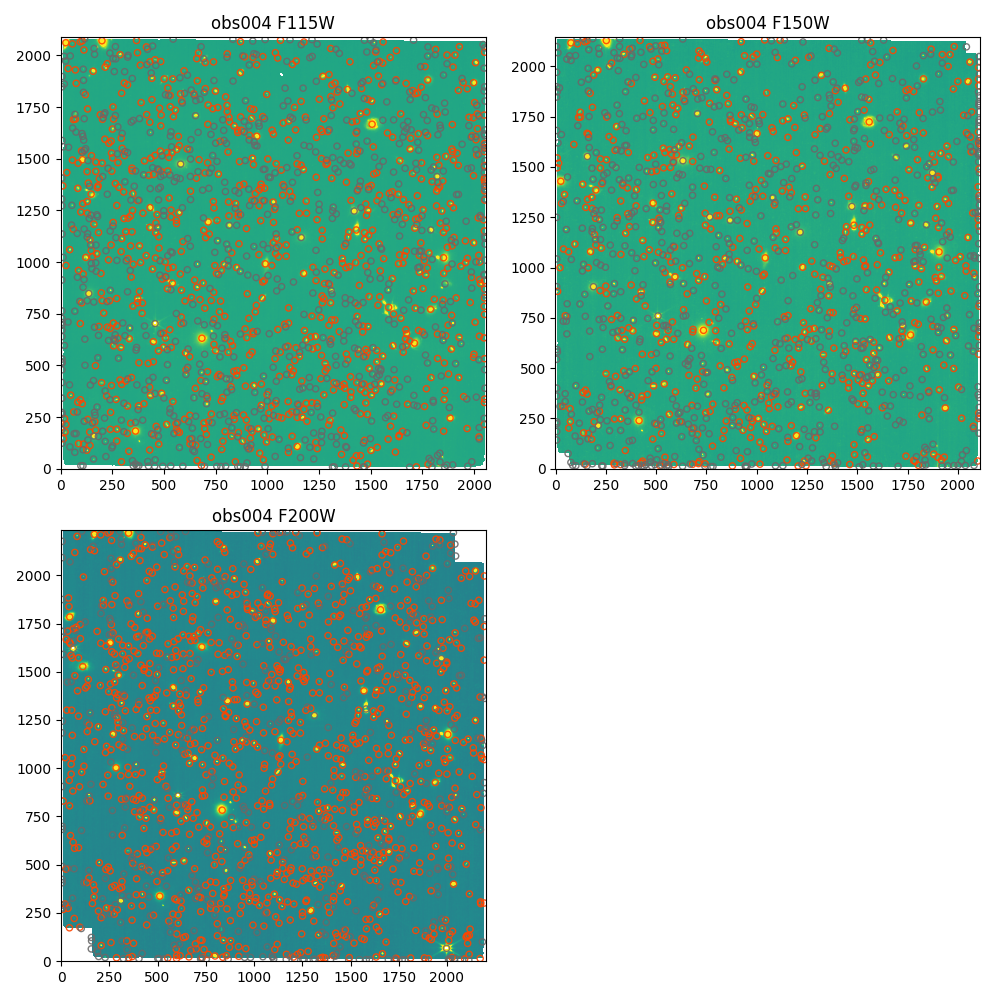

In [19]:
fig = plt.figure(figsize=(10, 10))

cols = 2
rows = int(np.ceil(len(image3_i2d) / cols))

for plt_num, img in enumerate(image3_i2d):

    # determine where the subplot should be
    xpos = (plt_num % 40) % cols
    ypos = ((plt_num % 40) // cols) # // to make it an int.

    # make the subplot
    ax = plt.subplot2grid((rows, cols), (ypos, xpos))

    # plot the image
    with fits.open(img) as hdu:
        ax.imshow(hdu[1].data, vmin=0, vmax=0.3, origin='lower')
        ax.set_title(f"obs{hdu[0].header['OBSERVTN']} {hdu[0].header['PUPIL']}")

    # also plot the associated catalog
    cat = Table.read(img.replace('i2d.fits', 'cat.ecsv'))
    extended_sources = cat[cat['is_extended'] == 1] # 1 is True; i.e. is extended
    point_sources = cat[cat['is_extended'] == 0] # 0 is False; i.e. is a point source
    ax.scatter(extended_sources['xcentroid'], extended_sources['ycentroid'], s=20, facecolors='None', edgecolors='orangered', alpha=0.9)
    ax.scatter(point_sources['xcentroid'], point_sources['ycentroid'], s=20, facecolors='None', edgecolors='dimgrey', alpha=0.9)

# Helps to make the axes not overlap ; you can also set this manually if this doesn't work
plt.tight_layout()

The segmentation maps are also a product of the Image3 pipeline, and they are used the help determine the source catalog. Let's take a look at those to ensure we are happy with what it is defining as a source.

In the segmentation map, each blue blob should correspond to a physical target. There are cases where sources can be blended, in which case the parameters for making the semgentation map and source catalog should be changed. An example of this can be seen below in the observation 004 F200W filter image where two galaxies at ~(1600, 1300) have been blended into one source. This is discussed in more detail below in [Custom Imaging Pipeline Run](#custom). 

*Note that because of the [filter offset difference](https://jwst-docs.stsci.edu/jwst-near-infrared-imager-and-slitless-spectrograph/niriss-instrumentation/niriss-gr150-grisms#NIRISSGR150Grisms-Blockingfilters) the field of views for the shown in the cutouts below differs for each filter.*

In [20]:
# we will look at this multiple times, so let's define this as a function
def plot_image_and_segmentation_map(i2d_images, segm_images, xmin=1250, xmax=1750, ymin=1250, ymax=1750, cat_suffix='cat.ecsv'):
        
    cols = 2
    rows = len(i2d_images)

    fig = plt.figure(figsize=(10, 10*(rows/2)))

    for plt_num, img in enumerate(np.sort(np.concatenate([segm_images, i2d_images]))):
    
        # determine where the subplot should be
        xpos = (plt_num % 40) % cols
        ypos = ((plt_num % 40) // cols) # // to make it an int.

        # make the subplot
        ax = plt.subplot2grid((rows, cols), (ypos, xpos))
    
        if 'i2d' in img:
            cat = Table.read(img.replace('i2d.fits', cat_suffix))
            cmap = 'gist_gray'
        else:
            cmap = 'tab20c_r'
            
        # plot the image
        with fits.open(img) as hdu:
            ax.imshow(hdu[1].data, vmin=0, vmax=0.3, origin='lower', cmap=cmap)
            title = f"obs{hdu[0].header['OBSERVTN']} {hdu[0].header['PUPIL']}"
    
        # also plot the associated catalog
        extended_sources = cat[cat['is_extended'] == 1] # 1 is True; i.e. is extended
        point_sources = cat[cat['is_extended'] == 0] # 0 is False; i.e. is a point source
        
        for color, sources in zip(['darkred', 'black'], [extended_sources, point_sources]):
            # plotting the sources
            ax.scatter(sources['xcentroid'], sources['ycentroid'], s=20, facecolors='None', edgecolors=color, alpha=0.9)
    
            # adding source labels 
            for i, source_num in enumerate(sources['label']):
                ax.annotate(source_num, 
                            (sources['xcentroid'][i]+0.5, sources['ycentroid'][i]+0.5), 
                            fontsize=8,
                            color=color)
        if 'i2d' in img:
            ax.set_title(f"{title} combined image")
        else:
            ax.set_title(f"{title} segmentation map")
        
        # zooming in on a smaller region
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
    
    # Helps to make the axes not overlap ; you can also set this manually if this doesn't work
    plt.tight_layout()

    return fig

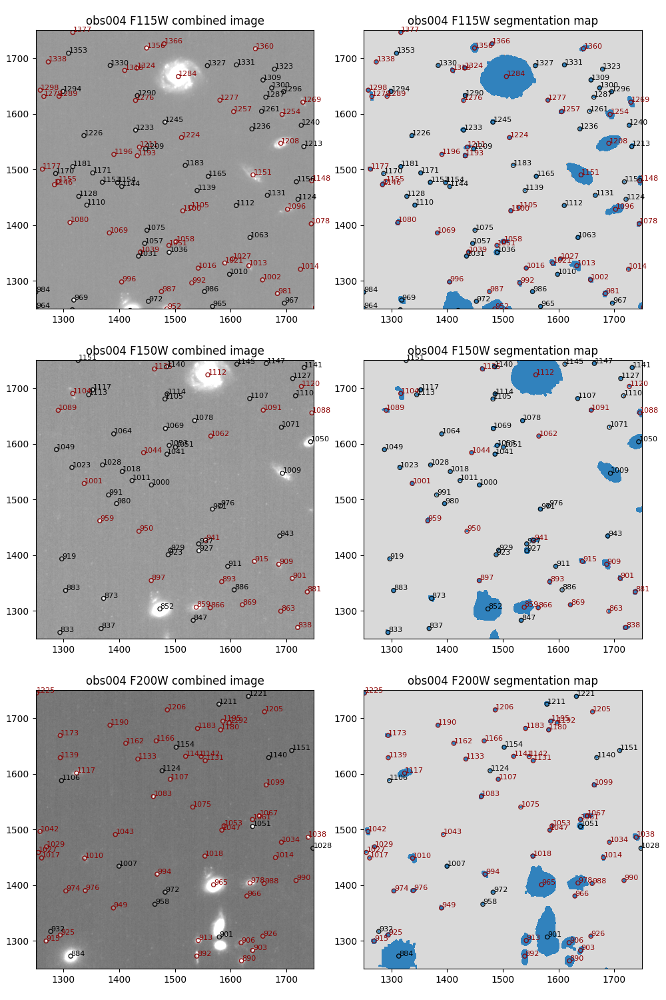

In [21]:
default_fig = plot_image_and_segmentation_map(image3_i2d, image3_segm)

#### ImViz

Similarly to DS9, ImViz allows you to interactively view these images and the corresponding source catalog as well.

In [22]:
imviz = Imviz()
viewer = imviz.default_viewer

# plot each i2d image
catalogs = [] # for plotting the catalogs
labels = [] # for plotting the catalogs
for img in image3_i2d:
    print(f'Plotting: {img}')
    label = f"obs{fits.getval(img, 'OBSERVTN')} {fits.getval(img, 'PUPIL')}"
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        imviz.load_data(img, data_label=label)

    # save info to plot the catalogs next
    catalogs.append(img.replace('i2d.fits', 'cat.ecsv'))
    labels.append(label)

# this aligns the image to use the WCS coordinates; 
#   the images need to be loaded first, but before adding markers
imviz.link_data(link_type='wcs')

# also plot the associated catalog
#   this needs to be a separate loop due to linking in imviz when using sky coordinates
for catname, label in zip(catalogs, labels):
    cat = Table.read(catname)
    
    # format the table into the format imviz expects
    sky_coords = Table({'coord': [SkyCoord(ra=cat['sky_centroid'].ra.degree,
                                           dec=cat['sky_centroid'].dec.degree,
                                           unit="deg")]})

    viewer.marker = {'color': 'orange', 'alpha': 1, 'markersize': 20, 'fill': False}
    viewer.add_markers(sky_coords, use_skycoord=True, marker_name=f"{label} catalog")

# This changes the stretch of all of the images
plotopt = imviz.plugins['Plot Options']
plotopt.select_all(viewers=True, layers=True)
plotopt.stretch_preset = '99.5%'
    
imviz.show()

Plotting: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_i2d.fits
Plotting: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_i2d.fits


Plotting: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_i2d.fits


Application(config='imviz', docs_link='https://jdaviz.readthedocs.io/en/v3.10.3/imviz/index.html', events=['ca…

<a id='custom'></a>
## Custom Imaging Pipeline Run

<a id='custom_image3'></a>
### Image3

Try editing a few parameters and compare the outcomes to the default run above, at first for a single file.

When we call the image3 pipeline, we can add modifications to a specific step of the pipeline. In this case we're going to edit the `source_catalog` and `tweakreg` steps of the pipeline. An explanation of the different parameters to tweak can be found in the further information below, while the default values are a combination of both the default pipeline values listed in there, and the parameter reference files that are supplied.
- [source_catalog Further Information](https://jwst-pipeline.readthedocs.io/en/latest/api/jwst.source_catalog.SourceCatalogStep.html)
- [tweakreg Futher Information](https://jwst-pipeline.readthedocs.io/en/latest/api/jwst.tweakreg.tweakreg_step.TweakRegStep.html)

In [23]:
image3_asns = np.sort(glob.glob('*image3*asn*.json'))
test_asn = image3_asns[1]

# check if the calibrated file already exists
asn_data = json.load(open(test_asn))
i2d_file = os.path.join(custom_run_image3, f"{asn_data['products'][0]['name']}_i2d.fits")

if os.path.exists(i2d_file):
    print(i2d_file, 'i2d file already exists.')
else:
    # call the image3 pipeline in the same way as before, but add a few new modifications
    cust_img3 = Image3Pipeline.call(test_asn,
                                    steps={
                                           'source_catalog': {'kernel_fwhm': 5.0,
                                                              'snr_threshold': 10.0,
                                                              'npixels': 50,
                                                              'deblend': True,
                                                              },
                                           'tweakreg': {'snr_threshold': 20,
                                                        'abs_refcat': 'GAIADR3',
                                                        'save_catalogs': True,
                                                        'searchrad': 3.0,
                                                        'kernel_fwhm': 2.302,
                                                        'fitgeometry': 'shift',
                                                        },
                                           },
                                    save_results=True,
                                    output_dir=custom_run_image3)

2024-10-09 15:15:06,669 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0079.asdf


2024-10-09 15:15:06,681 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0010.asdf


2024-10-09 15:15:06,695 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 15:15:06,704 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0011.asdf


2024-10-09 15:15:06,719 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-10-09 15:15:06,720 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-10-09 15:15:06,722 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-10-09 15:15:06,723 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-10-09 15:15:06,725 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-10-09 15:15:06,726 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 15:15:06,727 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-10-09 15:15:07,011 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw02079-o004_20231119t124442_image3_00005_asn.json',).


2024-10-09 15:15:07,025 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: custom_image3_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catal

2024-10-09 15:15:07,169 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004002_08101_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr']


2024-10-09 15:15:07,172 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-10-09 15:15:07,172 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-10-09 15:15:07,173 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-10-09 15:15:07,715 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9423956ed0>,).


2024-10-09 15:15:09,075 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_08101_00001_nis_cal.fits.


2024-10-09 15:15:09,079 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_08101_00001_nis_cal_cat.ecsv


2024-10-09 15:15:10,606 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_10101_00001_nis_cal.fits.


2024-10-09 15:15:10,610 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_10101_00001_nis_cal_cat.ecsv


2024-10-09 15:15:12,132 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_10101_00002_nis_cal.fits.


2024-10-09 15:15:12,136 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_10101_00002_nis_cal_cat.ecsv


2024-10-09 15:15:13,733 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_10101_00003_nis_cal.fits.


2024-10-09 15:15:13,737 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_10101_00003_nis_cal_cat.ecsv


2024-10-09 15:15:15,275 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_10101_00004_nis_cal.fits.


2024-10-09 15:15:15,279 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_10101_00004_nis_cal_cat.ecsv


2024-10-09 15:15:16,921 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_12101_00001_nis_cal.fits.


2024-10-09 15:15:16,925 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_12101_00001_nis_cal_cat.ecsv


2024-10-09 15:15:18,499 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_12101_00002_nis_cal.fits.


2024-10-09 15:15:18,503 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_12101_00002_nis_cal_cat.ecsv


2024-10-09 15:15:20,115 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_12101_00003_nis_cal.fits.


2024-10-09 15:15:20,119 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_12101_00003_nis_cal_cat.ecsv


2024-10-09 15:15:20,142 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:15:20,143 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 8.


2024-10-09 15:15:20,143 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:15:20,144 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-10-09 15:15:20.143636


2024-10-09 15:15:20,144 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.9


2024-10-09 15:15:20,144 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:15:25,856 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw02079004002_12101_3' as reference image


2024-10-09 15:15:25,861 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_12101_1' to the reference catalog.


2024-10-09 15:15:25,905 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_12101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_12101_00003_nis_cal' catalog.


2024-10-09 15:15:25,906 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:15:25,907 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01595, 0.01595 (arcsec) with significance of 35.21 and 44 matches.


2024-10-09 15:15:25,909 - stpipe.Image3Pipeline.tweakreg - INFO - Found 50 matches for 'GROUP ID: jw02079004002_12101_1'...


2024-10-09 15:15:25,909 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:15:25,911 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_12101_1:


2024-10-09 15:15:25,911 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0133161  YSH: -0.111306


2024-10-09 15:15:25,912 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:15:25,912 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.208723   FIT MAE: 0.174513


2024-10-09 15:15:25,913 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 49 objects.


2024-10-09 15:15:25,955 - stpipe.Image3Pipeline.tweakreg - INFO - Added 50 unmatched sources from 'GROUP ID: jw02079004002_12101_1' to the reference catalog.


2024-10-09 15:15:27,203 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_12101_2' to the reference catalog.


2024-10-09 15:15:27,253 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_12101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_12101_00001_nis_cal' catalog.


2024-10-09 15:15:27,254 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:15:27,256 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01724, 0.04552 (arcsec) with significance of 31.03 and 51 matches.


2024-10-09 15:15:27,257 - stpipe.Image3Pipeline.tweakreg - INFO - Found 66 matches for 'GROUP ID: jw02079004002_12101_2'...


2024-10-09 15:15:27,257 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:15:27,259 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_12101_2:


2024-10-09 15:15:27,259 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.1287  YSH: 0.03674


2024-10-09 15:15:27,261 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:15:27,261 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.286498   FIT MAE: 0.243796


2024-10-09 15:15:27,262 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 66 objects.


2024-10-09 15:15:27,304 - stpipe.Image3Pipeline.tweakreg - INFO - Added 34 unmatched sources from 'GROUP ID: jw02079004002_12101_2' to the reference catalog.


2024-10-09 15:15:28,296 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_1' to the reference catalog.


2024-10-09 15:15:28,343 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_12101_00002_nis_cal' catalog.


2024-10-09 15:15:28,343 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:15:28,345 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.0209, 0.03822 (arcsec) with significance of 31.18 and 53 matches.


2024-10-09 15:15:28,346 - stpipe.Image3Pipeline.tweakreg - INFO - Found 51 matches for 'GROUP ID: jw02079004002_10101_1'...


2024-10-09 15:15:28,347 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:15:28,350 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_10101_1:


2024-10-09 15:15:28,350 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0096556  YSH: -0.0234557


2024-10-09 15:15:28,350 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:15:28,351 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.065002   FIT MAE: 0.0500273


2024-10-09 15:15:28,351 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 50 objects.


2024-10-09 15:15:28,394 - stpipe.Image3Pipeline.tweakreg - INFO - Added 49 unmatched sources from 'GROUP ID: jw02079004002_10101_1' to the reference catalog.


2024-10-09 15:15:29,113 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_3' to the reference catalog.


2024-10-09 15:15:29,160 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00001_nis_cal' catalog.


2024-10-09 15:15:29,160 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:15:29,163 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.02521, 0.007453 (arcsec) with significance of 35.51 and 59 matches.


2024-10-09 15:15:29,164 - stpipe.Image3Pipeline.tweakreg - INFO - Found 60 matches for 'GROUP ID: jw02079004002_10101_3'...


2024-10-09 15:15:29,164 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:15:29,166 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_10101_3:


2024-10-09 15:15:29,167 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00734845  YSH: 0.0334065


2024-10-09 15:15:29,167 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:15:29,167 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.208559   FIT MAE: 0.134951


2024-10-09 15:15:29,168 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 59 objects.


2024-10-09 15:15:29,211 - stpipe.Image3Pipeline.tweakreg - INFO - Added 40 unmatched sources from 'GROUP ID: jw02079004002_10101_3' to the reference catalog.


2024-10-09 15:15:29,737 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_08101_1' to the reference catalog.


2024-10-09 15:15:29,783 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_08101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00003_nis_cal' catalog.


2024-10-09 15:15:29,783 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:15:29,785 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.02997, 0.04492 (arcsec) with significance of 39.26 and 72 matches.


2024-10-09 15:15:29,786 - stpipe.Image3Pipeline.tweakreg - INFO - Found 59 matches for 'GROUP ID: jw02079004002_08101_1'...


2024-10-09 15:15:29,787 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:15:29,789 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_08101_1:


2024-10-09 15:15:29,790 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.000817138  YSH: -0.018729


2024-10-09 15:15:29,790 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:15:29,790 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0975221   FIT MAE: 0.0531199


2024-10-09 15:15:29,791 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 56 objects.


2024-10-09 15:15:30,163 - stpipe.Image3Pipeline.tweakreg - INFO - Added 41 unmatched sources from 'GROUP ID: jw02079004002_08101_1' to the reference catalog.


2024-10-09 15:15:30,494 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_2' to the reference catalog.


2024-10-09 15:15:30,540 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_08101_00001_nis_cal' catalog.


2024-10-09 15:15:30,541 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:15:30,543 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.05316, 0.02137 (arcsec) with significance of 38.35 and 81 matches.


2024-10-09 15:15:30,544 - stpipe.Image3Pipeline.tweakreg - INFO - Found 65 matches for 'GROUP ID: jw02079004002_10101_2'...


2024-10-09 15:15:30,545 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:15:30,547 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_10101_2:


2024-10-09 15:15:30,547 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0528691  YSH: -0.0159834


2024-10-09 15:15:30,548 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:15:30,548 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.162939   FIT MAE: 0.106055


2024-10-09 15:15:30,549 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 62 objects.


2024-10-09 15:15:30,593 - stpipe.Image3Pipeline.tweakreg - INFO - Added 35 unmatched sources from 'GROUP ID: jw02079004002_10101_2' to the reference catalog.


2024-10-09 15:15:30,767 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_10101_4' to the reference catalog.


2024-10-09 15:15:30,815 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_10101_00004_nis_cal' catalog with sources from the reference 'jw02079004002_10101_00002_nis_cal' catalog.


2024-10-09 15:15:30,815 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:15:30,817 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.005294, 0.04837 (arcsec) with significance of 32.15 and 67 matches.


2024-10-09 15:15:30,818 - stpipe.Image3Pipeline.tweakreg - INFO - Found 64 matches for 'GROUP ID: jw02079004002_10101_4'...


2024-10-09 15:15:30,819 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:15:30,820 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_10101_4:


2024-10-09 15:15:30,821 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.182032  YSH: 0.0694145


2024-10-09 15:15:30,821 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:15:30,822 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.402083   FIT MAE: 0.336413


2024-10-09 15:15:30,823 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 64 objects.


2024-10-09 15:15:30,865 - stpipe.Image3Pipeline.tweakreg - INFO - Added 36 unmatched sources from 'GROUP ID: jw02079004002_10101_4' to the reference catalog.


2024-10-09 15:15:30,866 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:15:30,866 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-10-09 15:15:30.866344


2024-10-09 15:15:30,867 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:00:10.722708


2024-10-09 15:15:30,868 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:15:31,237 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough sources (7) in the reference catalog for the single-group alignment step to perform a fit. Skipping alignment to the input reference catalog!


2024-10-09 15:15:31,246 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-10-09 15:15:31,564 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9423956ed0>,).


2024-10-09 15:15:31,718 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:15:31,719 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-10-09 15:15:31.718615


2024-10-09 15:15:31,719 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:15:31,720 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-10-09 15:15:31,720 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-10-09 15:15:31,721 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-10-09 15:15:31,721 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:15:31,722 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-10-09 15:16:01,106 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_08101_00001_nis_cal.fits. Sky background: 0.00700732


2024-10-09 15:16:01,107 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00001_nis_cal.fits. Sky background: 0


2024-10-09 15:16:01,107 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00002_nis_cal.fits. Sky background: 0.00714935


2024-10-09 15:16:01,108 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00003_nis_cal.fits. Sky background: 0.00900399


2024-10-09 15:16:01,108 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_10101_00004_nis_cal.fits. Sky background: 0.0122178


2024-10-09 15:16:01,109 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_12101_00001_nis_cal.fits. Sky background: 0.0119847


2024-10-09 15:16:01,109 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_12101_00002_nis_cal.fits. Sky background: 0.00980498


2024-10-09 15:16:01,110 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_12101_00003_nis_cal.fits. Sky background: 0.0091688


2024-10-09 15:16:01,110 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:16:01,111 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-10-09 15:16:01.110656


2024-10-09 15:16:01,111 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:00:29.392041


2024-10-09 15:16:01,112 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:16:01,132 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-10-09 15:16:01,450 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9423956ed0>,).


2024-10-09 15:16:01,450 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection mode: imaging


2024-10-09 15:16:01,451 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection asn_id: o004


2024-10-09 15:16:01,452 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-10-09 15:16:01,452 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-10-09 15:16:01,453 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-10-09 15:16:01,453 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-10-09 15:16:01,454 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-10-09 15:16:01,531 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.0655645109798961 arcsec.


2024-10-09 15:16:01,579 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:16:03,725 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:16:04,699 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_08101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:16:04,707 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:16:06,807 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:16:07,772 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:16:07,779 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:16:09,869 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:16:10,839 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:16:10,847 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:16:12,921 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:16:13,882 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:16:13,889 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:16:15,951 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:16:16,917 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:16:16,924 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:16:19,020 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:16:20,024 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_12101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:16:20,031 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:16:22,126 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:16:23,088 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_12101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:16:23,096 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:16:25,199 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:16:26,161 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_12101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:16:26,167 - stpipe.Image3Pipeline.outlier_detection - WARNING - /opt/hostedtoolcache/Python/3.11.10/x64/lib/python3.11/site-packages/jwst/associations/association.py:215: UserWarning: Input association file contains path information; note that this can complicate usage and/or sharing of such files.
  warnings.warn(err_str, UserWarning)



2024-10-09 15:16:33,402 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_08101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:16:33,416 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_10101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:16:33,430 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_10101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:16:33,442 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_10101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:16:33,455 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_10101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:16:33,467 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_12101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:16:33,480 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_12101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:16:33,492 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_12101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:16:35,564 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 15:16:35,830 - stpipe.Image3Pipeline.outlier_detection - INFO - 6141 pixels marked as outliers


2024-10-09 15:16:37,970 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 15:16:38,237 - stpipe.Image3Pipeline.outlier_detection - INFO - 6339 pixels marked as outliers


2024-10-09 15:16:40,336 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 15:16:40,600 - stpipe.Image3Pipeline.outlier_detection - INFO - 6469 pixels marked as outliers


2024-10-09 15:16:42,708 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 15:16:42,983 - stpipe.Image3Pipeline.outlier_detection - INFO - 6143 pixels marked as outliers


2024-10-09 15:16:45,090 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 15:16:45,356 - stpipe.Image3Pipeline.outlier_detection - INFO - 6451 pixels marked as outliers


2024-10-09 15:16:47,448 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 15:16:47,709 - stpipe.Image3Pipeline.outlier_detection - INFO - 6392 pixels marked as outliers


2024-10-09 15:16:49,818 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 15:16:50,085 - stpipe.Image3Pipeline.outlier_detection - INFO - 6206 pixels marked as outliers


2024-10-09 15:16:52,200 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2145, 2112)


2024-10-09 15:16:52,464 - stpipe.Image3Pipeline.outlier_detection - INFO - 6278 pixels marked as outliers


2024-10-09 15:16:52,772 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_08101_00001_nis_o004_crf.fits


2024-10-09 15:16:53,036 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00001_nis_o004_crf.fits


2024-10-09 15:16:53,629 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00002_nis_o004_crf.fits


2024-10-09 15:16:53,892 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00003_nis_o004_crf.fits


2024-10-09 15:16:54,155 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_10101_00004_nis_o004_crf.fits


2024-10-09 15:16:54,418 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_12101_00001_nis_o004_crf.fits


2024-10-09 15:16:54,681 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_12101_00002_nis_o004_crf.fits


2024-10-09 15:16:54,942 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_12101_00003_nis_o004_crf.fits


2024-10-09 15:16:54,943 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-10-09 15:16:55,228 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9423956ed0>,).


2024-10-09 15:16:55,496 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-10-09 15:16:55,496 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-10-09 15:16:55,497 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2024-10-09 15:16:55,497 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-10-09 15:16:55,498 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-10-09 15:16:55,578 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.0655645109798961 arcsec.


2024-10-09 15:16:55,638 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-10-09 15:16:57,730 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:00,644 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:03,543 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:06,421 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:09,330 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:12,271 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:15,204 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:18,099 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:19,322 - stpipe.Image3Pipeline.resample - INFO - Resampling variance components


2024-10-09 15:17:21,389 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:24,353 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:27,293 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:30,210 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:33,147 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:36,056 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:38,958 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:41,884 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:44,821 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:47,722 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:50,645 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:53,546 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:56,468 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:17:59,410 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:18:02,353 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:18:05,244 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:18:08,206 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:18:11,165 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:18:14,073 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:18:17,019 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:18:19,992 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:18:22,895 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:18:25,834 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:18:28,764 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2145, 2112)


2024-10-09 15:18:29,690 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  53.147101661 -27.808518168 53.188747124 -27.795515512 53.174272521 -27.759245567 53.132639218 -27.772243886


2024-10-09 15:18:30,231 - stpipe.Image3Pipeline.resample - INFO - Saved model in custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_i2d.fits


2024-10-09 15:18:30,231 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-10-09 15:18:30,509 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2145, 2112) from jw02079-o004_t001_niriss_clear-f150w_i2d.fits>,).


2024-10-09 15:18:30,525 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-10-09 15:18:30,533 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-10-09 15:18:30,534 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-10-09 15:18:30,534 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-10-09 15:18:30,535 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-10-09 15:18:30,535 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F150W


2024-10-09 15:18:30,535 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-10-09 15:18:30,575 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 1.19753


2024-10-09 15:18:37,054 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 229 sources


2024-10-09 15:18:37,411 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_cat.ecsv


2024-10-09 15:18:37,547 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-10-09 15:18:37,548 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: jw02079-o004_t001_niriss_clear-f150w_segm.fits


2024-10-09 15:18:37,549 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-10-09 15:18:37,562 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-10-09 15:18:37,563 - stpipe - INFO - Results used jwst version: 1.16.0


In [24]:
# remove unnecessary files to save disk space
for crf in glob.glob(os.path.join(custom_run_image3, '*crf.fits')):
    os.remove(crf)

<a id='view_custom'></a>
### Inspecting Custom Results

In [25]:
default_i2d = os.path.join(default_run_image3, os.path.basename(i2d_file))
compare_i2ds = [i2d_file, default_i2d]
compare_segm = [i2d_file.replace('i2d.fits', 'segm.fits'), default_i2d.replace('i2d.fits', 'segm.fits')]

compare_fig = plot_image_and_segmentation_map(compare_i2ds, compare_segm)

The cell below shows similar information using Imviz instead to visualize this.

In [26]:
imviz = Imviz()
viewer = imviz.default_viewer

for img, label in zip([i2d_file, os.path.join(default_run_image3, os.path.basename(i2d_file))], ['custom', 'default']):
    print(f'Plotting: {img}')
    title = f"{label} obs{fits.getval(img, 'OBSERVTN')} {fits.getval(img, 'PUPIL')}"
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        imviz.load_data(img, data_label=title)

    # this aligns the image to use the WCS coordinates
    linking = imviz.plugins['Links Control']
    linking.link_type = 'WCS'

    # also plot the associated catalog
    cat = Table.read(img.replace('i2d.fits', 'cat.ecsv'))
    # format the table into the format imviz expects
    t_xy = Table({'x': cat['xcentroid'],
                  'y': cat['ycentroid']})
    viewer.marker = {'color': 'orange', 'alpha': 1, 'markersize': 20, 'fill': False}
    viewer.add_markers(t_xy, marker_name=f"{label} catalog")

# This changes the stretch of all of the images
plotopt = imviz.plugins['Plot Options']
plotopt.select_all(viewers=True, layers=True)
plotopt.stretch_preset = '99.5%'
    
imviz.show()

Plotting: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_i2d.fits


Plotting: default_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_i2d.fits


Application(config='imviz', docs_link='https://jdaviz.readthedocs.io/en/v3.10.3/imviz/index.html', events=['ca…

Calibrate the remaining images if you are happy with the above results

In [27]:
image3_asns = np.sort(glob.glob('*image3*asn*.json'))

for img3_asn in image3_asns:
    # check if the calibrated file already exists
    asn_data = json.load(open(img3_asn))
    i2d_file = os.path.join(custom_run_image3, f"{asn_data['products'][0]['name']}_i2d.fits")
    if os.path.exists(i2d_file):
        print(i2d_file, 'cal file already exists.')
        continue
    # call the image3 pipeline in the same way as before, but add a few new modifications
    cust_img3 = Image3Pipeline.call(img3_asn,
                                    steps={
                                           'source_catalog': {'kernel_fwhm': 5.0,
                                                              'snr_threshold': 10.0,
                                                              'npixels': 50,
                                                              'deblend': True,
                                                              },
                                           'tweakreg': {'snr_threshold': 20,
                                                        'abs_refcat': 'GAIADR3',
                                                        'save_catalogs': True,
                                                        'searchrad': 3.0,
                                                        'kernel_fwhm': 2.302,
                                                        'fitgeometry': 'shift',
                                                        },
                                           },
                                    save_results=True,
                                    output_dir=custom_run_image3)

2024-10-09 15:18:41,629 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0075.asdf


2024-10-09 15:18:41,642 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0002.asdf


2024-10-09 15:18:41,656 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 15:18:41,665 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0002.asdf


2024-10-09 15:18:41,680 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-10-09 15:18:41,681 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-10-09 15:18:41,683 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-10-09 15:18:41,684 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-10-09 15:18:41,686 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-10-09 15:18:41,687 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 15:18:41,689 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-10-09 15:18:41,992 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw02079-o004_20231119t124442_image3_00002_asn.json',).


2024-10-09 15:18:42,006 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: custom_image3_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catal

2024-10-09 15:18:42,157 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004003_02101_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr']


2024-10-09 15:18:42,160 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-10-09 15:18:42,161 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-10-09 15:18:42,162 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-10-09 15:18:42,720 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f942843f510>,).


2024-10-09 15:18:44,086 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_02101_00001_nis_cal.fits.


2024-10-09 15:18:44,090 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_02101_00001_nis_cal_cat.ecsv


2024-10-09 15:18:45,614 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_04101_00001_nis_cal.fits.


2024-10-09 15:18:45,618 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_04101_00001_nis_cal_cat.ecsv


2024-10-09 15:18:47,156 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_04101_00002_nis_cal.fits.


2024-10-09 15:18:47,160 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_04101_00002_nis_cal_cat.ecsv


2024-10-09 15:18:48,714 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_04101_00003_nis_cal.fits.


2024-10-09 15:18:48,718 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_04101_00003_nis_cal_cat.ecsv


2024-10-09 15:18:50,283 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_04101_00004_nis_cal.fits.


2024-10-09 15:18:50,287 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_04101_00004_nis_cal_cat.ecsv


2024-10-09 15:18:51,860 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_06101_00001_nis_cal.fits.


2024-10-09 15:18:51,864 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_06101_00001_nis_cal_cat.ecsv


2024-10-09 15:18:53,422 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_06101_00002_nis_cal.fits.


2024-10-09 15:18:53,426 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_06101_00002_nis_cal_cat.ecsv


2024-10-09 15:18:55,001 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004003_06101_00003_nis_cal.fits.


2024-10-09 15:18:55,005 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004003_06101_00003_nis_cal_cat.ecsv


2024-10-09 15:18:55,030 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:18:55,031 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 8.


2024-10-09 15:18:55,031 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:18:55,032 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-10-09 15:18:55.031797


2024-10-09 15:18:55,032 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.9


2024-10-09 15:18:55,033 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:19:00,486 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw02079004003_06101_3' as reference image


2024-10-09 15:19:00,493 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_06101_1' to the reference catalog.


2024-10-09 15:19:00,538 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_06101_00001_nis_cal' catalog with sources from the reference 'jw02079004003_06101_00003_nis_cal' catalog.


2024-10-09 15:19:00,538 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:19:00,540 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.013, 0.013 (arcsec) with significance of 41.45 and 46 matches.


2024-10-09 15:19:00,541 - stpipe.Image3Pipeline.tweakreg - INFO - Found 51 matches for 'GROUP ID: jw02079004003_06101_1'...


2024-10-09 15:19:00,542 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:19:00,544 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_06101_1:


2024-10-09 15:19:00,544 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0100532  YSH: -0.0557324


2024-10-09 15:19:00,544 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:19:00,545 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.189273   FIT MAE: 0.121599


2024-10-09 15:19:00,545 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 50 objects.


2024-10-09 15:19:00,589 - stpipe.Image3Pipeline.tweakreg - INFO - Added 49 unmatched sources from 'GROUP ID: jw02079004003_06101_1' to the reference catalog.


2024-10-09 15:19:01,475 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_4' to the reference catalog.


2024-10-09 15:19:01,523 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00004_nis_cal' catalog with sources from the reference 'jw02079004003_06101_00001_nis_cal' catalog.


2024-10-09 15:19:01,523 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:19:01,525 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01476, 0.03333 (arcsec) with significance of 32.11 and 60 matches.


2024-10-09 15:19:01,526 - stpipe.Image3Pipeline.tweakreg - INFO - Found 64 matches for 'GROUP ID: jw02079004003_04101_4'...


2024-10-09 15:19:01,527 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:19:01,529 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_04101_4:


2024-10-09 15:19:01,529 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.101712  YSH: 0.0532736


2024-10-09 15:19:01,530 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:19:01,530 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.354198   FIT MAE: 0.245439


2024-10-09 15:19:01,531 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 64 objects.


2024-10-09 15:19:01,574 - stpipe.Image3Pipeline.tweakreg - INFO - Added 36 unmatched sources from 'GROUP ID: jw02079004003_04101_4' to the reference catalog.


2024-10-09 15:19:02,357 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_06101_2' to the reference catalog.


2024-10-09 15:19:02,404 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_06101_00002_nis_cal' catalog with sources from the reference 'jw02079004003_04101_00004_nis_cal' catalog.


2024-10-09 15:19:02,404 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:19:02,406 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.01819, -0.07201 (arcsec) with significance of 37.1 and 71 matches.


2024-10-09 15:19:02,408 - stpipe.Image3Pipeline.tweakreg - INFO - Found 66 matches for 'GROUP ID: jw02079004003_06101_2'...


2024-10-09 15:19:02,409 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:19:02,411 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_06101_2:


2024-10-09 15:19:02,412 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0492076  YSH: 0.00242501


2024-10-09 15:19:02,412 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:19:02,412 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.170709   FIT MAE: 0.109286


2024-10-09 15:19:02,413 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 65 objects.


2024-10-09 15:19:02,456 - stpipe.Image3Pipeline.tweakreg - INFO - Added 34 unmatched sources from 'GROUP ID: jw02079004003_06101_2' to the reference catalog.


2024-10-09 15:19:03,138 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_3' to the reference catalog.


2024-10-09 15:19:03,185 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00003_nis_cal' catalog with sources from the reference 'jw02079004003_06101_00002_nis_cal' catalog.


2024-10-09 15:19:03,185 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:19:03,187 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.008427, 0.02822 (arcsec) with significance of 25.8 and 53 matches.


2024-10-09 15:19:03,189 - stpipe.Image3Pipeline.tweakreg - INFO - Found 49 matches for 'GROUP ID: jw02079004003_04101_3'...


2024-10-09 15:19:03,189 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:19:03,192 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_04101_3:


2024-10-09 15:19:03,192 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.000484031  YSH: -0.00713669


2024-10-09 15:19:03,193 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:19:03,193 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0513374   FIT MAE: 0.0353998


2024-10-09 15:19:03,194 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 48 objects.


2024-10-09 15:19:03,237 - stpipe.Image3Pipeline.tweakreg - INFO - Added 51 unmatched sources from 'GROUP ID: jw02079004003_04101_3' to the reference catalog.


2024-10-09 15:19:03,811 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_02101_1' to the reference catalog.


2024-10-09 15:19:03,864 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_02101_00001_nis_cal' catalog with sources from the reference 'jw02079004003_04101_00003_nis_cal' catalog.


2024-10-09 15:19:03,865 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:19:03,867 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.003483, 0.008098 (arcsec) with significance of 43.91 and 71 matches.


2024-10-09 15:19:03,868 - stpipe.Image3Pipeline.tweakreg - INFO - Found 61 matches for 'GROUP ID: jw02079004003_02101_1'...


2024-10-09 15:19:03,869 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:19:03,871 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_02101_1:


2024-10-09 15:19:03,871 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0677414  YSH: 0.0363887


2024-10-09 15:19:03,872 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:19:03,872 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.299436   FIT MAE: 0.182924


2024-10-09 15:19:03,873 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 61 objects.


2024-10-09 15:19:03,918 - stpipe.Image3Pipeline.tweakreg - INFO - Added 39 unmatched sources from 'GROUP ID: jw02079004003_02101_1' to the reference catalog.


2024-10-09 15:19:04,371 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_2' to the reference catalog.


2024-10-09 15:19:04,424 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00002_nis_cal' catalog with sources from the reference 'jw02079004003_02101_00001_nis_cal' catalog.


2024-10-09 15:19:04,424 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:19:04,426 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.0195, 0.03488 (arcsec) with significance of 43.24 and 89 matches.


2024-10-09 15:19:04,427 - stpipe.Image3Pipeline.tweakreg - INFO - Found 67 matches for 'GROUP ID: jw02079004003_04101_2'...


2024-10-09 15:19:04,428 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:19:04,430 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_04101_2:


2024-10-09 15:19:04,430 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0556434  YSH: 0.00457363


2024-10-09 15:19:04,431 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:19:04,431 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.172654   FIT MAE: 0.112863


2024-10-09 15:19:04,432 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 67 objects.


2024-10-09 15:19:04,478 - stpipe.Image3Pipeline.tweakreg - INFO - Added 33 unmatched sources from 'GROUP ID: jw02079004003_04101_2' to the reference catalog.


2024-10-09 15:19:04,617 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004003_04101_1' to the reference catalog.


2024-10-09 15:19:05,079 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004003_04101_00001_nis_cal' catalog with sources from the reference 'jw02079004003_04101_00002_nis_cal' catalog.


2024-10-09 15:19:05,079 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:19:05,081 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.03723, 0.006278 (arcsec) with significance of 40.7 and 96 matches.


2024-10-09 15:19:05,082 - stpipe.Image3Pipeline.tweakreg - INFO - Found 59 matches for 'GROUP ID: jw02079004003_04101_1'...


2024-10-09 15:19:05,083 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:19:05,085 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004003_04101_1:


2024-10-09 15:19:05,086 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00298966  YSH: -0.0498054


2024-10-09 15:19:05,086 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:19:05,086 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.174233   FIT MAE: 0.104748


2024-10-09 15:19:05,087 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 58 objects.


2024-10-09 15:19:05,133 - stpipe.Image3Pipeline.tweakreg - INFO - Added 41 unmatched sources from 'GROUP ID: jw02079004003_04101_1' to the reference catalog.


2024-10-09 15:19:05,133 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:19:05,134 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-10-09 15:19:05.133754


2024-10-09 15:19:05,134 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:00:10.101957


2024-10-09 15:19:05,135 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:19:05,462 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough sources (7) in the reference catalog for the single-group alignment step to perform a fit. Skipping alignment to the input reference catalog!


2024-10-09 15:19:05,469 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-10-09 15:19:05,852 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f942843f510>,).


2024-10-09 15:19:06,015 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:19:06,015 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-10-09 15:19:06.015366


2024-10-09 15:19:06,016 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:19:06,016 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-10-09 15:19:06,017 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-10-09 15:19:06,017 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-10-09 15:19:06,018 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:19:06,019 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-10-09 15:19:34,797 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_02101_00001_nis_cal.fits. Sky background: 0.00406967


2024-10-09 15:19:34,798 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00001_nis_cal.fits. Sky background: 0.00697517


2024-10-09 15:19:34,798 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00002_nis_cal.fits. Sky background: 0.00251737


2024-10-09 15:19:34,799 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00003_nis_cal.fits. Sky background: 0.0108182


2024-10-09 15:19:34,799 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_04101_00004_nis_cal.fits. Sky background: 0.0090661


2024-10-09 15:19:34,800 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_06101_00001_nis_cal.fits. Sky background: 0.00897341


2024-10-09 15:19:34,800 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_06101_00002_nis_cal.fits. Sky background: 0


2024-10-09 15:19:34,800 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004003_06101_00003_nis_cal.fits. Sky background: 0.00684062


2024-10-09 15:19:34,801 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:19:34,801 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-10-09 15:19:34.801270


2024-10-09 15:19:34,802 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:00:28.785904


2024-10-09 15:19:34,802 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:19:34,821 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-10-09 15:19:35,164 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f942843f510>,).


2024-10-09 15:19:35,164 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection mode: imaging


2024-10-09 15:19:35,165 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection asn_id: o004


2024-10-09 15:19:35,166 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-10-09 15:19:35,166 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-10-09 15:19:35,167 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-10-09 15:19:35,167 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-10-09 15:19:35,168 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-10-09 15:19:35,242 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.06556229340666292 arcsec.


2024-10-09 15:19:35,290 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:19:37,408 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:19:38,379 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_02101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:19:38,386 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:19:40,464 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:19:41,435 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:19:41,443 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:19:43,524 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:19:44,497 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:19:44,505 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:19:46,588 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:19:47,566 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:19:47,574 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:19:49,646 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:19:50,627 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:19:50,635 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:19:52,695 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:19:53,667 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_06101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:19:53,675 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:19:55,770 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:19:56,739 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_06101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:19:56,747 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:19:58,825 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:19:59,797 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_06101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:19:59,802 - stpipe.Image3Pipeline.outlier_detection - WARNING - /opt/hostedtoolcache/Python/3.11.10/x64/lib/python3.11/site-packages/jwst/associations/association.py:215: UserWarning: Input association file contains path information; note that this can complicate usage and/or sharing of such files.
  warnings.warn(err_str, UserWarning)



2024-10-09 15:20:07,236 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004003_02101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:20:07,249 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004003_04101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:20:07,260 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004003_04101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:20:07,272 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004003_04101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:20:07,286 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004003_04101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:20:07,302 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004003_06101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:20:07,317 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004003_06101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:20:07,332 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004003_06101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:20:09,400 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:20:09,672 - stpipe.Image3Pipeline.outlier_detection - INFO - 3766 pixels marked as outliers


2024-10-09 15:20:11,762 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:20:12,036 - stpipe.Image3Pipeline.outlier_detection - INFO - 4524 pixels marked as outliers


2024-10-09 15:20:14,134 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:20:14,408 - stpipe.Image3Pipeline.outlier_detection - INFO - 4133 pixels marked as outliers


2024-10-09 15:20:16,515 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:20:16,782 - stpipe.Image3Pipeline.outlier_detection - INFO - 3554 pixels marked as outliers


2024-10-09 15:20:18,897 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:20:19,178 - stpipe.Image3Pipeline.outlier_detection - INFO - 3756 pixels marked as outliers


2024-10-09 15:20:21,289 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:20:21,560 - stpipe.Image3Pipeline.outlier_detection - INFO - 4099 pixels marked as outliers


2024-10-09 15:20:23,655 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:20:23,938 - stpipe.Image3Pipeline.outlier_detection - INFO - 4428 pixels marked as outliers


2024-10-09 15:20:26,048 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2236, 2202)


2024-10-09 15:20:26,315 - stpipe.Image3Pipeline.outlier_detection - INFO - 3905 pixels marked as outliers


2024-10-09 15:20:26,621 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_02101_00001_nis_o004_crf.fits


2024-10-09 15:20:26,884 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00001_nis_o004_crf.fits


2024-10-09 15:20:27,146 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00002_nis_o004_crf.fits


2024-10-09 15:20:27,405 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00003_nis_o004_crf.fits


2024-10-09 15:20:27,670 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_04101_00004_nis_o004_crf.fits


2024-10-09 15:20:27,939 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_06101_00001_nis_o004_crf.fits


2024-10-09 15:20:28,205 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_06101_00002_nis_o004_crf.fits


2024-10-09 15:20:28,465 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004003_06101_00003_nis_o004_crf.fits


2024-10-09 15:20:28,466 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-10-09 15:20:28,826 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f942843f510>,).


2024-10-09 15:20:29,092 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-10-09 15:20:29,092 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-10-09 15:20:29,093 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2024-10-09 15:20:29,093 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-10-09 15:20:29,094 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-10-09 15:20:29,171 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.06556229340666292 arcsec.


2024-10-09 15:20:29,234 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-10-09 15:20:31,317 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:20:34,239 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:20:37,142 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:20:40,065 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:20:42,969 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:20:45,888 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:20:48,810 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:20:51,714 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:20:52,931 - stpipe.Image3Pipeline.resample - INFO - Resampling variance components


2024-10-09 15:20:54,984 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:20:57,914 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:00,843 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:03,818 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:06,741 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:09,674 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:12,600 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:15,526 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:18,472 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:21,389 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:24,322 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:27,240 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:30,164 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:33,118 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:36,042 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:38,983 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:41,940 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:44,861 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:47,769 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:50,712 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:53,645 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:56,556 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:21:59,490 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:22:02,423 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2236, 2202)


2024-10-09 15:22:03,355 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  53.145923829 -27.810578145 53.189335285 -27.797024250 53.174243996 -27.759210077 53.130845755 -27.772759259


2024-10-09 15:22:03,902 - stpipe.Image3Pipeline.resample - INFO - Saved model in custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_i2d.fits


2024-10-09 15:22:03,903 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-10-09 15:22:04,247 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2236, 2202) from jw02079-o004_t001_niriss_clear-f200w_i2d.fits>,).


2024-10-09 15:22:04,263 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-10-09 15:22:04,271 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-10-09 15:22:04,271 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-10-09 15:22:04,272 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-10-09 15:22:04,272 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-10-09 15:22:04,273 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F200W


2024-10-09 15:22:04,273 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-10-09 15:22:04,313 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 1.68884


2024-10-09 15:22:11,326 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 270 sources


2024-10-09 15:22:11,715 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_cat.ecsv


2024-10-09 15:22:11,851 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-10-09 15:22:11,851 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: jw02079-o004_t001_niriss_clear-f200w_segm.fits


2024-10-09 15:22:11,853 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-10-09 15:22:11,867 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-10-09 15:22:11,867 - stpipe - INFO - Results used jwst version: 1.16.0


2024-10-09 15:22:12,006 - stpipe - INFO - PARS-TWEAKREGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-tweakregstep_0078.asdf


2024-10-09 15:22:12,017 - stpipe - INFO - PARS-OUTLIERDETECTIONSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-outlierdetectionstep_0006.asdf


2024-10-09 15:22:12,031 - stpipe - INFO - PARS-RESAMPLESTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-resamplestep_0001.asdf


2024-10-09 15:22:12,040 - stpipe - INFO - PARS-SOURCECATALOGSTEP parameters found: crds_cache/references/jwst/niriss/jwst_niriss_pars-sourcecatalogstep_0010.asdf


2024-10-09 15:22:12,055 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-10-09 15:22:12,056 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-10-09 15:22:12,058 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-10-09 15:22:12,059 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-10-09 15:22:12,061 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-10-09 15:22:12,063 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-10-09 15:22:12,064 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-10-09 15:22:12,377 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('jw02079-o004_20231119t124442_image3_00009_asn.json',).


custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_i2d.fits cal file already exists.


2024-10-09 15:22:12,392 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: custom_image3_calibrated
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catal

2024-10-09 15:22:12,540 - stpipe.Image3Pipeline - INFO - Prefetching reference files for dataset: 'jw02079004001_02101_00001_nis_cal.fits' reftypes = ['abvegaoffset', 'apcorr']


2024-10-09 15:22:12,544 - stpipe.Image3Pipeline - INFO - Prefetch for ABVEGAOFFSET reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf'.


2024-10-09 15:22:12,545 - stpipe.Image3Pipeline - INFO - Prefetch for APCORR reference file is 'crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits'.


2024-10-09 15:22:12,546 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-10-09 15:22:13,318 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9421c07910>,).


2024-10-09 15:22:14,680 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_02101_00001_nis_cal.fits.


2024-10-09 15:22:14,684 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_02101_00001_nis_cal_cat.ecsv


2024-10-09 15:22:16,275 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_04101_00001_nis_cal.fits.


2024-10-09 15:22:16,279 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_04101_00001_nis_cal_cat.ecsv


2024-10-09 15:22:17,872 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_04101_00002_nis_cal.fits.


2024-10-09 15:22:17,876 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_04101_00002_nis_cal_cat.ecsv


2024-10-09 15:22:19,495 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_04101_00003_nis_cal.fits.


2024-10-09 15:22:19,498 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_04101_00003_nis_cal_cat.ecsv


2024-10-09 15:22:21,131 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_04101_00004_nis_cal.fits.


2024-10-09 15:22:21,135 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_04101_00004_nis_cal_cat.ecsv


2024-10-09 15:22:22,781 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_06101_00001_nis_cal.fits.


2024-10-09 15:22:22,785 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_06101_00001_nis_cal_cat.ecsv


2024-10-09 15:22:24,423 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_06101_00002_nis_cal.fits.


2024-10-09 15:22:24,427 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_06101_00002_nis_cal_cat.ecsv


2024-10-09 15:22:25,990 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_06101_00003_nis_cal.fits.


2024-10-09 15:22:25,994 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_06101_00003_nis_cal_cat.ecsv


2024-10-09 15:22:27,612 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_08101_00001_nis_cal.fits.


2024-10-09 15:22:27,616 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_08101_00001_nis_cal_cat.ecsv


2024-10-09 15:22:29,242 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_10101_00001_nis_cal.fits.


2024-10-09 15:22:29,247 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_10101_00001_nis_cal_cat.ecsv


2024-10-09 15:22:30,811 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_10101_00002_nis_cal.fits.


2024-10-09 15:22:30,815 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_10101_00002_nis_cal_cat.ecsv


2024-10-09 15:22:32,451 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_10101_00003_nis_cal.fits.


2024-10-09 15:22:32,455 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_10101_00003_nis_cal_cat.ecsv


2024-10-09 15:22:34,018 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_10101_00004_nis_cal.fits.


2024-10-09 15:22:34,022 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_10101_00004_nis_cal_cat.ecsv


2024-10-09 15:22:36,032 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_12101_00001_nis_cal.fits.


2024-10-09 15:22:36,036 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_12101_00001_nis_cal_cat.ecsv


2024-10-09 15:22:37,596 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_12101_00002_nis_cal.fits.


2024-10-09 15:22:37,600 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_12101_00002_nis_cal_cat.ecsv


2024-10-09 15:22:39,229 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004001_12101_00003_nis_cal.fits.


2024-10-09 15:22:39,232 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004001_12101_00003_nis_cal_cat.ecsv


2024-10-09 15:22:40,873 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_02101_00001_nis_cal.fits.


2024-10-09 15:22:40,877 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_02101_00001_nis_cal_cat.ecsv


2024-10-09 15:22:42,447 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_04101_00001_nis_cal.fits.


2024-10-09 15:22:42,450 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_04101_00001_nis_cal_cat.ecsv


2024-10-09 15:22:44,077 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_04101_00002_nis_cal.fits.


2024-10-09 15:22:44,081 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_04101_00002_nis_cal_cat.ecsv


2024-10-09 15:22:45,718 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_04101_00003_nis_cal.fits.


2024-10-09 15:22:45,722 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_04101_00003_nis_cal_cat.ecsv


2024-10-09 15:22:47,295 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_04101_00004_nis_cal.fits.


2024-10-09 15:22:47,299 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_04101_00004_nis_cal_cat.ecsv


2024-10-09 15:22:48,932 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_06101_00001_nis_cal.fits.


2024-10-09 15:22:48,936 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_06101_00001_nis_cal_cat.ecsv


2024-10-09 15:22:50,573 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_06101_00002_nis_cal.fits.


2024-10-09 15:22:50,577 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_06101_00002_nis_cal_cat.ecsv


2024-10-09 15:22:52,146 - stpipe.Image3Pipeline.tweakreg - INFO - Detected 100 sources in jw02079004002_06101_00003_nis_cal.fits.


2024-10-09 15:22:52,150 - stpipe.Image3Pipeline.tweakreg - INFO - Wrote source catalog: jw02079004002_06101_00003_nis_cal_cat.ecsv


2024-10-09 15:22:52,174 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:22:52,174 - stpipe.Image3Pipeline.tweakreg - INFO - Number of image groups to be aligned: 24.


2024-10-09 15:22:52,175 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:22:52,175 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() started on 2024-10-09 15:22:52.175138


2024-10-09 15:22:52,175 - stpipe.Image3Pipeline.tweakreg - INFO -       Version 0.8.9


2024-10-09 15:22:52,176 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:23:43,666 - stpipe.Image3Pipeline.tweakreg - INFO - Selected image 'GROUP ID: jw02079004001_06101_2' as reference image


2024-10-09 15:23:43,671 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_12101_3' to the reference catalog.


2024-10-09 15:23:43,718 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_12101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_06101_00002_nis_cal' catalog.


2024-10-09 15:23:43,719 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:23:43,720 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01396, 0.01974 (arcsec) with significance of 27.27 and 34 matches.


2024-10-09 15:23:43,721 - stpipe.Image3Pipeline.tweakreg - INFO - Found 50 matches for 'GROUP ID: jw02079004001_12101_3'...


2024-10-09 15:23:43,722 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:23:43,724 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_12101_3:


2024-10-09 15:23:43,724 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.132631  YSH: -0.0455503


2024-10-09 15:23:43,724 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:23:43,725 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.288601   FIT MAE: 0.241548


2024-10-09 15:23:43,725 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 50 objects.


2024-10-09 15:23:43,769 - stpipe.Image3Pipeline.tweakreg - INFO - Added 50 unmatched sources from 'GROUP ID: jw02079004001_12101_3' to the reference catalog.


2024-10-09 15:23:47,771 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_12101_2' to the reference catalog.


2024-10-09 15:23:47,819 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_12101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_12101_00003_nis_cal' catalog.


2024-10-09 15:23:47,819 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:23:47,821 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01092, 0.01489 (arcsec) with significance of 55.03 and 66 matches.


2024-10-09 15:23:47,822 - stpipe.Image3Pipeline.tweakreg - INFO - Found 72 matches for 'GROUP ID: jw02079004001_12101_2'...


2024-10-09 15:23:47,823 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:23:47,825 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_12101_2:


2024-10-09 15:23:47,825 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.0427421  YSH: 0.0153513


2024-10-09 15:23:47,825 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:23:47,826 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.132731   FIT MAE: 0.0886104


2024-10-09 15:23:47,826 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 72 objects.


2024-10-09 15:23:47,869 - stpipe.Image3Pipeline.tweakreg - INFO - Added 28 unmatched sources from 'GROUP ID: jw02079004001_12101_2' to the reference catalog.


2024-10-09 15:23:51,467 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_4' to the reference catalog.


2024-10-09 15:23:51,515 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00004_nis_cal' catalog with sources from the reference 'jw02079004001_12101_00002_nis_cal' catalog.


2024-10-09 15:23:51,515 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:23:51,517 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.004413, 0.02408 (arcsec) with significance of 27.46 and 40 matches.


2024-10-09 15:23:51,518 - stpipe.Image3Pipeline.tweakreg - INFO - Found 40 matches for 'GROUP ID: jw02079004001_04101_4'...


2024-10-09 15:23:51,519 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:23:51,521 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_04101_4:


2024-10-09 15:23:51,522 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0145802  YSH: -0.00324412


2024-10-09 15:23:51,522 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:23:51,523 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0450938   FIT MAE: 0.0297363


2024-10-09 15:23:51,523 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 38 objects.


2024-10-09 15:23:51,566 - stpipe.Image3Pipeline.tweakreg - INFO - Added 60 unmatched sources from 'GROUP ID: jw02079004001_04101_4' to the reference catalog.


2024-10-09 15:23:55,017 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_06101_2' to the reference catalog.


2024-10-09 15:23:55,064 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_06101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_04101_00004_nis_cal' catalog.


2024-10-09 15:23:55,065 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:23:55,067 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.1095, -0.02681 (arcsec) with significance of 49.64 and 67 matches.


2024-10-09 15:23:55,068 - stpipe.Image3Pipeline.tweakreg - INFO - Found 51 matches for 'GROUP ID: jw02079004002_06101_2'...


2024-10-09 15:23:55,069 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:23:55,071 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_06101_2:


2024-10-09 15:23:55,071 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.00214716  YSH: -0.00192854


2024-10-09 15:23:55,072 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:23:55,073 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.0263873   FIT MAE: 0.0108062


2024-10-09 15:23:55,073 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 48 objects.


2024-10-09 15:23:55,117 - stpipe.Image3Pipeline.tweakreg - INFO - Added 49 unmatched sources from 'GROUP ID: jw02079004002_06101_2' to the reference catalog.


2024-10-09 15:23:58,732 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_06101_3' to the reference catalog.


2024-10-09 15:23:58,780 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_06101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_06101_00002_nis_cal' catalog.


2024-10-09 15:23:58,780 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:23:58,782 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.04552, 0.02362 (arcsec) with significance of 27.55 and 58 matches.


2024-10-09 15:23:58,784 - stpipe.Image3Pipeline.tweakreg - INFO - Found 79 matches for 'GROUP ID: jw02079004001_06101_3'...


2024-10-09 15:23:58,784 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:23:58,786 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_06101_3:


2024-10-09 15:23:58,786 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.113881  YSH: -0.131962


2024-10-09 15:23:58,787 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:23:58,788 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.473198   FIT MAE: 0.39873


2024-10-09 15:23:58,788 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 79 objects.


2024-10-09 15:23:59,264 - stpipe.Image3Pipeline.tweakreg - INFO - Added 21 unmatched sources from 'GROUP ID: jw02079004001_06101_3' to the reference catalog.


2024-10-09 15:24:02,613 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_08101_1' to the reference catalog.


2024-10-09 15:24:02,661 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_08101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_06101_00003_nis_cal' catalog.


2024-10-09 15:24:02,661 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:02,663 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.0008252, 0.01974 (arcsec) with significance of 31.45 and 51 matches.


2024-10-09 15:24:02,665 - stpipe.Image3Pipeline.tweakreg - INFO - Found 68 matches for 'GROUP ID: jw02079004001_08101_1'...


2024-10-09 15:24:02,665 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:02,667 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_08101_1:


2024-10-09 15:24:02,667 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0214849  YSH: -0.155049


2024-10-09 15:24:02,668 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:02,669 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.370184   FIT MAE: 0.296236


2024-10-09 15:24:02,669 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 68 objects.


2024-10-09 15:24:02,713 - stpipe.Image3Pipeline.tweakreg - INFO - Added 33 unmatched sources from 'GROUP ID: jw02079004001_08101_1' to the reference catalog.


2024-10-09 15:24:05,755 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_1' to the reference catalog.


2024-10-09 15:24:05,804 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_08101_00001_nis_cal' catalog.


2024-10-09 15:24:05,804 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:05,806 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.01774, 0.05032 (arcsec) with significance of 29.64 and 56 matches.


2024-10-09 15:24:05,808 - stpipe.Image3Pipeline.tweakreg - INFO - Found 53 matches for 'GROUP ID: jw02079004001_10101_1'...


2024-10-09 15:24:05,808 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:05,811 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_10101_1:


2024-10-09 15:24:05,811 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00535847  YSH: -0.00442158


2024-10-09 15:24:05,812 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:05,812 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.160832   FIT MAE: 0.0791594


2024-10-09 15:24:05,812 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 51 objects.


2024-10-09 15:24:05,856 - stpipe.Image3Pipeline.tweakreg - INFO - Added 47 unmatched sources from 'GROUP ID: jw02079004001_10101_1' to the reference catalog.


2024-10-09 15:24:09,045 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_3' to the reference catalog.


2024-10-09 15:24:09,092 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00001_nis_cal' catalog.


2024-10-09 15:24:09,092 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:09,094 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.003026, 0.01693 (arcsec) with significance of 31.67 and 60 matches.


2024-10-09 15:24:09,095 - stpipe.Image3Pipeline.tweakreg - INFO - Found 70 matches for 'GROUP ID: jw02079004001_04101_3'...


2024-10-09 15:24:09,096 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:09,098 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_04101_3:


2024-10-09 15:24:09,098 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0457263  YSH: -0.0409532


2024-10-09 15:24:09,099 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:09,099 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.390522   FIT MAE: 0.26939


2024-10-09 15:24:09,100 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 70 objects.


2024-10-09 15:24:09,145 - stpipe.Image3Pipeline.tweakreg - INFO - Added 30 unmatched sources from 'GROUP ID: jw02079004001_04101_3' to the reference catalog.


2024-10-09 15:24:12,044 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_2' to the reference catalog.


2024-10-09 15:24:12,094 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_04101_00003_nis_cal' catalog.


2024-10-09 15:24:12,095 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:12,097 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01654, -0.01018 (arcsec) with significance of 28.43 and 51 matches.


2024-10-09 15:24:12,098 - stpipe.Image3Pipeline.tweakreg - INFO - Found 71 matches for 'GROUP ID: jw02079004001_04101_2'...


2024-10-09 15:24:12,099 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:12,100 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_04101_2:


2024-10-09 15:24:12,101 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.131993  YSH: -0.00665781


2024-10-09 15:24:12,101 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:12,102 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.434672   FIT MAE: 0.355009


2024-10-09 15:24:12,102 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 71 objects.


2024-10-09 15:24:12,148 - stpipe.Image3Pipeline.tweakreg - INFO - Added 29 unmatched sources from 'GROUP ID: jw02079004001_04101_2' to the reference catalog.


2024-10-09 15:24:14,790 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_02101_1' to the reference catalog.


2024-10-09 15:24:14,840 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_02101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_04101_00002_nis_cal' catalog.


2024-10-09 15:24:14,841 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:14,842 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.005643, 0.0374 (arcsec) with significance of 32.22 and 64 matches.


2024-10-09 15:24:14,844 - stpipe.Image3Pipeline.tweakreg - INFO - Found 64 matches for 'GROUP ID: jw02079004002_02101_1'...


2024-10-09 15:24:14,845 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:14,846 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_02101_1:


2024-10-09 15:24:14,847 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.037459  YSH: -0.123381


2024-10-09 15:24:14,847 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:14,848 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.36379   FIT MAE: 0.281086


2024-10-09 15:24:14,848 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 64 objects.


2024-10-09 15:24:14,894 - stpipe.Image3Pipeline.tweakreg - INFO - Added 36 unmatched sources from 'GROUP ID: jw02079004002_02101_1' to the reference catalog.


2024-10-09 15:24:17,517 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_3' to the reference catalog.


2024-10-09 15:24:17,565 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_02101_00001_nis_cal' catalog.


2024-10-09 15:24:17,566 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:17,568 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01048, 0.02166 (arcsec) with significance of 31.73 and 72 matches.


2024-10-09 15:24:17,569 - stpipe.Image3Pipeline.tweakreg - INFO - Found 72 matches for 'GROUP ID: jw02079004001_10101_3'...


2024-10-09 15:24:17,570 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:17,572 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_10101_3:


2024-10-09 15:24:17,572 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0388581  YSH: -0.0692029


2024-10-09 15:24:17,572 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:17,573 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.415814   FIT MAE: 0.297111


2024-10-09 15:24:17,573 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 72 objects.


2024-10-09 15:24:17,624 - stpipe.Image3Pipeline.tweakreg - INFO - Added 29 unmatched sources from 'GROUP ID: jw02079004001_10101_3' to the reference catalog.


2024-10-09 15:24:20,079 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_06101_1' to the reference catalog.


2024-10-09 15:24:20,127 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_06101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00003_nis_cal' catalog.


2024-10-09 15:24:20,128 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:20,129 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.01764, 0.004258 (arcsec) with significance of 29.43 and 66 matches.


2024-10-09 15:24:20,131 - stpipe.Image3Pipeline.tweakreg - INFO - Found 68 matches for 'GROUP ID: jw02079004002_06101_1'...


2024-10-09 15:24:20,132 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:20,133 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_06101_1:


2024-10-09 15:24:20,134 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0947075  YSH: 0.000843653


2024-10-09 15:24:20,134 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:20,135 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.422856   FIT MAE: 0.315659


2024-10-09 15:24:20,135 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 68 objects.


2024-10-09 15:24:20,180 - stpipe.Image3Pipeline.tweakreg - INFO - Added 32 unmatched sources from 'GROUP ID: jw02079004002_06101_1' to the reference catalog.


2024-10-09 15:24:22,448 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_2' to the reference catalog.


2024-10-09 15:24:22,496 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00002_nis_cal' catalog with sources from the reference 'jw02079004002_06101_00001_nis_cal' catalog.


2024-10-09 15:24:22,497 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:22,499 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.03649, -0.02491 (arcsec) with significance of 33.78 and 70 matches.


2024-10-09 15:24:22,500 - stpipe.Image3Pipeline.tweakreg - INFO - Found 73 matches for 'GROUP ID: jw02079004002_04101_2'...


2024-10-09 15:24:22,501 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:22,502 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_04101_2:


2024-10-09 15:24:22,503 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.050824  YSH: 0.0758792


2024-10-09 15:24:22,503 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:22,504 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.431148   FIT MAE: 0.32838


2024-10-09 15:24:22,504 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 73 objects.


2024-10-09 15:24:22,549 - stpipe.Image3Pipeline.tweakreg - INFO - Added 28 unmatched sources from 'GROUP ID: jw02079004002_04101_2' to the reference catalog.


2024-10-09 15:24:24,414 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_06101_1' to the reference catalog.


2024-10-09 15:24:24,466 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_06101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00002_nis_cal' catalog.


2024-10-09 15:24:24,466 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:24,468 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.0108, 0.026 (arcsec) with significance of 32.93 and 90 matches.


2024-10-09 15:24:24,470 - stpipe.Image3Pipeline.tweakreg - INFO - Found 75 matches for 'GROUP ID: jw02079004001_06101_1'...


2024-10-09 15:24:24,470 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:24,472 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_06101_1:


2024-10-09 15:24:24,473 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0602022  YSH: -0.00977768


2024-10-09 15:24:24,473 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:24,473 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.432947   FIT MAE: 0.307813


2024-10-09 15:24:24,474 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 75 objects.


2024-10-09 15:24:24,525 - stpipe.Image3Pipeline.tweakreg - INFO - Added 26 unmatched sources from 'GROUP ID: jw02079004001_06101_1' to the reference catalog.


2024-10-09 15:24:26,230 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_2' to the reference catalog.


2024-10-09 15:24:26,278 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00002_nis_cal' catalog with sources from the reference 'jw02079004001_06101_00001_nis_cal' catalog.


2024-10-09 15:24:26,278 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:26,280 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.0111, 0.02013 (arcsec) with significance of 29.4 and 84 matches.


2024-10-09 15:24:26,281 - stpipe.Image3Pipeline.tweakreg - INFO - Found 71 matches for 'GROUP ID: jw02079004001_10101_2'...


2024-10-09 15:24:26,282 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:26,284 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_10101_2:


2024-10-09 15:24:26,284 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.104  YSH: 0.0161352


2024-10-09 15:24:26,285 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:26,285 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.408864   FIT MAE: 0.319095


2024-10-09 15:24:26,286 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 71 objects.


2024-10-09 15:24:26,331 - stpipe.Image3Pipeline.tweakreg - INFO - Added 29 unmatched sources from 'GROUP ID: jw02079004001_10101_2' to the reference catalog.


2024-10-09 15:24:27,775 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_12101_1' to the reference catalog.


2024-10-09 15:24:27,823 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_12101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00002_nis_cal' catalog.


2024-10-09 15:24:27,824 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:27,826 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.007849, 0.03225 (arcsec) with significance of 29.82 and 92 matches.


2024-10-09 15:24:27,827 - stpipe.Image3Pipeline.tweakreg - INFO - Found 67 matches for 'GROUP ID: jw02079004001_12101_1'...


2024-10-09 15:24:27,828 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:27,830 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_12101_1:


2024-10-09 15:24:27,830 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.107857  YSH: 0.0700622


2024-10-09 15:24:27,831 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:27,831 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.391264   FIT MAE: 0.313559


2024-10-09 15:24:27,832 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 67 objects.


2024-10-09 15:24:27,876 - stpipe.Image3Pipeline.tweakreg - INFO - Added 33 unmatched sources from 'GROUP ID: jw02079004001_12101_1' to the reference catalog.


2024-10-09 15:24:29,212 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_3' to the reference catalog.


2024-10-09 15:24:29,260 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00003_nis_cal' catalog with sources from the reference 'jw02079004001_12101_00001_nis_cal' catalog.


2024-10-09 15:24:29,261 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:29,263 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.004624, 0.03455 (arcsec) with significance of 29.25 and 98 matches.


2024-10-09 15:24:29,264 - stpipe.Image3Pipeline.tweakreg - INFO - Found 74 matches for 'GROUP ID: jw02079004002_04101_3'...


2024-10-09 15:24:29,265 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:29,267 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_04101_3:


2024-10-09 15:24:29,267 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0445006  YSH: -0.0511758


2024-10-09 15:24:29,267 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:29,268 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.418994   FIT MAE: 0.310375


2024-10-09 15:24:29,269 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 74 objects.


2024-10-09 15:24:29,316 - stpipe.Image3Pipeline.tweakreg - INFO - Added 26 unmatched sources from 'GROUP ID: jw02079004002_04101_3' to the reference catalog.


2024-10-09 15:24:30,492 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_06101_3' to the reference catalog.


2024-10-09 15:24:30,540 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_06101_00003_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00003_nis_cal' catalog.


2024-10-09 15:24:30,540 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:30,542 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of -0.01019, 0.02971 (arcsec) with significance of 27.97 and 73 matches.


2024-10-09 15:24:30,544 - stpipe.Image3Pipeline.tweakreg - INFO - Found 77 matches for 'GROUP ID: jw02079004002_06101_3'...


2024-10-09 15:24:30,545 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:30,547 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_06101_3:


2024-10-09 15:24:30,547 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.132154  YSH: -0.107519


2024-10-09 15:24:30,547 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:30,548 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.48608   FIT MAE: 0.407774


2024-10-09 15:24:30,549 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 77 objects.


2024-10-09 15:24:30,603 - stpipe.Image3Pipeline.tweakreg - INFO - Added 25 unmatched sources from 'GROUP ID: jw02079004002_06101_3' to the reference catalog.


2024-10-09 15:24:31,611 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_02101_1' to the reference catalog.


2024-10-09 15:24:31,664 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_02101_00001_nis_cal' catalog with sources from the reference 'jw02079004002_06101_00003_nis_cal' catalog.


2024-10-09 15:24:31,664 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:31,666 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.006846, 0.05104 (arcsec) with significance of 29.83 and 95 matches.


2024-10-09 15:24:31,668 - stpipe.Image3Pipeline.tweakreg - INFO - Found 63 matches for 'GROUP ID: jw02079004001_02101_1'...


2024-10-09 15:24:31,669 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:31,670 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_02101_1:


2024-10-09 15:24:31,671 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0412246  YSH: -0.107469


2024-10-09 15:24:31,671 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:31,672 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.385402   FIT MAE: 0.288524


2024-10-09 15:24:31,672 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 63 objects.


2024-10-09 15:24:31,718 - stpipe.Image3Pipeline.tweakreg - INFO - Added 37 unmatched sources from 'GROUP ID: jw02079004001_02101_1' to the reference catalog.


2024-10-09 15:24:32,565 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_1' to the reference catalog.


2024-10-09 15:24:32,617 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_02101_00001_nis_cal' catalog.


2024-10-09 15:24:32,618 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:32,619 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.008325, 0.0318 (arcsec) with significance of 43.7 and 103 matches.


2024-10-09 15:24:32,621 - stpipe.Image3Pipeline.tweakreg - INFO - Found 59 matches for 'GROUP ID: jw02079004002_04101_1'...


2024-10-09 15:24:32,622 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:32,624 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_04101_1:


2024-10-09 15:24:32,624 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0232174  YSH: -0.0123962


2024-10-09 15:24:32,625 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:32,625 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.124421   FIT MAE: 0.0675566


2024-10-09 15:24:32,626 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 57 objects.


2024-10-09 15:24:32,671 - stpipe.Image3Pipeline.tweakreg - INFO - Added 41 unmatched sources from 'GROUP ID: jw02079004002_04101_1' to the reference catalog.


2024-10-09 15:24:33,288 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_10101_4' to the reference catalog.


2024-10-09 15:24:33,339 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_10101_00004_nis_cal' catalog with sources from the reference 'jw02079004002_04101_00001_nis_cal' catalog.


2024-10-09 15:24:33,340 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:33,342 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.003466, 0.01689 (arcsec) with significance of 49 and 102 matches.


2024-10-09 15:24:33,343 - stpipe.Image3Pipeline.tweakreg - INFO - Found 68 matches for 'GROUP ID: jw02079004001_10101_4'...


2024-10-09 15:24:33,344 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:33,346 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_10101_4:


2024-10-09 15:24:33,347 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: -0.00395036  YSH: 0.014647


2024-10-09 15:24:33,347 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:33,347 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.141274   FIT MAE: 0.0650373


2024-10-09 15:24:33,348 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 66 objects.


2024-10-09 15:24:33,394 - stpipe.Image3Pipeline.tweakreg - INFO - Added 32 unmatched sources from 'GROUP ID: jw02079004001_10101_4' to the reference catalog.


2024-10-09 15:24:33,715 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004001_04101_1' to the reference catalog.


2024-10-09 15:24:33,763 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004001_04101_00001_nis_cal' catalog with sources from the reference 'jw02079004001_10101_00004_nis_cal' catalog.


2024-10-09 15:24:33,764 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:33,766 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.006906, 0.02715 (arcsec) with significance of 57.15 and 124 matches.


2024-10-09 15:24:33,767 - stpipe.Image3Pipeline.tweakreg - INFO - Found 66 matches for 'GROUP ID: jw02079004001_04101_1'...


2024-10-09 15:24:33,768 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:33,770 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004001_04101_1:


2024-10-09 15:24:33,771 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0308728  YSH: -0.0215017


2024-10-09 15:24:33,772 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:33,772 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.137343   FIT MAE: 0.0765627


2024-10-09 15:24:33,773 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 63 objects.


2024-10-09 15:24:33,818 - stpipe.Image3Pipeline.tweakreg - INFO - Added 34 unmatched sources from 'GROUP ID: jw02079004001_04101_1' to the reference catalog.


2024-10-09 15:24:33,980 - stpipe.Image3Pipeline.tweakreg - INFO - Aligning image catalog 'GROUP ID: jw02079004002_04101_4' to the reference catalog.


2024-10-09 15:24:34,037 - stpipe.Image3Pipeline.tweakreg - INFO - Matching sources from 'jw02079004002_04101_00004_nis_cal' catalog with sources from the reference 'jw02079004001_04101_00001_nis_cal' catalog.


2024-10-09 15:24:34,038 - stpipe.Image3Pipeline.tweakreg - INFO - Computing initial guess for X and Y shifts...


2024-10-09 15:24:34,040 - stpipe.Image3Pipeline.tweakreg - INFO - Found initial X and Y shifts of 0.007392, 0.02412 (arcsec) with significance of 50.32 and 113 matches.


2024-10-09 15:24:34,041 - stpipe.Image3Pipeline.tweakreg - INFO - Found 72 matches for 'GROUP ID: jw02079004002_04101_4'...


2024-10-09 15:24:34,042 - stpipe.Image3Pipeline.tweakreg - INFO - Performing 'shift' fit


2024-10-09 15:24:34,044 - stpipe.Image3Pipeline.tweakreg - INFO - Computed 'shift' fit for GROUP ID: jw02079004002_04101_4:


2024-10-09 15:24:34,045 - stpipe.Image3Pipeline.tweakreg - INFO - XSH: 0.0216359  YSH: 0.0143472


2024-10-09 15:24:34,045 - stpipe.Image3Pipeline.tweakreg - INFO - 


2024-10-09 15:24:34,045 - stpipe.Image3Pipeline.tweakreg - INFO - FIT RMSE: 0.165185   FIT MAE: 0.0760397


2024-10-09 15:24:34,046 - stpipe.Image3Pipeline.tweakreg - INFO - Final solution based on 69 objects.


2024-10-09 15:24:34,093 - stpipe.Image3Pipeline.tweakreg - INFO - Added 28 unmatched sources from 'GROUP ID: jw02079004002_04101_4' to the reference catalog.


2024-10-09 15:24:34,094 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:24:34,094 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() ended on 2024-10-09 15:24:34.094371


2024-10-09 15:24:34,095 - stpipe.Image3Pipeline.tweakreg - INFO - ***** tweakwcs.imalign.align_wcs() TOTAL RUN TIME: 0:01:41.919233


2024-10-09 15:24:34,095 - stpipe.Image3Pipeline.tweakreg - INFO -  


2024-10-09 15:24:34,889 - stpipe.Image3Pipeline.tweakreg - WARNING - Not enough sources (7) in the reference catalog for the single-group alignment step to perform a fit. Skipping alignment to the input reference catalog!


2024-10-09 15:24:34,909 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg done


2024-10-09 15:24:35,491 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9421c07910>,).


2024-10-09 15:24:35,974 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:24:35,975 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() started on 2024-10-09 15:24:35.974406


2024-10-09 15:24:35,975 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:24:35,975 - stpipe.Image3Pipeline.skymatch - INFO - Sky computation method: 'match'


2024-10-09 15:24:35,976 - stpipe.Image3Pipeline.skymatch - INFO - Sky matching direction: DOWN


2024-10-09 15:24:35,976 - stpipe.Image3Pipeline.skymatch - INFO - Sky subtraction from image data: OFF


2024-10-09 15:24:35,977 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:24:35,978 - stpipe.Image3Pipeline.skymatch - INFO - ----  Computing differences in sky values in overlapping regions.


2024-10-09 15:29:31,640 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_02101_00001_nis_cal.fits. Sky background: 0.00351201


2024-10-09 15:29:31,641 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00001_nis_cal.fits. Sky background: 0.00164159


2024-10-09 15:29:31,642 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00002_nis_cal.fits. Sky background: 0.00275517


2024-10-09 15:29:31,642 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00003_nis_cal.fits. Sky background: 0.00245086


2024-10-09 15:29:31,643 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_04101_00004_nis_cal.fits. Sky background: 0


2024-10-09 15:29:31,643 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_06101_00001_nis_cal.fits. Sky background: 0.00215923


2024-10-09 15:29:31,644 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_06101_00002_nis_cal.fits. Sky background: 0.0046494


2024-10-09 15:29:31,644 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_06101_00003_nis_cal.fits. Sky background: 0.000655999


2024-10-09 15:29:31,645 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_08101_00001_nis_cal.fits. Sky background: 0.00714736


2024-10-09 15:29:31,645 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00001_nis_cal.fits. Sky background: 0.00503738


2024-10-09 15:29:31,646 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00002_nis_cal.fits. Sky background: 0.0041705


2024-10-09 15:29:31,646 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00003_nis_cal.fits. Sky background: 0.00519724


2024-10-09 15:29:31,647 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_10101_00004_nis_cal.fits. Sky background: 0.00269074


2024-10-09 15:29:31,647 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_12101_00001_nis_cal.fits. Sky background: 0.00419169


2024-10-09 15:29:31,647 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_12101_00002_nis_cal.fits. Sky background: 0.00398113


2024-10-09 15:29:31,648 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004001_12101_00003_nis_cal.fits. Sky background: 0.00228521


2024-10-09 15:29:31,651 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_02101_00001_nis_cal.fits. Sky background: 0.0017984


2024-10-09 15:29:31,651 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00001_nis_cal.fits. Sky background: 0.00281901


2024-10-09 15:29:31,652 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00002_nis_cal.fits. Sky background: 0.006335


2024-10-09 15:29:31,652 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00003_nis_cal.fits. Sky background: 0.00437153


2024-10-09 15:29:31,652 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_04101_00004_nis_cal.fits. Sky background: 0.00455866


2024-10-09 15:29:31,653 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_06101_00001_nis_cal.fits. Sky background: 0.00236365


2024-10-09 15:29:31,653 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_06101_00002_nis_cal.fits. Sky background: 0.00982759


2024-10-09 15:29:31,654 - stpipe.Image3Pipeline.skymatch - INFO -    *  Image ID=jw02079004002_06101_00003_nis_cal.fits. Sky background: 0.00626839


2024-10-09 15:29:31,654 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:29:31,655 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() ended on 2024-10-09 15:29:31.654799


2024-10-09 15:29:31,655 - stpipe.Image3Pipeline.skymatch - INFO - ***** jwst.skymatch.skymatch.match() TOTAL RUN TIME: 0:04:55.680393


2024-10-09 15:29:31,656 - stpipe.Image3Pipeline.skymatch - INFO -  


2024-10-09 15:29:31,711 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch done


2024-10-09 15:29:32,103 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9421c07910>,).


2024-10-09 15:29:32,103 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection mode: imaging


2024-10-09 15:29:32,104 - stpipe.Image3Pipeline.outlier_detection - INFO - Outlier Detection asn_id: o004


2024-10-09 15:29:32,105 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter kernel: square


2024-10-09 15:29:32,105 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter pixfrac: 1.0


2024-10-09 15:29:32,106 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter fillval: INDEF


2024-10-09 15:29:32,106 - stpipe.Image3Pipeline.outlier_detection - INFO - Driz parameter weight_type: ivm


2024-10-09 15:29:32,107 - stpipe.Image3Pipeline.outlier_detection - INFO - Output pixel scale ratio: 1.0


2024-10-09 15:29:32,292 - stpipe.Image3Pipeline.outlier_detection - INFO - Computed output pixel scale: 0.06556312845480262 arcsec.


2024-10-09 15:29:32,342 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:29:34,894 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:29:35,859 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_02101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:29:35,867 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:29:38,026 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:29:38,999 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:29:39,007 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:29:41,185 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:29:42,151 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:29:42,159 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:29:44,307 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:29:45,272 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:29:45,280 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:29:47,424 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:29:48,386 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:29:48,394 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:29:50,576 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:29:51,548 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_06101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:29:51,555 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:29:53,703 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:29:54,668 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_06101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:29:54,676 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:29:56,801 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:29:57,770 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_06101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:29:57,778 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:29:59,926 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:00,888 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_08101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:30:00,896 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:03,026 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:03,993 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:30:04,001 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:06,163 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:07,127 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:30:07,135 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:09,285 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:10,261 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:30:10,270 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:12,439 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:13,400 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:30:13,408 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:15,550 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:16,514 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_12101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:30:16,522 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:18,709 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:19,681 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_12101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:30:19,691 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:21,830 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:22,793 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_12101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:30:22,801 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:24,950 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:25,921 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_02101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:30:25,929 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:28,079 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:29,042 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:30:29,051 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:31,175 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:32,149 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:30:32,157 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:34,322 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:35,293 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:30:35,302 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:37,428 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:38,393 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:30:38,401 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:40,569 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:41,536 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_06101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:30:41,544 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:43,701 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:44,666 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_06101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:30:44,675 - stpipe.Image3Pipeline.outlier_detection - INFO - 1 exposures to drizzle together


2024-10-09 15:30:46,840 - stpipe.Image3Pipeline.outlier_detection - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:30:47,803 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_06101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:30:47,808 - stpipe.Image3Pipeline.outlier_detection - WARNING - /opt/hostedtoolcache/Python/3.11.10/x64/lib/python3.11/site-packages/jwst/associations/association.py:215: UserWarning: Input association file contains path information; note that this can complicate usage and/or sharing of such files.
  warnings.warn(err_str, UserWarning)



2024-10-09 15:31:13,512 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_02101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,523 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_04101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,533 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_04101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,543 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_04101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,553 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_04101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,562 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_06101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,572 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_06101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,582 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_06101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,591 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_08101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,601 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_10101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,610 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_10101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,622 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_10101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,632 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_10101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,642 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_12101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,653 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_12101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,662 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004001_12101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,672 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_02101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,682 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_04101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,691 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_04101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,701 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_04101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,710 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_04101_00004_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,720 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_06101_00001_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,731 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_06101_00002_nis_o004_outlier_i2d.fits


2024-10-09 15:31:13,742 - stpipe.Image3Pipeline.outlier_detection - INFO - Removing file custom_image3_calibrated/jw02079004002_06101_00003_nis_o004_outlier_i2d.fits


2024-10-09 15:31:15,826 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:16,111 - stpipe.Image3Pipeline.outlier_detection - INFO - 14252 pixels marked as outliers


2024-10-09 15:31:18,221 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:18,515 - stpipe.Image3Pipeline.outlier_detection - INFO - 14370 pixels marked as outliers


2024-10-09 15:31:20,644 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:20,927 - stpipe.Image3Pipeline.outlier_detection - INFO - 13691 pixels marked as outliers


2024-10-09 15:31:23,040 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:23,324 - stpipe.Image3Pipeline.outlier_detection - INFO - 14230 pixels marked as outliers


2024-10-09 15:31:25,450 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:25,728 - stpipe.Image3Pipeline.outlier_detection - INFO - 14763 pixels marked as outliers


2024-10-09 15:31:27,826 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:28,106 - stpipe.Image3Pipeline.outlier_detection - INFO - 14144 pixels marked as outliers


2024-10-09 15:31:30,205 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:30,495 - stpipe.Image3Pipeline.outlier_detection - INFO - 13978 pixels marked as outliers


2024-10-09 15:31:32,634 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:32,916 - stpipe.Image3Pipeline.outlier_detection - INFO - 14397 pixels marked as outliers


2024-10-09 15:31:35,019 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:35,302 - stpipe.Image3Pipeline.outlier_detection - INFO - 13668 pixels marked as outliers


2024-10-09 15:31:37,433 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:37,722 - stpipe.Image3Pipeline.outlier_detection - INFO - 14758 pixels marked as outliers


2024-10-09 15:31:39,909 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:40,201 - stpipe.Image3Pipeline.outlier_detection - INFO - 14103 pixels marked as outliers


2024-10-09 15:31:42,358 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:42,646 - stpipe.Image3Pipeline.outlier_detection - INFO - 14570 pixels marked as outliers


2024-10-09 15:31:44,801 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:45,099 - stpipe.Image3Pipeline.outlier_detection - INFO - 14880 pixels marked as outliers


2024-10-09 15:31:47,249 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:47,534 - stpipe.Image3Pipeline.outlier_detection - INFO - 14302 pixels marked as outliers


2024-10-09 15:31:49,672 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:49,967 - stpipe.Image3Pipeline.outlier_detection - INFO - 14122 pixels marked as outliers


2024-10-09 15:31:52,104 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:52,392 - stpipe.Image3Pipeline.outlier_detection - INFO - 14120 pixels marked as outliers


2024-10-09 15:31:54,513 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:54,796 - stpipe.Image3Pipeline.outlier_detection - INFO - 14287 pixels marked as outliers


2024-10-09 15:31:56,906 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:57,191 - stpipe.Image3Pipeline.outlier_detection - INFO - 14499 pixels marked as outliers


2024-10-09 15:31:59,293 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:31:59,577 - stpipe.Image3Pipeline.outlier_detection - INFO - 13912 pixels marked as outliers


2024-10-09 15:32:01,700 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:32:01,986 - stpipe.Image3Pipeline.outlier_detection - INFO - 14524 pixels marked as outliers


2024-10-09 15:32:04,089 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:32:04,365 - stpipe.Image3Pipeline.outlier_detection - INFO - 14709 pixels marked as outliers


2024-10-09 15:32:06,461 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:32:06,748 - stpipe.Image3Pipeline.outlier_detection - INFO - 14686 pixels marked as outliers


2024-10-09 15:32:08,862 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:32:09,156 - stpipe.Image3Pipeline.outlier_detection - INFO - 13981 pixels marked as outliers


2024-10-09 15:32:11,256 - stpipe.Image3Pipeline.outlier_detection - INFO - Blotting (2048, 2048) <-- (2088, 2059)


2024-10-09 15:32:11,539 - stpipe.Image3Pipeline.outlier_detection - INFO - 13667 pixels marked as outliers


2024-10-09 15:32:11,870 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_02101_00001_nis_o004_crf.fits


2024-10-09 15:32:12,138 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00001_nis_o004_crf.fits


2024-10-09 15:32:12,401 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00002_nis_o004_crf.fits


2024-10-09 15:32:12,663 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00003_nis_o004_crf.fits


2024-10-09 15:32:12,928 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_04101_00004_nis_o004_crf.fits


2024-10-09 15:32:13,196 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_06101_00001_nis_o004_crf.fits


2024-10-09 15:32:13,462 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_06101_00002_nis_o004_crf.fits


2024-10-09 15:32:13,725 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_06101_00003_nis_o004_crf.fits


2024-10-09 15:32:13,988 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_08101_00001_nis_o004_crf.fits


2024-10-09 15:32:14,255 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00001_nis_o004_crf.fits


2024-10-09 15:32:14,533 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00002_nis_o004_crf.fits


2024-10-09 15:32:14,805 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00003_nis_o004_crf.fits


2024-10-09 15:32:15,068 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_10101_00004_nis_o004_crf.fits


2024-10-09 15:32:15,343 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_12101_00001_nis_o004_crf.fits


2024-10-09 15:32:15,608 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_12101_00002_nis_o004_crf.fits


2024-10-09 15:32:15,874 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004001_12101_00003_nis_o004_crf.fits


2024-10-09 15:32:16,135 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_02101_00001_nis_o004_crf.fits


2024-10-09 15:32:16,404 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00001_nis_o004_crf.fits


2024-10-09 15:32:16,670 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00002_nis_o004_crf.fits


2024-10-09 15:32:16,936 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00003_nis_o004_crf.fits


2024-10-09 15:32:17,203 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_04101_00004_nis_o004_crf.fits


2024-10-09 15:32:17,474 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_06101_00001_nis_o004_crf.fits


2024-10-09 15:32:17,737 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_06101_00002_nis_o004_crf.fits


2024-10-09 15:32:18,000 - stpipe.Image3Pipeline.outlier_detection - INFO - Saved model in custom_image3_calibrated/jw02079004002_06101_00003_nis_o004_crf.fits


2024-10-09 15:32:18,001 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection done


2024-10-09 15:32:18,399 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f9421c07910>,).


2024-10-09 15:32:19,228 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-10-09 15:32:19,229 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-10-09 15:32:19,229 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2024-10-09 15:32:19,230 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-10-09 15:32:19,231 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale ratio: 1.0


2024-10-09 15:32:19,423 - stpipe.Image3Pipeline.resample - INFO - Computed output pixel scale: 0.06556312845480262 arcsec.


2024-10-09 15:32:19,484 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-10-09 15:32:22,124 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:32:25,121 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:32:28,055 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:32:30,967 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:32:33,909 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:32:36,811 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:32:39,729 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:32:42,650 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:32:45,565 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:32:48,462 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:32:51,367 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:32:54,279 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:32:57,189 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:00,099 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:03,017 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:05,918 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:08,810 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:11,734 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:14,637 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:17,555 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:20,463 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:23,372 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:26,292 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:29,202 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:30,422 - stpipe.Image3Pipeline.resample - INFO - Resampling variance components


2024-10-09 15:33:32,624 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:35,654 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:38,596 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:41,534 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:44,507 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:47,413 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:50,315 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:53,263 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:56,194 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:33:59,097 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:02,009 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:04,912 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:07,836 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:10,758 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:13,653 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:16,553 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:19,520 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:22,454 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:25,345 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:28,277 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:31,210 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:34,131 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:37,058 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:39,997 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:42,914 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:45,864 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:48,784 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:51,744 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:54,681 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:34:57,581 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:00,517 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:03,451 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:06,358 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:09,287 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:12,217 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:15,151 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:18,058 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:21,002 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:23,911 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:26,817 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:29,776 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:32,710 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:35,642 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:38,546 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:41,479 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:44,395 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:47,346 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:50,277 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:53,172 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:56,133 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:35:59,077 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:01,994 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:04,943 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:07,883 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:10,790 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:13,719 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:16,672 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:19,646 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:22,623 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:25,558 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:28,494 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:31,427 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:34,331 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:37,255 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:40,192 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:43,118 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:46,010 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:48,957 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:51,871 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:54,791 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:36:57,731 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:37:00,679 - stpipe.Image3Pipeline.resample - INFO - Drizzling (2048, 2048) --> (2088, 2059)


2024-10-09 15:37:01,604 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  53.147837671 -27.807256739 53.188375067 -27.794599516 53.174263777 -27.759240587 53.133737919 -27.771893695


2024-10-09 15:37:02,143 - stpipe.Image3Pipeline.resample - INFO - Saved model in custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_i2d.fits


2024-10-09 15:37:02,144 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-10-09 15:37:02,510 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(2088, 2059) from jw02079-o004_t001_niriss_clear-f115w_i2d.fits>,).


2024-10-09 15:37:02,526 - stpipe.Image3Pipeline.source_catalog - INFO - Using APCORR reference file: crds_cache/references/jwst/niriss/jwst_niriss_apcorr_0008.fits


2024-10-09 15:37:02,534 - stpipe.Image3Pipeline.source_catalog - INFO - Using ABVEGAOFFSET reference file: crds_cache/references/jwst/niriss/jwst_niriss_abvegaoffset_0003.asdf


2024-10-09 15:37:02,534 - stpipe.Image3Pipeline.source_catalog - INFO - Instrument: NIRISS


2024-10-09 15:37:02,535 - stpipe.Image3Pipeline.source_catalog - INFO - Detector: NIS


2024-10-09 15:37:02,535 - stpipe.Image3Pipeline.source_catalog - INFO - Filter: CLEAR


2024-10-09 15:37:02,536 - stpipe.Image3Pipeline.source_catalog - INFO - Pupil: F115W


2024-10-09 15:37:02,536 - stpipe.Image3Pipeline.source_catalog - INFO - Subarray: FULL


2024-10-09 15:37:02,576 - stpipe.Image3Pipeline.source_catalog - INFO - AB to Vega magnitude offset 0.76458


2024-10-09 15:37:08,730 - stpipe.Image3Pipeline.source_catalog - INFO - Detected 279 sources


2024-10-09 15:37:09,105 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote source catalog: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_cat.ecsv


2024-10-09 15:37:09,240 - stpipe.Image3Pipeline.source_catalog - INFO - Saved model in custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-10-09 15:37:09,241 - stpipe.Image3Pipeline.source_catalog - INFO - Wrote segmentation map: jw02079-o004_t001_niriss_clear-f115w_segm.fits


2024-10-09 15:37:09,242 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog done


2024-10-09 15:37:09,272 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-10-09 15:37:09,272 - stpipe - INFO - Results used jwst version: 1.16.0


In [28]:
# remove unnecessary files to save disk space
for crf in glob.glob(os.path.join(custom_run_image3, '*crf.fits')):
    os.remove(crf)

In [29]:
# These are all resuts from the Image3 pipeline
cust_image3_i2d = np.sort(glob.glob(os.path.join(custom_run_image3, '*i2d.fits'))) # combined image over multiple dithers/mosaic
cust_image3_segm = np.sort(glob.glob(os.path.join(custom_run_image3, '*segm.fits'))) # segmentation map that defines the extent of a source

custom_fig = plot_image_and_segmentation_map(cust_image3_i2d, cust_image3_segm)

<a id='source_cat'></a>
## Refining the Source Catalog Further

In the above cases, we have modified the results using the pipeline directly. It might be the case that perhaps you want to use someone else's custom source catalog, or modify the source catalog even further from what was output by the pipeline. In these cases, we will then need to modify the spec2 ASN files to point to the new source catalog, which will be discussed in the spec2 notebook. Additionally, it can be useful to match all of the source IDs across the different catalogs. In this case, there are three different catalogs created by the pipeline that identify the same RA/Dec or X/Y pixel location as a different source ID, so we will edit those to have the same source ID values across the catalogs. These extra steps aren't always necessary, but could be helpful in analyses of NIRISS WFSS data.

<a id='match_sources'></a>
#### Matching Source IDs Across Catalogs

In the above figures, you can see that the same source has multiple source IDs. Here we want to match all of the source IDs across all observations to be sure we are talking about the same source regardless of which filter or observation we look at. To do this, we use the astropy `match_to_catalog_3d` function and rebase the labels.

The first step is to decide on a base catalog to match all of the other catalogs to. Here we'll use the the observation 004 F115W filter.

In [30]:
custom_cats = np.sort(glob.glob(os.path.join(custom_run_image3, '*niriss_clear-f????_cat.ecsv'))) # cat filename format from image3 results
print("All image3 catalogs:\n", custom_cats)

base_cat = Table.read(custom_cats[0])

# save out the base catalog with a new name to be consistent
base_cat_name = custom_cats[0].replace('cat.ecsv', 'source-match_cat.ecsv')
base_cat.write(base_cat_name, overwrite=True)
print("\nBase catalog:", base_cat_name)

All image3 catalogs:
 ['custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_cat.ecsv'
 'custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_cat.ecsv'
 'custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_cat.ecsv']

Base catalog: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f115w_source-match_cat.ecsv


Loop through the remaining catalogs to match the IDs based off of sky coordinates matching to within 1 arcsecond.

In [31]:
max_sep = 1 * u.arcsec # adjust if necessary

base_sky = base_cat['sky_centroid']

for to_match_cat in custom_cats[1:]:
    # read in the catalog
    other_cat = Table.read(to_match_cat)
    other_sky = other_cat['sky_centroid']

    # find the matching sources between the two catalogs based on sky coordinates
    idx, d2d, d3d = base_sky.match_to_catalog_3d(other_sky)
    sep_constraint = d2d < max_sep
    base_matches = base_cat[sep_constraint]
    other_matches = other_cat[idx[sep_constraint]]

    # rebase the ID values to be the same
    other_matches['label'] = base_matches['label']

    # save out the new catalog
    match_cat_name = to_match_cat.replace('cat.ecsv', 'source-match_cat.ecsv')
    other_matches.write(match_cat_name, overwrite=True)
    print('Saved:', match_cat_name)

Saved: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f150w_source-match_cat.ecsv
Saved: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv


Look at the new source label numbers. They should match!

In [32]:
new_cat_fig = plot_image_and_segmentation_map(cust_image3_i2d, cust_image3_segm, cat_suffix='source-match_cat.ecsv',
                                              xmin=1500, xmax=2000, ymin=800, ymax=1300)

<a id='manual_cat'></a>
#### Manually Editing the Source Catalog

Looking ahead to the WFSS extraction, it might be that we only really care about one or two sources at any particular moment. In this case, it's helpful to pair down the source catalog to just that source to make it easier to look at the extracted 1-D spectrum in the WFSS data.

- [Source Catalog Column Information](https://jwst-pipeline.readthedocs.io/en/latest/jwst/source_catalog/main.html#output-products)

To start, look at the current custom source catalog for one of the filters to get an idea of what is contained in the catalogs.

In [33]:
# first, look at the current, custom source catalog for the F200W filter
cat_name = np.sort(glob.glob(os.path.join(custom_run_image3, '*source-match_cat.ecsv')))[2]
cat = Table.read(cat_name)

print(cat_name)
cat

custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_source-match_cat.ecsv


label,xcentroid,ycentroid,sky_centroid,aper_bkg_flux,aper_bkg_flux_err,aper50_flux,aper50_flux_err,aper70_flux,aper70_flux_err,aper80_flux,aper80_flux_err,aper_total_flux,aper_total_flux_err,aper50_abmag,aper50_abmag_err,aper70_abmag,aper70_abmag_err,aper80_abmag,aper80_abmag_err,aper_total_abmag,aper_total_abmag_err,aper50_vegamag,aper50_vegamag_err,aper70_vegamag,aper70_vegamag_err,aper80_vegamag,aper80_vegamag_err,aper_total_vegamag,aper_total_vegamag_err,CI_70_50,CI_80_70,CI_80_50,is_extended,sharpness,roundness,nn_label,nn_dist,isophotal_flux,isophotal_flux_err,isophotal_abmag,isophotal_abmag_err,isophotal_vegamag,isophotal_vegamag_err,isophotal_area,semimajor_sigma,semiminor_sigma,ellipticity,orientation,sky_orientation,sky_bbox_ll,sky_bbox_ul,sky_bbox_lr,sky_bbox_ur
,,,"deg,deg",Jy,Jy,Jy,Jy,Jy,Jy,Jy,Jy,Jy,Jy,,,,,,,,,,,,,,,,,,,,,,,,pix,Jy,Jy,,,,,pix2,pix,pix,,deg,deg,"deg,deg","deg,deg","deg,deg","deg,deg"
int64,float64,float64,SkyCoord,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bool,float64,float32,int64,float64,float64,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,SkyCoord,SkyCoord,SkyCoord,SkyCoord
1,1976.3039,169.6596,"53.135684096629205,-27.775607993184597",8.464242e-09,8.434600e-10,6.083467e-08,2.075679e-09,1.156012e-07,3.014036e-09,1.801318e-07,4.252680e-09,2.402762e-07,5.672612e-09,26.939622,0.036427,26.242594,0.027945,25.761024,0.025335,25.448223,0.025335,25.250780,0.036427,24.553752,0.027945,24.072182,0.025335,23.759381,0.025335,1.9003,1.5582,2.9610,True,0.488102,-0.706803,14,46.553310,1.008611e-06,7.625825e-09,23.890691,0.008178,22.201849,0.008178,101.0,3.645722,1.881840,0.483822,-2.251545,158.310476,"53.13565677878465,-27.775767219804067","53.13583148272155,-27.775712704859547","53.13554039688117,-27.775475246060495","53.135715100407126,-27.775420731262116"
2,1992.5966,213.2687,"53.13641907323206,-27.775064015494113",6.211383e-09,1.260585e-09,1.727995e-07,1.974546e-09,3.033605e-07,2.756143e-09,4.425993e-07,3.713262e-09,5.903793e-07,4.953087e-09,25.806144,0.012336,25.195102,0.009820,24.784973,0.009071,24.472172,0.009071,24.117301,0.012336,23.506260,0.009820,23.096131,0.009071,22.783330,0.009071,1.7556,1.4590,2.5613,True,0.485963,-0.711300,12,46.553310,9.376311e-07,5.416853e-09,23.969920,0.006254,22.281078,0.006254,73.0,2.551001,1.825631,0.284347,-59.404596,101.157425,"53.1363419863336,-27.775186492009862","53.136574923177236,-27.775113804218922","53.13626667953585,-27.774997568205336","53.13649961602495,-27.774924880540492"
4,1651.8684,243.3791,"53.13933636487179,-27.780733565734277",1.460539e-08,1.827363e-09,4.386804e-08,1.685754e-09,9.630535e-08,2.491391e-09,1.718535e-07,3.609221e-09,2.292338e-07,4.814308e-09,27.294629,0.040941,26.440874,0.027731,25.812104,0.022566,25.499303,0.022566,25.605787,0.040941,24.752032,0.027731,24.123262,0.022566,23.810461,0.022566,2.1953,1.7845,3.9175,True,0.371308,0.644815,35,174.023568,2.955799e-06,1.072874e-08,22.723313,0.003934,21.034471,0.003934,320.0,5.039316,4.470232,0.112929,75.462765,236.024786,"53.13921558128011,-27.7809714844381","53.13970088784936,-27.780820041072193","53.139058103090775,-27.780576465127403","53.13954340811568,-27.78042502231086"
5,275.6719,243.6906,"53.14876715103111,-27.804367180292264",7.280690e-09,5.631248e-10,1.501164e-07,1.861618e-09,2.831123e-07,2.657143e-09,4.325900e-07,3.631722e-09,5.770279e-07,4.844321e-09,25.958930,0.013382,25.270103,0.010143,24.809809,0.009077,24.497008,0.009077,24.270088,0.013382,23.581261,0.010143,23.120967,0.009077,22.808166,0.009077,1.8860,1.5280,2.8817,True,0.410130,-0.118228,18,51.184977,9.201578e-07,5.407308e-09,23.990344,0.006362,22.301502,0.006362,81.0,2.249277,2.191749,0.025576,-35.951189,124.610832,"53.148701798077056,-27.80448745295249","53.1489153735214,-27.804420803520202","53.148626

There may be multiple ways to look for a source, so shown below are three options:
1. With a known RA/Dec of an object
2. A known x/y location of an object
3. With a source ID of an object. Note that we are using the rebased source catalogs here for the IDs.

This same concept can be extended to filter by any of the columns contained in the source catalog.

In [34]:
# with a known RA/Dec
desired_ra = 53.15437048946369
desired_dec = -27.771689847051736

c = SkyCoord(ra=desired_ra*u.degree, dec=desired_dec*u.degree)
nearest_id, distance_2d, distance_3d = c.match_to_catalog_sky(cat['sky_centroid']) 

cat[['label', 'xcentroid', 'ycentroid', 'sky_centroid', 'is_extended', 'isophotal_abmag', 'isophotal_vegamag']][nearest_id]

label,xcentroid,ycentroid,sky_centroid,is_extended,isophotal_abmag,isophotal_vegamag
,,,"deg,deg",,,
int64,float64,float64,SkyCoord,bool,float64,float64
118,1884.8742,1105.8923,"53.154483025687775,-27.771506062443834",True,22.876487,21.187645


In [35]:
# alternatively with a known X/Y pixel location in the F200W image (based on what you've defined cat to be)
known_x = 1880
known_y = 1100

nearest_pos = [np.sqrt((x-known_x)**2 + (y-known_y)**2) for x, y in zip(cat['xcentroid'], cat['ycentroid'])]

wh_nearest = np.where(np.array(nearest_pos) == min(nearest_pos))[0][0]

cat[['label', 'xcentroid', 'ycentroid', 'sky_centroid', 'is_extended', 'isophotal_abmag', 'isophotal_vegamag']][wh_nearest]

label,xcentroid,ycentroid,sky_centroid,is_extended,isophotal_abmag,isophotal_vegamag
,,,"deg,deg",,,
int64,float64,float64,SkyCoord,bool,float64,float64
118,1884.8742,1105.8923,"53.154483025687775,-27.771506062443834",True,22.876487,21.187645


In [36]:
# alternatively with a known source number
# note that this number might be different for you depending on pipeline versions and parameters changed.
# source = 109 # if you want to specify the number
source = cat['label'][nearest_id] # to match the one chosen in this notebook

wh_source = np.where(np.array(cat['label'] == source))[0][0]

cat[['label', 'xcentroid', 'ycentroid', 'sky_centroid', 'is_extended', 'isophotal_abmag', 'isophotal_vegamag']][wh_source]

label,xcentroid,ycentroid,sky_centroid,is_extended,isophotal_abmag,isophotal_vegamag
,,,"deg,deg",,,
int64,float64,float64,SkyCoord,bool,float64,float64
118,1884.8742,1105.8923,"53.154483025687775,-27.771506062443834",True,22.876487,21.187645


Using any of the three methods above, write out the new catalog.
- with RA/Dec: `new_cat = Table(cat[nearest_id])`
- with x/y: `new_cat = Table(cat[wh_nearest])`
- with source ID: `new_cat = Table(cat[wh_source])`

In [37]:
new_cat = Table(cat[wh_source]) # turn the row instance into a dataframe again

# save the new catalog with a unique name
new_cat_name = cat_name.replace('cat.ecsv', f'source{source}_cat.ecsv')
new_cat.write(new_cat_name, overwrite=True)
print('Saved:', new_cat_name)

Saved: custom_image3_calibrated/jw02079-o004_t001_niriss_clear-f200w_source-match_source118_cat.ecsv


Once we have an updated source catalog that we are content with, we can move on to the spec2 step of the pipeline. It likely will be necessary to come back to this step after running spec2. Let's take a quick look at the source that we will be extracting in the following notebook with spec2.

In [38]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 6))

img = cust_image3_i2d[-1]
    
cat = Table.read(new_cat_name)

for ax in [ax1, ax2]:
    # plot the image
    with fits.open(img) as hdu:
        ax.imshow(hdu[1].data, vmin=0, vmax=0.3, origin='lower')
        title = f"obs{hdu[0].header['OBSERVTN']} {hdu[0].header['PUPIL']}"
        
    # also plot the associated catalog
    extended_sources = cat[cat['is_extended'] == 1] # 1 is True; i.e. is extended
    point_sources = cat[cat['is_extended'] == 0] # 0 is False; i.e. is a point source
            
    for color, sources in zip(['darkred', 'black'], [extended_sources, point_sources]):
        # plotting the sources
        ax.scatter(sources['xcentroid'], sources['ycentroid'], s=20, facecolors='None', edgecolors=color, alpha=0.9)
    
        # adding source labels 
        for i, source_num in enumerate(sources['label']):
            ax.annotate(source_num, 
                        (sources['xcentroid'][i]+0.5, sources['ycentroid'][i]+0.5), 
                        fontsize=8,
                        color=color)

fig.suptitle("Speicifc Source to Extract with Spec2")

# zooming in on a smaller region
ax2.set_xlim(known_x-50, known_x+50)
ax2.set_ylim(known_y-50, known_y+50)

fig.tight_layout()

<img style="float: right;" src="https://raw.githubusercontent.com/spacetelescope/notebooks/master/assets/stsci_pri_combo_mark_horizonal_white_bkgd.png" alt="Space Telescope Logo" width="200px"/>